### 1. √ Rode o mesmo programa nos dados contendo anos de escolaridade (primeira coluna) versus salário (segunda coluna). Baixe os dados no link: income.csvVisualizar o documento. Esse exemplo foi trabalhado em sala de aula. 

In [14]:
#The optimal values of m and b can be actually calculated with way less effort than doing a linear regression. 
#this is just to demonstrate gradient descent

import numpy as np
import matplotlib.pyplot as plt
import time

# y = mx + b
# m is slope, b is y-intercept
rss_history = []
def compute_error_for_line_given_points(b, m, points):
    totalError = 0
    for i in range(0, len(points)):
        x = points[i, 0]
        y = points[i, 1]
        # print('Anos', x)
        # print('Salario', y)
        # print('prediacao', (m * x + b))
        # print('Diferenca', (y - (m * x + b)))
        totalError += (y - (m * x + b)) ** 2
    return totalError / float(len(points))

def step_gradient(b_current, m_current, points, learningRate):
    b_gradient = 0
    m_gradient = 0
    N = float(len(points))
    for i in range(0, len(points)):
        x = points[i, 0]
        y = points[i, 1]
        b_gradient += -(2/N) * (y - ((m_current * x) + b_current))
        m_gradient += -(2/N) * x * (y - ((m_current * x) + b_current))
    new_b = b_current - (learningRate * b_gradient)
    new_m = m_current - (learningRate * m_gradient)
    return [new_b, new_m]

def gradient_descent_runner(points, starting_b, starting_m, learning_rate, num_iterations):
    global rss_history
    b = starting_b
    m = starting_m
    for i in range(num_iterations):
        b, m = step_gradient(b, m, np.array(points), learning_rate)
#         rss = compute_error_for_line_given_points(b, m, points)
#         rss_history.append([i, rss])
    return [b, m]

array = np.genfromtxt("data.csv", delimiter=",")
points = array[~np.isnan(array).any(axis=1)]
learning_rate = 0.0001
initial_b = 0# initial y-intercept guess
initial_m = 0 # initial slope guess
num_iterations = 1000
print "Starting gradient descent at b = {0}, m = {1}, RSS = {2}".format(initial_b, initial_m, compute_error_for_line_given_points(initial_b, initial_m, points))
print "Running..."
[b, m] = gradient_descent_runner(points, initial_b, initial_m, learning_rate, num_iterations)
print "After {0} iterations b = {1}, m = {2}, RSS = {3}".format(num_iterations, b, m, compute_error_for_line_given_points(b, m, points))

Starting gradient descent at b = 0, m = 0, RSS = 2946.63449705
Running...
After 1000 iterations b = -0.182342553765, m = 3.2621822676, RSS = 103.398422917


### 2. √ Modifique o código original para imprimir o RSS a cada iteração do gradiente descendente.

In [15]:
def gradient_descent_runner(points, starting_b, starting_m, learning_rate, num_iterations):
    global rss_history
    b = starting_b
    m = starting_m
    for i in range(num_iterations):
        b, m = step_gradient(b, m, np.array(points), learning_rate)
        rss = compute_error_for_line_given_points(b, m, points)
        print "Iteração = {0}, RSS = {1}, m = {2}, b = {3}".format(i, rss, m, b)
        rss_history.append([i, rss])
    return [b, m]

array = np.genfromtxt("data.csv", delimiter=",")
points = array[~np.isnan(array).any(axis=1)]
learning_rate = 0.0001
initial_b = 0# initial y-intercept guess
initial_m = 0 # initial slope guess
num_iterations = 1000
print "Starting gradient descent at b = {0}, m = {1}, RSS = {2}".format(initial_b, initial_m, compute_error_for_line_given_points(initial_b, initial_m, points))
print "Running..."
[b, m] = gradient_descent_runner(points, initial_b, initial_m, learning_rate, num_iterations)
print "After {0} iterations b = {1}, m = {2}, RSS = {3}".format(num_iterations, b, m, compute_error_for_line_given_points(b, m, points))


Starting gradient descent at b = 0, m = 0, RSS = 2946.63449705
Running...
Iteração = 0, RSS = 2648.23812663, m = 0.174832456656, b = 0.0100290938614
Iteração = 1, RSS = 2381.17359262, m = 0.340232819504, b = 0.0194967180427
Iteração = 2, RSS = 2142.15101365, m = 0.496710008983, b = 0.028433167538
Iteração = 3, RSS = 1928.22594993, m = 0.644745486091, b = 0.0368671027371
Iteração = 4, RSS = 1736.76313147, m = 0.784794733993, b = 0.0448256376224
Iteração = 5, RSS = 1565.40399487, m = 0.91728865969, b = 0.0523344232075
Iteração = 6, RSS = 1412.03762879, m = 1.04263492005, b = 0.0594177264732
Iteração = 7, RSS = 1274.7747702, m = 1.16121917632, b = 0.0660985050451
Iteração = 8, RSS = 1151.92453099, m = 1.27340628089, b = 0.0723984778412
Iteração = 9, RSS = 1041.97356839, m = 1.37954140009, b = 0.0783381919082
Iteração = 10, RSS = 943.567442476, m = 1.47995107638, b = 0.0839370856509
Iteração = 11, RSS = 855.493931198, m = 1.57494423318, b = 0.0892135486507
Iteração = 12, RSS = 776.66809730

Iteração = 370, RSS = 104.283919236, m = 3.24815826232, b = 0.05324425504
Iteração = 371, RSS = 104.282503027, m = 3.24818062488, b = 0.0528685936109
Iteração = 372, RSS = 104.281086845, m = 3.24820298722, b = 0.0524929357539
Iteração = 373, RSS = 104.279670689, m = 3.24822534933, b = 0.052117281469
Iteração = 374, RSS = 104.278254561, m = 3.24824771123, b = 0.0517416307562
Iteração = 375, RSS = 104.276838459, m = 3.2482700729, b = 0.0513659836155
Iteração = 376, RSS = 104.275422385, m = 3.24829243434, b = 0.0509903400469
Iteração = 377, RSS = 104.274006337, m = 3.24831479557, b = 0.0506147000504
Iteração = 378, RSS = 104.272590317, m = 3.24833715658, b = 0.0502390636259
Iteração = 379, RSS = 104.271174323, m = 3.24835951736, b = 0.0498634307735
Iteração = 380, RSS = 104.269758356, m = 3.24838187793, b = 0.0494878014931
Iteração = 381, RSS = 104.268342416, m = 3.24840423828, b = 0.0491121757848
Iteração = 382, RSS = 104.266926503, m = 3.24842659841, b = 0.0487365536485
Iteração = 383, 

Iteração = 599, RSS = 103.960309554, m = 3.25327369793, b = -0.0326890118376
Iteração = 600, RSS = 103.9588995, m = 3.25329601164, b = -0.0330638560073
Iteração = 601, RSS = 103.957489473, m = 3.25331832513, b = -0.0334386966119
Iteração = 602, RSS = 103.956079473, m = 3.25334063842, b = -0.0338135336517
Iteração = 603, RSS = 103.954669499, m = 3.25336295149, b = -0.0341883671265
Iteração = 604, RSS = 103.953259553, m = 3.25338526435, b = -0.0345631970365
Iteração = 605, RSS = 103.951849633, m = 3.25340757699, b = -0.0349380233816
Iteração = 606, RSS = 103.95043974, m = 3.25342988943, b = -0.035312846162
Iteração = 607, RSS = 103.949029874, m = 3.25345220165, b = -0.0356876653775
Iteração = 608, RSS = 103.947620035, m = 3.25347451366, b = -0.0360624810284
Iteração = 609, RSS = 103.946210222, m = 3.25349682546, b = -0.0364372931145
Iteração = 610, RSS = 103.944800437, m = 3.25351913704, b = -0.036812101636
Iteração = 611, RSS = 103.943390678, m = 3.25354144842, b = -0.0371869065929
Iter

Iteração = 734, RSS = 103.770194675, m = 3.2562841298, b = -0.0832607431856
Iteração = 735, RSS = 103.768788237, m = 3.25630641488, b = -0.0836351063909
Iteração = 736, RSS = 103.767381827, m = 3.25632869974, b = -0.0840094660359
Iteração = 737, RSS = 103.765975442, m = 3.25635098439, b = -0.0843838221205
Iteração = 738, RSS = 103.764569085, m = 3.25637326884, b = -0.0847581746448
Iteração = 739, RSS = 103.763162754, m = 3.25639555306, b = -0.0851325236088
Iteração = 740, RSS = 103.76175645, m = 3.25641783708, b = -0.0855068690125
Iteração = 741, RSS = 103.760350173, m = 3.25644012089, b = -0.085881210856
Iteração = 742, RSS = 103.758943923, m = 3.25646240448, b = -0.0862555491393
Iteração = 743, RSS = 103.757537699, m = 3.25648468786, b = -0.0866298838624
Iteração = 744, RSS = 103.756131502, m = 3.25650697103, b = -0.0870042150254
Iteração = 745, RSS = 103.754725332, m = 3.25652925399, b = -0.0873785426284
Iteração = 746, RSS = 103.753319189, m = 3.25655153673, b = -0.0877528666712
It

### 3. O que acontece com o RSS ao longo das iterações (aumenta ou diminui) se você usar 1000 iterações? Plote o RSS vs número de iterações.
        
    R: O RSS Diminui.

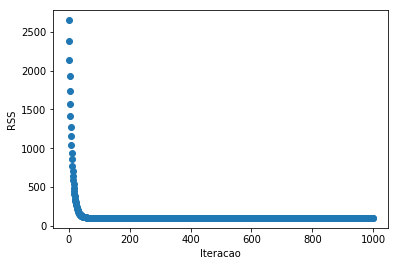

In [22]:
rss_np_array = np.array(rss_history)
x, y = rss_np_array.T
plt.scatter(x,y)
plt.xlabel('Iteracao')
plt.ylabel('RSS')
plt.show()

### 4. Teste valores diferentes do número de iterações e learning_rate até que w0 e w1 sejam aproximadamente iguais a -39 e 5 respectivamente. Reporte os valores do número de iterações e learning_rate usados para atingir esses valores.
    R: Learning Rate: 0.0037, Nº de iterações: 12750


In [23]:
learning_rate = 0.0037
initial_b = 0# initial y-intercept guess
initial_m = 0 # initial slope guess
num_iterations = 12750
print "Starting gradient descent at b = {0}, m = {1}, RSS = {2}".format(initial_b, initial_m, compute_error_for_line_given_points(initial_b, initial_m, points))
print "Running..."
[b, m] = gradient_descent_runner(points, initial_b, initial_m, learning_rate, num_iterations)
print "After {0} iterations b = {1}, m = {2}, RSS = {3}".format(num_iterations, b, m, compute_error_for_line_given_points(b, m, points))

Starting gradient descent at b = 0, m = 0, RSS = 2946.63449705
Running...
Iteração = 0, RSS = 2926.0521029, m = 6.46880089626, b = 0.37107647287
Iteração = 1, RSS = 2905.61805411, m = 0.025065370216, b = -0.0264990462753
Iteração = 2, RSS = 2885.33127927, m = 6.44714037816, b = 0.341805779704
Iteração = 3, RSS = 2865.19071469, m = 0.0499604919138, b = -0.0529885309696
Iteração = 4, RSS = 2845.19530438, m = 6.4256471605, b = 0.312564734787
Iteração = 5, RSS = 2825.34399997, m = 0.0746865873685, b = -0.0794683951828
Iteração = 6, RSS = 2805.63576065, m = 6.40432002706, b = 0.283353251868
Iteração = 7, RSS = 2786.06955317, m = 0.099244870031, b = -0.10593858053
Iteração = 8, RSS = 2766.64435169, m = 6.38315777043, b = 0.254171245225
Iteração = 9, RSS = 2747.35913783, m = 0.123636544591, b = -0.132399029139
Iteração = 10, RSS = 2728.21290054, m = 6.36215919191, b = 0.225018629668
Iteração = 11, RSS = 2709.20463608, m = 0.147862807042, b = -0.158849683643
Iteração = 12, RSS = 2690.33334795,

Iteração = 611, RSS = 112.183049054, m = 3.34471952238, b = -7.5092505527
Iteração = 612, RSS = 111.905908692, m = 4.04885379322, b = -7.47862041719
Iteração = 613, RSS = 111.630546802, m = 3.34860371056, b = -7.53158644235
Iteração = 614, RSS = 111.356950695, m = 4.04765560588, b = -7.50125090913
Iteração = 615, RSS = 111.08510777, m = 3.35246856742, b = -7.55390760327
Iteração = 616, RSS = 110.815005522, m = 4.04647479979, b = -7.52386449252
Iteração = 617, RSS = 110.54663153, m = 3.35631422647, b = -7.5762140387
Iteração = 618, RSS = 110.279973468, m = 4.04531124322, b = -7.54646118636
Iteração = 619, RSS = 110.015019095, m = 3.36014082027, b = -7.5985057519
Iteração = 620, RSS = 109.751756262, m = 4.04416480543, b = -7.56904100959
Iteração = 621, RSS = 109.490172905, m = 3.36394848041, b = -7.62078274621
Iteração = 622, RSS = 109.230257046, m = 4.04303535662, b = -7.5916039811
Iteração = 623, RSS = 108.971996798, m = 3.36773733754, b = -7.64304502499
Iteração = 624, RSS = 108.71538

Iteração = 1171, RSS = 63.2692785872, m = 3.99112604433, b = -13.2078562062
Iteração = 1172, RSS = 63.2419678647, m = 4.08405721169, b = -13.2115909211
Iteração = 1173, RSS = 63.2147036676, m = 3.99255950441, b = -13.2263010493
Iteração = 1174, RSS = 63.1874857661, m = 4.08482291134, b = -13.2300689939
Iteração = 1175, RSS = 63.1603139316, m = 3.99398977608, b = -13.2447330432
Iteração = 1176, RSS = 63.1331879374, m = 4.08559024404, b = -13.2485339353
Iteração = 1177, RSS = 63.1061075581, m = 3.99541687735, b = -13.2631521962
Iteração = 1178, RSS = 63.07907257, m = 4.08635919296, b = -13.2669857554
Iteração = 1179, RSS = 63.0520827509, m = 3.99684082608, b = -13.2815585164
Iteração = 1180, RSS = 63.0251378801, m = 4.08712974138, b = -13.2854244643
Iteração = 1181, RSS = 62.9982377385, m = 3.99826164001, b = -13.2999520118
Iteração = 1182, RSS = 62.9713821085, m = 4.08790187272, b = -13.3038500722
Iteração = 1183, RSS = 62.944570774, m = 3.99967933675, b = -13.3183326905
Iteração = 1184

Iteração = 1625, RSS = 53.7223722754, m = 4.25915514506, b = -17.08076713
Iteração = 1626, RSS = 53.7054188415, m = 4.27743975308, b = -17.0875769495
Iteração = 1627, RSS = 53.6884783525, m = 4.26015646431, b = -17.096501274
Iteração = 1628, RSS = 53.6715507922, m = 4.27831203726, b = -17.103313217
Iteração = 1629, RSS = 53.6546361441, m = 4.26115665861, b = -17.1122243716
Iteração = 1630, RSS = 53.6377343919, m = 4.27918412651, b = -17.1190383867
Iteração = 1631, RSS = 53.6208455193, m = 4.26215573178, b = -17.1279364304
Iteração = 1632, RSS = 53.6039695102, m = 4.28005601792, b = -17.1347524666
Iteração = 1633, RSS = 53.5871063484, m = 4.26315368763, b = -17.143637458
Iteração = 1634, RSS = 53.5702560179, m = 4.28092770865, b = -17.1504554645
Iteração = 1635, RSS = 53.5534185026, m = 4.26415052994, b = -17.1593274619
Iteração = 1636, RSS = 53.5365937866, m = 4.28179919583, b = -17.1661473886
Iteração = 1637, RSS = 53.5197818541, m = 4.26514626246, b = -17.1750064498
Iteração = 1638, 

Iteração = 2016, RSS = 47.9584810702, m = 4.44141287804, b = -19.9555779105
Iteração = 2017, RSS = 47.9457157688, m = 4.43750370695, b = -19.9626934459
Iteração = 2018, RSS = 47.9329595093, m = 4.44221365943, b = -19.9692934804
Iteração = 2019, RSS = 47.9202122851, m = 4.43833539073, b = -19.9764023331
Iteração = 2020, RSS = 47.9074740893, m = 4.44301397921, b = -19.9829993932
Iteração = 2021, RSS = 47.8947449152, m = 4.4391663878, b = -19.9901015799
Iteração = 2022, RSS = 47.882024756, m = 4.44381383698, b = -19.9966956557
Iteração = 2023, RSS = 47.8693136049, m = 4.43999669936, b = -20.0037911933
Iteração = 2024, RSS = 47.8566114553, m = 4.44461323233, b = -20.0103822748
Iteração = 2025, RSS = 47.8439183002, m = 4.44082632663, b = -20.0174711798
Iteração = 2026, RSS = 47.831234133, m = 4.44541216486, b = -20.0240592573
Iteração = 2027, RSS = 47.8185589471, m = 4.44165527081, b = -20.0311415462
Iteração = 2028, RSS = 47.8058927355, m = 4.44621063417, b = -20.0377266099
Iteração = 2029

Iteração = 2443, RSS = 43.2511114122, m = 4.60068441107, b = -22.6753658622
Iteração = 2444, RSS = 43.241666362, m = 4.60195397067, b = -22.6812127162
Iteração = 2445, RSS = 43.2322279605, m = 4.60139022061, b = -22.6871666194
Iteração = 2446, RSS = 43.2227962031, m = 4.60265289945, b = -22.6930097156
Iteração = 2447, RSS = 43.213371085, m = 4.60209551184, b = -22.6989590742
Iteração = 2448, RSS = 43.2039526017, m = 4.60335135801, b = -22.7047984127
Iteração = 2449, RSS = 43.1945407483, m = 4.60280028528, b = -22.7107432324
Iteração = 2450, RSS = 43.1851355202, m = 4.60404934652, b = -22.7165788134
Iteração = 2451, RSS = 43.1757369128, m = 4.60350454144, b = -22.7225190999
Iteração = 2452, RSS = 43.1663449213, m = 4.60474686517, b = -22.7283509234
Iteração = 2453, RSS = 43.1569595411, m = 4.60420828085, b = -22.7342866826
Iteração = 2454, RSS = 43.1475807675, m = 4.60544391413, b = -22.7401147487
Iteração = 2455, RSS = 43.1382085958, m = 4.60491150402, b = -22.7460459861
Iteração = 245

Iteração = 2923, RSS = 39.4027038857, m = 4.75624315085, b = -25.2821773386
Iteração = 2924, RSS = 39.3959671519, m = 4.75670100971, b = -25.2871519425
Iteração = 2925, RSS = 39.3892351586, m = 4.7568370278, b = -25.2921439448
Iteração = 2926, RSS = 39.3825079024, m = 4.75729351365, b = -25.2971151108
Iteração = 2927, RSS = 39.3757853799, m = 4.75743048306, b = -25.3021035382
Iteração = 2928, RSS = 39.3690675879, m = 4.75788560446, b = -25.3070712683
Iteração = 2929, RSS = 39.3623545229, m = 4.75802351695, b = -25.3120561236
Iteração = 2930, RSS = 39.3556461817, m = 4.7584772824, b = -25.3170204198
Iteração = 2931, RSS = 39.348942561, m = 4.75861612981, b = -25.3220017061
Iteração = 2932, RSS = 39.3422436574, m = 4.75906854774, b = -25.3269625704
Iteração = 2933, RSS = 39.3355494676, m = 4.75920832195, b = -25.3319402905
Iteração = 2934, RSS = 39.3288599882, m = 4.75965940073, b = -25.3368977248
Iteração = 2935, RSS = 39.322175216, m = 4.7598000937, b = -25.3418718818
Iteração = 2936, 

Iteração = 3447, RSS = 36.4494673221, m = 4.8983130997, b = -27.6676288976
Iteração = 3448, RSS = 36.4448086618, m = 4.89858394442, b = -27.6717722419
Iteração = 3449, RSS = 36.4401532796, m = 4.89880656069, b = -27.6759169935
Iteração = 3450, RSS = 36.4355011733, m = 4.89907705758, b = -27.6800574316
Iteração = 3451, RSS = 36.4308523404, m = 4.89929967388, b = -27.6841992574
Iteração = 3452, RSS = 36.4262067787, m = 4.89956982434, b = -27.6883367914
Iteração = 3453, RSS = 36.4215644858, m = 4.89979243952, b = -27.6924756935
Iteração = 3454, RSS = 36.4169254596, m = 4.90006224491, b = -27.6966103253
Iteração = 3455, RSS = 36.4122896976, m = 4.90028485787, b = -27.7007463058
Iteração = 3456, RSS = 36.4076571976, m = 4.90055431955, b = -27.7048780375
Iteração = 3457, RSS = 36.4030279573, m = 4.90077692916, b = -27.7090110986
Iteração = 3458, RSS = 36.3984019744, m = 4.9010460485, b = -27.713139932
Iteração = 3459, RSS = 36.3937792466, m = 4.90126865366, b = -27.7172700757
Iteração = 3460

Iteração = 3826, RSS = 34.899188625, m = 4.98588602536, b = -29.1384963604
Iteração = 3827, RSS = 34.8956208277, m = 4.98609584137, b = -29.1421239199
Iteração = 3828, RSS = 34.8920555408, m = 4.98631776645, b = -29.1457494776
Iteração = 3829, RSS = 34.8884927628, m = 4.98652747462, b = -29.1493744821
Iteração = 3830, RSS = 34.8849324916, m = 4.98674920388, b = -29.1529974911
Iteração = 3831, RSS = 34.8813747257, m = 4.986958804, b = -29.1566199425
Iteração = 3832, RSS = 34.8778194633, m = 4.98718033788, b = -29.1602404045
Iteração = 3833, RSS = 34.8742667025, m = 4.98738982973, b = -29.1638603046
Iteração = 3834, RSS = 34.8707164416, m = 4.98761116864, b = -29.1674782213
Iteração = 3835, RSS = 34.8671686789, m = 4.98782055203, b = -29.171095572
Iteração = 3836, RSS = 34.8636234126, m = 4.98804169639, b = -29.1747109453
Iteração = 3837, RSS = 34.860080641, m = 4.9882509711, b = -29.1783257482
Iteração = 3838, RSS = 34.8565403622, m = 4.98847192134, b = -29.1819385798
Iteração = 3839, R

Iteração = 4199, RSS = 33.7283548349, m = 5.06137096134, b = -30.4066197952
Iteração = 4200, RSS = 33.7256109016, m = 5.06156189601, b = -30.4098006577
Iteração = 4201, RSS = 33.7228688992, m = 5.0617496121, b = -30.4129805885
Iteração = 4202, RSS = 33.7201288261, m = 5.06194040213, b = -30.4161592133
Iteração = 4203, RSS = 33.7173906812, m = 5.06212799638, b = -30.4193369059
Iteração = 4204, RSS = 33.7146544629, m = 5.06231864194, b = -30.4225132947
Iteração = 4205, RSS = 33.71192017, m = 5.06250611438, b = -30.4256887506
Iteração = 4206, RSS = 33.7091878012, m = 5.06269661564, b = -30.4288629049
Iteração = 4207, RSS = 33.7064573549, m = 5.06288396627, b = -30.4320361259
Iteração = 4208, RSS = 33.70372883, m = 5.06307432341, b = -30.4352080473
Iteração = 4209, RSS = 33.701002225, m = 5.06326155225, b = -30.4383790347
Iteração = 4210, RSS = 33.6982775385, m = 5.06345176545, b = -30.4415487248
Iteração = 4211, RSS = 33.6955547694, m = 5.0636388725, b = -30.4447174804
Iteração = 4212, RS

Iteração = 4639, RSS = 32.6897288602, m = 5.13857109664, b = -31.7034810697
Iteração = 4640, RSS = 32.6877157622, m = 5.13873360709, b = -31.7062056548
Iteração = 4641, RSS = 32.6857040808, m = 5.13889542096, b = -31.7089293192
Iteração = 4642, RSS = 32.6836938149, m = 5.13905781497, b = -31.7116519872
Iteração = 4643, RSS = 32.6816849635, m = 5.13921951706, b = -31.7143737349
Iteração = 4644, RSS = 32.6796775257, m = 5.13938179473, b = -31.7170944872
Iteração = 4645, RSS = 32.6776715004, m = 5.1395433851, b = -31.7198143196
Iteração = 4646, RSS = 32.6756668866, m = 5.13970554653, b = -31.7225331576
Iteração = 4647, RSS = 32.6736636834, m = 5.13986702525, b = -31.7252510761
Iteração = 4648, RSS = 32.6716618898, m = 5.14002907052, b = -31.727968001
Iteração = 4649, RSS = 32.6696615048, m = 5.14019043765, b = -31.7306840069
Iteração = 4650, RSS = 32.6676625273, m = 5.14035236687, b = -31.7333990202
Iteração = 4651, RSS = 32.6656649564, m = 5.14051362248, b = -31.7361131148
Iteração = 465

Iteração = 5048, RSS = 31.9740405402, m = 5.20036454483, b = -32.7415353443
Iteração = 5049, RSS = 31.9725310405, m = 5.20050491781, b = -32.743894672
Iteração = 5050, RSS = 31.971022603, m = 5.20064538655, b = -32.7462531609
Iteração = 5051, RSS = 31.9695152269, m = 5.20078566123, b = -32.7486108284
Iteração = 5052, RSS = 31.9680089115, m = 5.20092603065, b = -32.7509676577
Iteração = 5053, RSS = 31.966503656, m = 5.20106620709, b = -32.7533236661
Iteração = 5054, RSS = 31.9649994596, m = 5.20120647728, b = -32.7556788371
Iteração = 5055, RSS = 31.9634963218, m = 5.20134655555, b = -32.7580331877
Iteração = 5056, RSS = 31.9619942416, m = 5.20148672657, b = -32.7603867014
Iteração = 5057, RSS = 31.9604932183, m = 5.20162670674, b = -32.7627393954
Iteração = 5058, RSS = 31.9589932513, m = 5.20176677866, b = -32.7650912531
Iteração = 5059, RSS = 31.9574943397, m = 5.2019066608, b = -32.7674422915
Iteração = 5060, RSS = 31.9559964828, m = 5.2020466337, b = -32.7697924943
Iteração = 5061, 

Iteração = 5513, RSS = 31.375215172, m = 5.26061832287, b = -33.7537290097
Iteração = 5514, RSS = 31.3741270393, m = 5.26073757934, b = -33.7557321515
Iteração = 5515, RSS = 31.3730396723, m = 5.26085676694, b = -33.7577345901
Iteração = 5516, RSS = 31.3719530704, m = 5.26097593941, b = -33.7597363225
Iteração = 5517, RSS = 31.3708672331, m = 5.26109504323, b = -33.7617373521
Iteração = 5518, RSS = 31.3697821598, m = 5.26121413176, b = -33.7637376759
Iteração = 5519, RSS = 31.3686978501, m = 5.26133315186, b = -33.7657372975
Iteração = 5520, RSS = 31.3676143033, m = 5.2614521565, b = -33.7677362138
Iteração = 5521, RSS = 31.366531519, m = 5.26157109294, b = -33.7697344282
Iteração = 5522, RSS = 31.3654494966, m = 5.26169001375, b = -33.771731938
Iteração = 5523, RSS = 31.3643682356, m = 5.26180886659, b = -33.7737287464
Iteração = 5524, RSS = 31.3632877354, m = 5.26192770364, b = -33.7757248506
Iteração = 5525, RSS = 31.3622079955, m = 5.26204647293, b = -33.777720254
Iteração = 5526, 

Iteração = 5870, RSS = 31.0315960473, m = 5.3006293211, b = -34.4258667977
Iteração = 5871, RSS = 31.0307497042, m = 5.30073448094, b = -34.4276334221
Iteração = 5872, RSS = 31.0299039566, m = 5.30083961114, b = -34.4293994245
Iteração = 5873, RSS = 31.0290588042, m = 5.30094469701, b = -34.4311648058
Iteração = 5874, RSS = 31.0282142464, m = 5.30104975322, b = -34.4329295655
Iteração = 5875, RSS = 31.027370283, m = 5.30115476516, b = -34.4346937047
Iteração = 5876, RSS = 31.0265269133, m = 5.30125974742, b = -34.4364572226
Iteração = 5877, RSS = 31.0256841372, m = 5.3013646855, b = -34.4382201203
Iteração = 5878, RSS = 31.024841954, m = 5.30146959386, b = -34.4399823973
Iteração = 5879, RSS = 31.0240003635, m = 5.30157445812, b = -34.4417440547
Iteração = 5880, RSS = 31.0231593651, m = 5.30167929264, b = -34.4435050916
Iteração = 5881, RSS = 31.0223189586, m = 5.30178408314, b = -34.4452655093
Iteração = 5882, RSS = 31.0214791433, m = 5.30188884387, b = -34.4470253071
Iteração = 5883,

Iteração = 6242, RSS = 30.7545054321, m = 5.33730383953, b = -35.041955799
Iteração = 6243, RSS = 30.7538540654, m = 5.33739609672, b = -35.0435056278
Iteração = 6244, RSS = 30.7532031571, m = 5.33748832335, b = -35.0450549111
Iteração = 6245, RSS = 30.7525527068, m = 5.33758051562, b = -35.0466036494
Iteração = 6246, RSS = 30.7519027142, m = 5.33767267735, b = -35.0481518426
Iteração = 6247, RSS = 30.751253179, m = 5.33776480475, b = -35.0496994911
Iteração = 6248, RSS = 30.7506041008, m = 5.33785690162, b = -35.0512465949
Iteração = 6249, RSS = 30.7499554793, m = 5.33794896421, b = -35.0527931543
Iteração = 6250, RSS = 30.7493073142, m = 5.33804099627, b = -35.0543391695
Iteração = 6251, RSS = 30.7486596053, m = 5.33813299408, b = -35.0558846407
Iteração = 6252, RSS = 30.7480123521, m = 5.33822496138, b = -35.057429568
Iteração = 6253, RSS = 30.7473655543, m = 5.33831689446, b = -35.0589739518
Iteração = 6254, RSS = 30.7467192116, m = 5.33840879704, b = -35.060517792
Iteração = 6255,

Iteração = 6752, RSS = 30.475299758, m = 5.38038200681, b = -35.7656185883
Iteração = 6753, RSS = 30.4748448561, m = 5.38045910603, b = -35.7669137675
Iteração = 6754, RSS = 30.4743902742, m = 5.38053617842, b = -35.7682084909
Iteração = 6755, RSS = 30.4739360122, m = 5.38061322339, b = -35.7695027588
Iteração = 6756, RSS = 30.4734820699, m = 5.38069024154, b = -35.7707965711
Iteração = 6757, RSS = 30.473028447, m = 5.3807672323, b = -35.7720899282
Iteração = 6758, RSS = 30.4725751433, m = 5.38084419626, b = -35.7733828302
Iteração = 6759, RSS = 30.4721221585, m = 5.38092113285, b = -35.7746752772
Iteração = 6760, RSS = 30.4716694925, m = 5.38099804265, b = -35.7759672694
Iteração = 6761, RSS = 30.471217145, m = 5.3810749251, b = -35.777258807
Iteração = 6762, RSS = 30.4707651158, m = 5.38115178078, b = -35.7785498901
Iteração = 6763, RSS = 30.4703134047, m = 5.38122860913, b = -35.7798405189
Iteração = 6764, RSS = 30.4698620114, m = 5.38130541074, b = -35.7811306935
Iteração = 6765, R

Iteração = 7120, RSS = 30.3277688788, m = 5.40699869722, b = -36.2127478305
Iteração = 7121, RSS = 30.3274177879, m = 5.40706643041, b = -36.2138856694
Iteração = 7122, RSS = 30.3270669439, m = 5.40713413984, b = -36.215023108
Iteração = 7123, RSS = 30.3267163469, m = 5.40720182537, b = -36.2161601462
Iteração = 7124, RSS = 30.3263659965, m = 5.40726948716, b = -36.2172967844
Iteração = 7125, RSS = 30.3260158927, m = 5.40733712506, b = -36.2184330226
Iteração = 7126, RSS = 30.3256660352, m = 5.40740473923, b = -36.219568861
Iteração = 7127, RSS = 30.3253164239, m = 5.40747232954, b = -36.2207042997
Iteração = 7128, RSS = 30.3249670586, m = 5.40753989614, b = -36.2218393388
Iteração = 7129, RSS = 30.3246179391, m = 5.40760743889, b = -36.2229739785
Iteração = 7130, RSS = 30.3242690653, m = 5.40767495794, b = -36.224108219
Iteração = 7131, RSS = 30.323920437, m = 5.40774245316, b = -36.2252420603
Iteração = 7132, RSS = 30.323572054, m = 5.40780992471, b = -36.2263755026
Iteração = 7133, 

Iteração = 7581, RSS = 30.1895036243, m = 5.43582727987, b = -36.6970342724
Iteração = 7582, RSS = 30.1892498245, m = 5.43588486862, b = -36.6980016958
Iteração = 7583, RSS = 30.1889962033, m = 5.43594243709, b = -36.6989687788
Iteração = 7584, RSS = 30.1887427605, m = 5.43599998531, b = -36.6999355216
Iteração = 7585, RSS = 30.1884894961, m = 5.43605751327, b = -36.7009019241
Iteração = 7586, RSS = 30.1882364098, m = 5.43611502101, b = -36.7018679866
Iteração = 7587, RSS = 30.1879835017, m = 5.43617250849, b = -36.7028337091
Iteração = 7588, RSS = 30.1877307715, m = 5.43622997576, b = -36.7037990918
Iteração = 7589, RSS = 30.1874782192, m = 5.43628742279, b = -36.7047641347
Iteração = 7590, RSS = 30.1872258445, m = 5.43634484962, b = -36.7057288381
Iteração = 7591, RSS = 30.1869736475, m = 5.43640225622, b = -36.7066932021
Iteração = 7592, RSS = 30.1867216279, m = 5.43645964264, b = -36.7076572266
Iteração = 7593, RSS = 30.1864697856, m = 5.43651700886, b = -36.708620912
Iteração = 75

Iteração = 8093, RSS = 30.0803589876, m = 5.46281347339, b = -37.1503707332
Iteração = 8094, RSS = 30.080181988, m = 5.46286156597, b = -37.1511786322
Iteração = 8095, RSS = 30.080005113, m = 5.46290964162, b = -37.1519862469
Iteração = 8096, RSS = 30.0798283625, m = 5.46295770035, b = -37.1527935773
Iteração = 8097, RSS = 30.0796517363, m = 5.46300574217, b = -37.1536006237
Iteração = 8098, RSS = 30.0794752344, m = 5.46305376709, b = -37.1544073861
Iteração = 8099, RSS = 30.0792988567, m = 5.46310177511, b = -37.1552138646
Iteração = 8100, RSS = 30.0791226031, m = 5.46314976623, b = -37.1560200593
Iteração = 8101, RSS = 30.0789464735, m = 5.46319774047, b = -37.1568259703
Iteração = 8102, RSS = 30.0787704679, m = 5.46324569782, b = -37.1576315977
Iteração = 8103, RSS = 30.0785945861, m = 5.4632936383, b = -37.1584369417
Iteração = 8104, RSS = 30.0784188281, m = 5.46334156191, b = -37.1592420022
Iteração = 8105, RSS = 30.0782431937, m = 5.46338946866, b = -37.1600467794
Iteração = 8106

Iteração = 8383, RSS = 30.0339127973, m = 5.47607451347, b = -37.373140683
Iteração = 8384, RSS = 30.0337684799, m = 5.47611793962, b = -37.3738701915
Iteração = 8385, RSS = 30.033624264, m = 5.47616135048, b = -37.3745994433
Iteração = 8386, RSS = 30.0334801496, m = 5.47620474608, b = -37.3753284384
Iteração = 8387, RSS = 30.0333361366, m = 5.4762481264, b = -37.376057177
Iteração = 8388, RSS = 30.033192225, m = 5.47629149146, b = -37.3767856592
Iteração = 8389, RSS = 30.0330484146, m = 5.47633484125, b = -37.3775138851
Iteração = 8390, RSS = 30.0329047054, m = 5.47637817579, b = -37.3782418546
Iteração = 8391, RSS = 30.0327610973, m = 5.47642149509, b = -37.3789695681
Iteração = 8392, RSS = 30.0326175903, m = 5.47646479914, b = -37.3796970254
Iteração = 8393, RSS = 30.0324741843, m = 5.47650808795, b = -37.3804242268
Iteração = 8394, RSS = 30.0323308791, m = 5.47655136153, b = -37.3811511722
Iteração = 8395, RSS = 30.0321876748, m = 5.47659461988, b = -37.3818778619
Iteração = 8396, 

Iteração = 8601, RSS = 30.0047363326, m = 5.48518895426, b = -37.5262526189
Iteração = 8602, RSS = 30.0046125454, m = 5.48522917313, b = -37.5269282488
Iteração = 8603, RSS = 30.0044888453, m = 5.48526937784, b = -37.527603641
Iteração = 8604, RSS = 30.0043652322, m = 5.48530956841, b = -37.5282787955
Iteração = 8605, RSS = 30.0042417061, m = 5.48534974484, b = -37.5289537124
Iteração = 8606, RSS = 30.0041182669, m = 5.48538990713, b = -37.5296283919
Iteração = 8607, RSS = 30.0039949146, m = 5.48543005529, b = -37.5303028339
Iteração = 8608, RSS = 30.003871649, m = 5.48547018932, b = -37.5309770386
Iteração = 8609, RSS = 30.0037484702, m = 5.48551030922, b = -37.5316510061
Iteração = 8610, RSS = 30.0036253781, m = 5.48555041501, b = -37.5323247364
Iteração = 8611, RSS = 30.0035023726, m = 5.48559050669, b = -37.5329982296
Iteração = 8612, RSS = 30.0033794537, m = 5.48563058425, b = -37.5336714858
Iteração = 8613, RSS = 30.0032566212, m = 5.48567064772, b = -37.5343445051
Iteração = 861

Iteração = 8983, RSS = 29.9632590152, m = 5.49956707754, b = -37.7677882589
Iteração = 8984, RSS = 29.9631644137, m = 5.4996022369, b = -37.7683788949
Iteração = 8985, RSS = 29.9630698788, m = 5.49963738388, b = -37.768969323
Iteração = 8986, RSS = 29.9629754104, m = 5.49967251849, b = -37.7695595434
Iteração = 8987, RSS = 29.9628810085, m = 5.49970764074, b = -37.7701495561
Iteração = 8988, RSS = 29.962786673, m = 5.49974275063, b = -37.7707393612
Iteração = 8989, RSS = 29.9626924039, m = 5.49977784817, b = -37.7713289587
Iteração = 8990, RSS = 29.9625982011, m = 5.49981293336, b = -37.7719183488
Iteração = 8991, RSS = 29.9625040647, m = 5.4998480062, b = -37.7725075314
Iteração = 8992, RSS = 29.9624099944, m = 5.4998830667, b = -37.7730965068
Iteração = 8993, RSS = 29.9623159903, m = 5.49991811486, b = -37.7736852749
Iteração = 8994, RSS = 29.9622220524, m = 5.49995315069, b = -37.7742738357
Iteração = 8995, RSS = 29.9621281806, m = 5.49998817418, b = -37.7748621895
Iteração = 8996, 

Iteração = 9225, RSS = 29.9422017868, m = 5.50772480153, b = -37.9048284724
Iteração = 9226, RSS = 29.9421220024, m = 5.50775709027, b = -37.9053708853
Iteração = 9227, RSS = 29.9420422741, m = 5.50778936764, b = -37.9059131074
Iteração = 9228, RSS = 29.9419626019, m = 5.50782163365, b = -37.9064551387
Iteração = 9229, RSS = 29.9418829858, m = 5.50785388831, b = -37.9069969792
Iteração = 9230, RSS = 29.9418034257, m = 5.50788613162, b = -37.907538629
Iteração = 9231, RSS = 29.9417239215, m = 5.50791836358, b = -37.9080800883
Iteração = 9232, RSS = 29.9416444734, m = 5.50795058421, b = -37.908621357
Iteração = 9233, RSS = 29.9415650811, m = 5.50798279349, b = -37.9091624353
Iteração = 9234, RSS = 29.9414857447, m = 5.50801499144, b = -37.9097033231
Iteração = 9235, RSS = 29.9414064641, m = 5.50804717806, b = -37.9102440207
Iteração = 9236, RSS = 29.9413272393, m = 5.50807935335, b = -37.9107845279
Iteração = 9237, RSS = 29.9412480702, m = 5.50811151732, b = -37.911324845
Iteração = 9238

Iteração = 9574, RSS = 29.9175048518, m = 5.51833084498, b = -38.0829975868
Iteração = 9575, RSS = 29.9174424455, m = 5.51835940155, b = -38.0834773038
Iteração = 9576, RSS = 29.9173800831, m = 5.51838794808, b = -38.0839568521
Iteração = 9577, RSS = 29.9173177646, m = 5.51841648456, b = -38.0844362315
Iteração = 9578, RSS = 29.91725549, m = 5.518445011, b = -38.0849154423
Iteração = 9579, RSS = 29.9171932592, m = 5.5184735274, b = -38.0853944845
Iteração = 9580, RSS = 29.9171310721, m = 5.51850203377, b = -38.0858733581
Iteração = 9581, RSS = 29.9170689288, m = 5.5185305301, b = -38.0863520631
Iteração = 9582, RSS = 29.9170068293, m = 5.51855901641, b = -38.0868305998
Iteração = 9583, RSS = 29.9169447734, m = 5.5185874927, b = -38.087308968
Iteração = 9584, RSS = 29.9168827612, m = 5.51861595896, b = -38.0877871679
Iteração = 9585, RSS = 29.9168207927, m = 5.51864441521, b = -38.0882651995
Iteração = 9586, RSS = 29.9167588677, m = 5.51867286144, b = -38.0887430629
Iteração = 9587, RSS

Iteração = 9877, RSS = 29.9004702132, m = 5.52653953883, b = -38.2208940343
Iteração = 9878, RSS = 29.9004197934, m = 5.52656520685, b = -38.221325227
Iteração = 9879, RSS = 29.9003694092, m = 5.52659086583, b = -38.2217562679
Iteração = 9880, RSS = 29.9003190603, m = 5.52661651579, b = -38.2221871572
Iteração = 9881, RSS = 29.9002687469, m = 5.52664215672, b = -38.2226178948
Iteração = 9882, RSS = 29.9002184689, m = 5.52666778863, b = -38.2230484809
Iteração = 9883, RSS = 29.9001682263, m = 5.52669341152, b = -38.2234789154
Iteração = 9884, RSS = 29.900118019, m = 5.52671902539, b = -38.2239091985
Iteração = 9885, RSS = 29.9000678471, m = 5.52674463025, b = -38.2243393301
Iteração = 9886, RSS = 29.9000177104, m = 5.5267702261, b = -38.2247693105
Iteração = 9887, RSS = 29.8999676091, m = 5.52679581294, b = -38.2251991395
Iteração = 9888, RSS = 29.899917543, m = 5.52682139078, b = -38.2256288172
Iteração = 9889, RSS = 29.8998675121, m = 5.52684695962, b = -38.2260583438
Iteração = 9890,

Iteração = 10329, RSS = 29.8809432889, m = 5.53726758913, b = -38.4011127211
Iteração = 10330, RSS = 29.8809066094, m = 5.53728948206, b = -38.4014804966
Iteração = 10331, RSS = 29.8808699557, m = 5.53731136728, b = -38.4018481428
Iteração = 10332, RSS = 29.8808333278, m = 5.53733324481, b = -38.4022156595
Iteração = 10333, RSS = 29.8807967256, m = 5.53735511463, b = -38.4025830469
Iteração = 10334, RSS = 29.8807601492, m = 5.53737697676, b = -38.4029503051
Iteração = 10335, RSS = 29.8807235985, m = 5.53739883119, b = -38.403317434
Iteração = 10336, RSS = 29.8806870736, m = 5.53742067794, b = -38.4036844337
Iteração = 10337, RSS = 29.8806505743, m = 5.53744251699, b = -38.4040513043
Iteração = 10338, RSS = 29.8806141008, m = 5.53746434836, b = -38.4044180458
Iteração = 10339, RSS = 29.8805776529, m = 5.53748617205, b = -38.4047846583
Iteração = 10340, RSS = 29.8805412306, m = 5.53750798806, b = -38.4051511417
Iteração = 10341, RSS = 29.880504834, m = 5.5375297964, b = -38.4055174962
It

Iteração = 10757, RSS = 29.8673838572, m = 5.54596769425, b = -38.5472643027
Iteração = 10758, RSS = 29.8673567189, m = 5.5459865257, b = -38.5475806489
Iteração = 10759, RSS = 29.8673295996, m = 5.54600535052, b = -38.5478968839
Iteração = 10760, RSS = 29.8673024994, m = 5.54602416872, b = -38.5482130076
Iteração = 10761, RSS = 29.8672754183, m = 5.5460429803, b = -38.5485290201
Iteração = 10762, RSS = 29.8672483563, m = 5.54606178525, b = -38.5488449213
Iteração = 10763, RSS = 29.8672213132, m = 5.54608058359, b = -38.5491607114
Iteração = 10764, RSS = 29.8671942893, m = 5.54609937531, b = -38.5494763903
Iteração = 10765, RSS = 29.8671672843, m = 5.54611816043, b = -38.5497919582
Iteração = 10766, RSS = 29.8671402983, m = 5.54613693893, b = -38.5501074151
Iteração = 10767, RSS = 29.8671133313, m = 5.54615571082, b = -38.5504227609
Iteração = 10768, RSS = 29.8670863833, m = 5.54617447611, b = -38.5507379957
Iteração = 10769, RSS = 29.8670594543, m = 5.54619323479, b = -38.5510531197
I

Iteração = 11223, RSS = 29.8565983844, m = 5.55406272487, b = -38.6832513409
Iteração = 11224, RSS = 29.8565788353, m = 5.55407870776, b = -38.6835198347
Iteração = 11225, RSS = 29.8565592999, m = 5.55409468502, b = -38.6837882341
Iteração = 11226, RSS = 29.8565397784, m = 5.55411065667, b = -38.684056539
Iteração = 11227, RSS = 29.8565202705, m = 5.55412662269, b = -38.6843247495
Iteração = 11228, RSS = 29.8565007764, m = 5.55414258309, b = -38.6845928656
Iteração = 11229, RSS = 29.8564812959, m = 5.55415853788, b = -38.6848608873
Iteração = 11230, RSS = 29.8564618292, m = 5.55417448706, b = -38.6851288148
Iteração = 11231, RSS = 29.8564423762, m = 5.55419043062, b = -38.685396648
Iteração = 11232, RSS = 29.8564229369, m = 5.55420636857, b = -38.6856643869
Iteração = 11233, RSS = 29.8564035113, m = 5.55422230091, b = -38.6859320316
Iteração = 11234, RSS = 29.8563840993, m = 5.55423822765, b = -38.6861995821
Iteração = 11235, RSS = 29.856364701, m = 5.55425414878, b = -38.6864670385
It

Iteração = 11988, RSS = 29.8450307458, m = 5.56478381002, b = -38.8633530213
Iteração = 11989, RSS = 29.8450193363, m = 5.56479602027, b = -38.8635581391
Iteração = 11990, RSS = 29.8450079349, m = 5.56480822622, b = -38.8637631848
Iteração = 11991, RSS = 29.8449965415, m = 5.56482042788, b = -38.8639681584
Iteração = 11992, RSS = 29.8449851561, m = 5.56483262524, b = -38.8641730598
Iteração = 11993, RSS = 29.8449737787, m = 5.56484481831, b = -38.8643778891
Iteração = 11994, RSS = 29.8449624093, m = 5.56485700709, b = -38.8645826464
Iteração = 11995, RSS = 29.8449510479, m = 5.56486919158, b = -38.8647873315
Iteração = 11996, RSS = 29.8449396945, m = 5.56488137179, b = -38.8649919447
Iteração = 11997, RSS = 29.8449283492, m = 5.5648935477, b = -38.8651964859
Iteração = 11998, RSS = 29.8449170117, m = 5.56490571934, b = -38.865400955
Iteração = 11999, RSS = 29.8449056823, m = 5.56491788669, b = -38.8656053523
Iteração = 12000, RSS = 29.8448943609, m = 5.56493004975, b = -38.8658096776
I

Iteração = 12267, RSS = 29.8421395698, m = 5.56802912546, b = -38.9178705216
Iteração = 12268, RSS = 29.8421301947, m = 5.56804019371, b = -38.9180564553
Iteração = 12269, RSS = 29.8421208263, m = 5.56805125807, b = -38.9182423236
Iteração = 12270, RSS = 29.8421114644, m = 5.56806231854, b = -38.9184281265
Iteração = 12271, RSS = 29.8421021091, m = 5.56807337511, b = -38.918613864
Iteração = 12272, RSS = 29.8420927604, m = 5.5680844278, b = -38.9187995362
Iteração = 12273, RSS = 29.8420834183, m = 5.56809547659, b = -38.918985143
Iteração = 12274, RSS = 29.8420740827, m = 5.5681065215, b = -38.9191706845
Iteração = 12275, RSS = 29.8420647537, m = 5.56811756252, b = -38.9193561607
Iteração = 12276, RSS = 29.8420554313, m = 5.56812859965, b = -38.9195415717
Iteração = 12277, RSS = 29.8420461154, m = 5.5681396329, b = -38.9197269174
Iteração = 12278, RSS = 29.8420368061, m = 5.56815066227, b = -38.9199121978
Iteração = 12279, RSS = 29.8420275034, m = 5.56816168776, b = -38.9200974131
Iter

Iteração = 12515, RSS = 29.840005428, m = 5.57065813169, b = -38.9620347488
Iteração = 12516, RSS = 29.8399975546, m = 5.57066827483, b = -38.9622051416
Iteração = 12517, RSS = 29.8399896868, m = 5.57067841439, b = -38.9623754744
Iteração = 12518, RSS = 29.8399818245, m = 5.57068855039, b = -38.9625457473
Iteração = 12519, RSS = 29.8399739677, m = 5.57069868282, b = -38.9627159603
Iteração = 12520, RSS = 29.8399661165, m = 5.57070881168, b = -38.9628861134
Iteração = 12521, RSS = 29.8399582708, m = 5.57071893699, b = -38.9630562065
Iteração = 12522, RSS = 29.8399504306, m = 5.57072905872, b = -38.9632262399
Iteração = 12523, RSS = 29.839942596, m = 5.5707391769, b = -38.9633962134
Iteração = 12524, RSS = 29.8399347668, m = 5.57074929151, b = -38.9635661271
Iteração = 12525, RSS = 29.8399269432, m = 5.57075940257, b = -38.963735981
Iteração = 12526, RSS = 29.839919125, m = 5.57076951007, b = -38.9639057751
Iteração = 12527, RSS = 29.8399113124, m = 5.57077961401, b = -38.9640755095
Iter

### 5. O algoritmo do vídeo usa o número de iterações como critério de parada. Mude o algoritmo para considerar um critério de parada que é relacionado ao tamanho do gradiente (como no algoritmo apresentado em sala). Plote o tamanho do gradiente vs número de iterações.

In [28]:
def gradient_descent_runner(points, initial_b, initial_m, learning_rate):
    b = initial_b
    m = initial_m
    rss = []
    gradient_size = []
    iterations = 0
    size = 0.1
    size_current = float("inf")
    while (size_current >= size):
        b, m, size_current = step_gradient(b, m, np.array(points), learning_rate)
        rss.append(compute_error_for_line_given_points(b, m, points)*float(len(points)))
        gradient_size.append(size_current)
        print "Iteração = {0} b = {1} m = {2} RSS = {3} gradient_size = {4}".format(iterations, b, m, rss[iterations], size_current)
        iterations = iterations + 1
    return [b, m, rss, gradient_size, iterations]

def step_gradient(b_current, m_current, points, learningRate):
    b_gradient = 0
    m_gradient = 0
    N = float(len(points))
    for i in range(0, len(points)):
        x = points[i, 0]
        y = points[i, 1]
        b_gradient += -(2/N) * (y - ((m_current * x) + b_current))
        m_gradient += -(2/N) * (y - ((m_current * x) + b_current)) * x
    new_b = b_current - (learningRate * b_gradient)
    new_m = m_current - (learningRate * m_gradient)
    return [new_b, new_m, tensor(b_gradient, m_gradient)]

def tensor(b_gradient, m_gradient):
    return np.math.sqrt(np.math.pow(b_gradient, 2) + np.math.pow(m_gradient, 2))

initial_b = 0# initial y-intercept guess
initial_m = 0 # initial slope guess
print "Starting gradient descent at b = {0}, m = {1}, RSS = {2}".format(initial_b, initial_m, compute_error_for_line_given_points(initial_b, initial_m, points))
print "Running..."
b, m, rss, gradient_size, iterations = gradient_descent_runner(points, initial_b, initial_m, learning_rate)

Starting gradient descent at b = 0, m = 0, RSS = 2946.63449705
Running...
Iteração = 0 b = 0.100290938614 m = 1.74832456656 RSS = 21218.1304977 gradient_size = 1751.19875011
Iteração = 1 b = 0.14443490922 m = 2.55343975237 RSS = 6975.26339205 gradient_size = 806.324471027
Iteração = 2 b = 0.162726905939 m = 2.92426599566 RSS = 3955.40076208 gradient_size = 371.277120022
Iteração = 3 b = 0.16911587888 m = 3.09512933005 RSS = 3314.84493191 gradient_size = 170.982741862
Iteração = 4 b = 0.170024447174 m = 3.17392223917 RSS = 3178.70852227 gradient_size = 78.7981473381
Iteração = 5 b = 0.16840982524 m = 3.21032246407 RSS = 3149.51043264 gradient_size = 36.4360175799
Iteração = 6 b = 0.165633625353 m = 3.22720349765 RSS = 3142.98361473 gradient_size = 17.1077929715
Iteração = 7 b = 0.162322784791 m = 3.23509715285 RSS = 3141.26323064 gradient_size = 8.55987486048
Iteração = 8 b = 0.158765968944 m = 3.23885267087 RSS = 3140.56188733 gradient_size = 5.17250950776
Iteração = 9 b = 0.1550960901

Iteração = 556 b = -1.85241483918 m = 3.36159825942 RSS = 2918.19078611 gradient_size = 3.58204589051
Iteração = 557 b = -1.85599021519 m = 3.36181109425 RSS = 2917.80594604 gradient_size = 3.58170521873
Iteração = 558 b = -1.85956525116 m = 3.36202390884 RSS = 2917.42117917 gradient_size = 3.58136457935
Iteração = 559 b = -1.86313994713 m = 3.36223670319 RSS = 2917.03648549 gradient_size = 3.58102397237
Iteração = 560 b = -1.86671430312 m = 3.3624494773 RSS = 2916.65186497 gradient_size = 3.58068339778
Iteração = 561 b = -1.87028831918 m = 3.36266223117 RSS = 2916.26731761 gradient_size = 3.58034285558
Iteração = 562 b = -1.87386199532 m = 3.36287496482 RSS = 2915.88284339 gradient_size = 3.58000234577
Iteração = 563 b = -1.87743533159 m = 3.36308767823 RSS = 2915.49844229 gradient_size = 3.57966186835
Iteração = 564 b = -1.88100832802 m = 3.3633003714 RSS = 2915.11411432 gradient_size = 3.5793214233
Iteração = 565 b = -1.88458098464 m = 3.36351304436 RSS = 2914.72985944 gradient_size

Iteração = 1131 b = -3.853146983 m = 3.4806977572 RSS = 2708.55997527 gradient_size = 3.39141056294
Iteração = 1132 b = -3.85653207865 m = 3.48089926503 RSS = 2708.21500733 gradient_size = 3.3910880216
Iteração = 1133 b = -3.85991685236 m = 3.4811007537 RSS = 2707.87010501 gradient_size = 3.39076551094
Iteração = 1134 b = -3.86330130416 m = 3.4813022232 RSS = 2707.52526829 gradient_size = 3.39044303095
Iteração = 1135 b = -3.86668543408 m = 3.48150367354 RSS = 2707.18049716 gradient_size = 3.39012058163
Iteração = 1136 b = -3.87006924216 m = 3.48170510472 RSS = 2706.83579161 gradient_size = 3.38979816298
Iteração = 1137 b = -3.87345272841 m = 3.48190651675 RSS = 2706.49115162 gradient_size = 3.38947577499
Iteração = 1138 b = -3.87683589287 m = 3.48210790962 RSS = 2706.14657718 gradient_size = 3.38915341767
Iteração = 1139 b = -3.88021873558 m = 3.48230928333 RSS = 2705.80206827 gradient_size = 3.388831091
Iteração = 1140 b = -3.88360125656 m = 3.4825106379 RSS = 2705.4576249 gradient_s

Iteração = 1693 b = -5.70570881108 m = 3.59097697874 RSS = 2524.67369443 gradient_size = 3.21489331547
Iteração = 1694 b = -5.70891771816 m = 3.59116799843 RSS = 2524.36370198 gradient_size = 3.21458756187
Iteração = 1695 b = -5.71212632006 m = 3.59135899994 RSS = 2524.05376848 gradient_size = 3.21428183735
Iteração = 1696 b = -5.7153346168 m = 3.59154998329 RSS = 2523.74389394 gradient_size = 3.21397614191
Iteração = 1697 b = -5.71854260842 m = 3.59174094848 RSS = 2523.43407834 gradient_size = 3.21367047554
Iteração = 1698 b = -5.72175029494 m = 3.59193189551 RSS = 2523.12432166 gradient_size = 3.21336483824
Iteração = 1699 b = -5.7249576764 m = 3.59212282438 RSS = 2522.8146239 gradient_size = 3.21305923001
Iteração = 1700 b = -5.72816475281 m = 3.59231373508 RSS = 2522.50498504 gradient_size = 3.21275365084
Iteração = 1701 b = -5.73137152421 m = 3.59250462764 RSS = 2522.19540508 gradient_size = 3.21244810073
Iteração = 1702 b = -5.73457799064 m = 3.59269550203 RSS = 2521.885884 gradi

Iteração = 2284 b = -7.5499453155 m = 3.70076061077 RSS = 2351.37435294 gradient_size = 3.03916932802
Iteração = 2285 b = -7.5529788258 m = 3.70094118944 RSS = 2351.09732232 gradient_size = 3.03888028671
Iteração = 2286 b = -7.55601204759 m = 3.70112175094 RSS = 2350.82034438 gradient_size = 3.0385912729
Iteração = 2287 b = -7.55904498092 m = 3.70130229527 RSS = 2350.54341913 gradient_size = 3.03830228657
Iteração = 2288 b = -7.56207762579 m = 3.70148282242 RSS = 2350.26654654 gradient_size = 3.03801332773
Iteração = 2289 b = -7.56510998224 m = 3.70166333241 RSS = 2349.98972662 gradient_size = 3.03772439636
Iteração = 2290 b = -7.5681420503 m = 3.70184382522 RSS = 2349.71295935 gradient_size = 3.03743549248
Iteração = 2291 b = -7.57117382999 m = 3.70202430088 RSS = 2349.43624473 gradient_size = 3.03714661607
Iteração = 2292 b = -7.57420532135 m = 3.70220475936 RSS = 2349.15958273 gradient_size = 3.03685776714
Iteração = 2293 b = -7.57723652439 m = 3.70238520069 RSS = 2348.88297335 grad

Iteração = 2772 b = -8.99653824917 m = 3.78687333327 RSS = 2222.25609771 gradient_size = 2.9013339268
Iteração = 2773 b = -8.99943418072 m = 3.78704572216 RSS = 2222.00362559 gradient_size = 2.90105799438
Iteração = 2774 b = -9.00232983686 m = 3.78721809465 RSS = 2221.75120149 gradient_size = 2.90078208821
Iteração = 2775 b = -9.0052252176 m = 3.78739045075 RSS = 2221.49882541 gradient_size = 2.90050620827
Iteração = 2776 b = -9.00812032297 m = 3.78756279046 RSS = 2221.24649732 gradient_size = 2.90023035457
Iteração = 2777 b = -9.01101515301 m = 3.78773511378 RSS = 2220.99421723 gradient_size = 2.89995452711
Iteração = 2778 b = -9.01390970773 m = 3.78790742071 RSS = 2220.74198513 gradient_size = 2.89967872588
Iteração = 2779 b = -9.01680398716 m = 3.78807971126 RSS = 2220.48980099 gradient_size = 2.89940295088
Iteração = 2780 b = -9.01969799134 m = 3.78825198541 RSS = 2220.23766483 gradient_size = 2.89912720211
Iteração = 2781 b = -9.02259172027 m = 3.78842424319 RSS = 2219.98557662 gr

Iteração = 3272 b = -10.4106816363 m = 3.87105440054 RSS = 2101.82585481 gradient_size = 2.7665904087
Iteração = 3273 b = -10.4134430752 m = 3.87121878336 RSS = 2101.59628872 gradient_size = 2.76632729111
Iteração = 3274 b = -10.4162042516 m = 3.87138315055 RSS = 2101.3667663 gradient_size = 2.76606419855
Iteração = 3275 b = -10.4189651653 m = 3.8715475021 RSS = 2101.13728754 gradient_size = 2.76580113101
Iteração = 3276 b = -10.4217258164 m = 3.87171183802 RSS = 2100.90785242 gradient_size = 2.76553808848
Iteração = 3277 b = -10.4244862049 m = 3.87187615832 RSS = 2100.67846095 gradient_size = 2.76527507098
Iteração = 3278 b = -10.427246331 m = 3.87204046298 RSS = 2100.4491131 gradient_size = 2.76501207848
Iteração = 3279 b = -10.4300061945 m = 3.87220475202 RSS = 2100.21980887 gradient_size = 2.764749111
Iteração = 3280 b = -10.4327657956 m = 3.87236902544 RSS = 2099.99054826 gradient_size = 2.76448616853
Iteração = 3281 b = -10.4355251342 m = 3.87253328323 RSS = 2099.76133126 gradien

Iteração = 3771 b = -11.7565160466 m = 3.95116917395 RSS = 1992.53066307 gradient_size = 2.63835556005
Iteração = 3772 b = -11.7591494894 m = 3.95132593743 RSS = 1992.32188512 gradient_size = 2.63810463828
Iteração = 3773 b = -11.7617826818 m = 3.95148268599 RSS = 1992.11314687 gradient_size = 2.63785374038
Iteração = 3774 b = -11.7644156238 m = 3.95163941965 RSS = 1991.90444833 gradient_size = 2.63760286634
Iteração = 3775 b = -11.7670483154 m = 3.9517961384 RSS = 1991.69578948 gradient_size = 2.63735201616
Iteração = 3776 b = -11.7696807565 m = 3.95195284225 RSS = 1991.48717032 gradient_size = 2.63710118984
Iteração = 3777 b = -11.7723129474 m = 3.95210953119 RSS = 1991.27859084 gradient_size = 2.63685038737
Iteração = 3778 b = -11.7749448879 m = 3.95226620523 RSS = 1991.07005104 gradient_size = 2.63659960875
Iteração = 3779 b = -11.777576578 m = 3.95242286437 RSS = 1990.86155089 gradient_size = 2.63634885399
Iteração = 3780 b = -11.7802080179 m = 3.95257950862 RSS = 1990.65309041 gr

Iteração = 4168 b = -12.7825498675 m = 4.01224687151 RSS = 1912.69052518 gradient_size = 2.5405922017
Iteração = 4169 b = -12.785085729 m = 4.01239782617 RSS = 1912.49693295 gradient_size = 2.54035057775
Iteração = 4170 b = -12.7876213494 m = 4.01254876647 RSS = 1912.30337755 gradient_size = 2.54010897678
Iteração = 4171 b = -12.7901567286 m = 4.01269969242 RSS = 1912.10985896 gradient_size = 2.5398673988
Iteração = 4172 b = -12.7926918667 m = 4.01285060401 RSS = 1911.91637718 gradient_size = 2.53962584378
Iteração = 4173 b = -12.7952267636 m = 4.01300150125 RSS = 1911.72293219 gradient_size = 2.53938431174
Iteração = 4174 b = -12.7977614195 m = 4.01315238414 RSS = 1911.52952401 gradient_size = 2.53914280267
Iteração = 4175 b = -12.8002958344 m = 4.01330325268 RSS = 1911.33615261 gradient_size = 2.53890131657
Iteração = 4176 b = -12.8028300082 m = 4.01345410687 RSS = 1911.14281798 gradient_size = 2.53865985344
Iteração = 4177 b = -12.805363941 m = 4.01360494671 RSS = 1910.94952014 grad

Iteração = 4541 b = -13.7118891236 m = 4.06756853914 RSS = 1842.97618581 gradient_size = 2.45204217061
Iteração = 4542 b = -13.7143366 m = 4.06771423241 RSS = 1842.79585337 gradient_size = 2.45180896825
Iteração = 4543 b = -13.7167838437 m = 4.06785991183 RSS = 1842.61555522 gradient_size = 2.45157578806
Iteração = 4544 b = -13.7192308545 m = 4.06800557739 RSS = 1842.43529138 gradient_size = 2.45134263006
Iteração = 4545 b = -13.7216776327 m = 4.06815122909 RSS = 1842.25506181 gradient_size = 2.45110949422
Iteração = 4546 b = -13.7241241781 m = 4.06829686695 RSS = 1842.07486653 gradient_size = 2.45087638056
Iteração = 4547 b = -13.7265704909 m = 4.06844249095 RSS = 1841.89470552 gradient_size = 2.45064328907
Iteração = 4548 b = -13.729016571 m = 4.0685881011 RSS = 1841.71457878 gradient_size = 2.45041021975
Iteração = 4549 b = -13.7314624185 m = 4.06873369741 RSS = 1841.5344863 gradient_size = 2.4501771726
Iteração = 4550 b = -13.7339080334 m = 4.06887927986 RSS = 1841.35442807 gradien

Iteração = 4923 b = -14.6300885657 m = 4.1222270764 RSS = 1776.52613867 gradient_size = 2.36455357202
Iteração = 4924 b = -14.6324487164 m = 4.12236757135 RSS = 1776.35844514 gradient_size = 2.36432869029
Iteração = 4925 b = -14.6348086427 m = 4.12250805294 RSS = 1776.19078351 gradient_size = 2.36410382995
Iteração = 4926 b = -14.6371683445 m = 4.12264852116 RSS = 1776.02315376 gradient_size = 2.363878991
Iteração = 4927 b = -14.6395278218 m = 4.12278897603 RSS = 1775.8555559 gradient_size = 2.36365417343
Iteração = 4928 b = -14.6418870748 m = 4.12292941754 RSS = 1775.68798991 gradient_size = 2.36342937724
Iteração = 4929 b = -14.6442461034 m = 4.1230698457 RSS = 1775.5204558 gradient_size = 2.36320460242
Iteração = 4930 b = -14.6466049077 m = 4.12321026049 RSS = 1775.35295355 gradient_size = 2.36297984899
Iteração = 4931 b = -14.6489634876 m = 4.12335066194 RSS = 1775.18548317 gradient_size = 2.36275511693
Iteração = 4932 b = -14.6513218432 m = 4.12349105003 RSS = 1775.01804463 gradie

Iteração = 5339 b = -15.5927874301 m = 4.17953457336 RSS = 1709.44798863 gradient_size = 2.27282494461
Iteração = 5340 b = -15.595056023 m = 4.17966961806 RSS = 1709.29305348 gradient_size = 2.27260878677
Iteração = 5341 b = -15.5973244001 m = 4.17980464992 RSS = 1709.13814779 gradient_size = 2.27239264948
Iteração = 5342 b = -15.5995925615 m = 4.17993966893 RSS = 1708.98327157 gradient_size = 2.27217653275
Iteração = 5343 b = -15.6018605072 m = 4.18007467511 RSS = 1708.82842481 gradient_size = 2.27196043658
Iteração = 5344 b = -15.6041282372 m = 4.18020966844 RSS = 1708.6736075 gradient_size = 2.27174436095
Iteração = 5345 b = -15.6063957515 m = 4.18034464894 RSS = 1708.51881963 gradient_size = 2.27152830588
Iteração = 5346 b = -15.6086630501 m = 4.18047961659 RSS = 1708.36406121 gradient_size = 2.27131227135
Iteração = 5347 b = -15.6109301331 m = 4.18061457141 RSS = 1708.20933222 gradient_size = 2.27109625737
Iteração = 5348 b = -15.6131970005 m = 4.1807495134 RSS = 1708.05463266 gra

Iteração = 5555 b = -16.0778274679 m = 4.20840801606 RSS = 1676.65707338 gradient_size = 2.22660897974
Iteração = 5556 b = -16.0800499308 m = 4.20854031474 RSS = 1676.50837511 gradient_size = 2.22639721728
Iteração = 5557 b = -16.0822721824 m = 4.20867260083 RSS = 1676.35970513 gradient_size = 2.22618547497
Iteração = 5558 b = -16.0844942227 m = 4.20880487435 RSS = 1676.21106342 gradient_size = 2.22597375279
Iteração = 5559 b = -16.0867160516 m = 4.20893713529 RSS = 1676.06244999 gradient_size = 2.22576205074
Iteração = 5560 b = -16.0889376692 m = 4.20906938365 RSS = 1675.91386482 gradient_size = 2.22555036883
Iteração = 5561 b = -16.0911590755 m = 4.20920161943 RSS = 1675.76530791 gradient_size = 2.22533870706
Iteração = 5562 b = -16.0933802706 m = 4.20933384263 RSS = 1675.61677926 gradient_size = 2.22512706541
Iteração = 5563 b = -16.0956012544 m = 4.20946605326 RSS = 1675.46827886 gradient_size = 2.22491544389
Iteração = 5564 b = -16.097822027 m = 4.20959825132 RSS = 1675.31980671 g

Iteração = 5788 b = -16.5899900883 m = 4.2388960107 RSS = 1642.7637272 gradient_size = 2.17780869969
Iteração = 5789 b = -16.5921638419 m = 4.23902540981 RSS = 1642.6214755 gradient_size = 2.1776015784
Iteração = 5790 b = -16.5943373887 m = 4.23915479661 RSS = 1642.47925086 gradient_size = 2.17739447681
Iteração = 5791 b = -16.5965107288 m = 4.23928417111 RSS = 1642.33705328 gradient_size = 2.17718739492
Iteração = 5792 b = -16.5986838622 m = 4.2394135333 RSS = 1642.19488274 gradient_size = 2.17698033272
Iteração = 5793 b = -16.6008567889 m = 4.23954288319 RSS = 1642.05273924 gradient_size = 2.17677329021
Iteração = 5794 b = -16.603029509 m = 4.23967222078 RSS = 1641.91062277 gradient_size = 2.17656626739
Iteração = 5795 b = -16.6052020225 m = 4.23980154606 RSS = 1641.76853334 gradient_size = 2.17635926427
Iteração = 5796 b = -16.6073743293 m = 4.23993085905 RSS = 1641.62647094 gradient_size = 2.17615228083
Iteração = 5797 b = -16.6095464295 m = 4.24006015974 RSS = 1641.48443555 gradie

Iteração = 6158 b = -17.3803293122 m = 4.28594329033 RSS = 1591.93526135 gradient_size = 2.10250297858
Iteração = 6159 b = -17.3824279003 m = 4.28606821499 RSS = 1591.80267732 gradient_size = 2.10230301927
Iteração = 6160 b = -17.3845262888 m = 4.28619312777 RSS = 1591.6701185 gradient_size = 2.10210307897
Iteração = 6161 b = -17.3866244777 m = 4.28631802867 RSS = 1591.5375849 gradient_size = 2.1019031577
Iteração = 6162 b = -17.388722467 m = 4.28644291769 RSS = 1591.4050765 gradient_size = 2.10170325543
Iteração = 6163 b = -17.3908202568 m = 4.28656779483 RSS = 1591.27259331 gradient_size = 2.10150337218
Iteração = 6164 b = -17.3929178471 m = 4.2866926601 RSS = 1591.14013532 gradient_size = 2.10130350794
Iteração = 6165 b = -17.3950152379 m = 4.28681751349 RSS = 1591.00770252 gradient_size = 2.1011036627
Iteração = 6166 b = -17.3971124293 m = 4.28694235501 RSS = 1590.87529491 gradient_size = 2.10090383647
Iteração = 6167 b = -17.3992094212 m = 4.28706718465 RSS = 1590.74291248 gradien

Iteração = 6421 b = -17.925438146 m = 4.31839250576 RSS = 1557.92028499 gradient_size = 2.05056349162
Iteração = 6422 b = -17.9274848913 m = 4.31851434432 RSS = 1557.79417066 gradient_size = 2.05036847203
Iteração = 6423 b = -17.9295314419 m = 4.3186361713 RSS = 1557.66808032 gradient_size = 2.05017347099
Iteração = 6424 b = -17.9315777979 m = 4.31875798669 RSS = 1557.54201396 gradient_size = 2.0499784885
Iteração = 6425 b = -17.9336239593 m = 4.3188797905 RSS = 1557.41597158 gradient_size = 2.04978352455
Iteração = 6426 b = -17.9356699261 m = 4.31900158272 RSS = 1557.28995317 gradient_size = 2.04958857914
Iteração = 6427 b = -17.9377156982 m = 4.31912336336 RSS = 1557.16395873 gradient_size = 2.04939365227
Iteração = 6428 b = -17.9397612759 m = 4.31924513242 RSS = 1557.03798826 gradient_size = 2.04919874394
Iteração = 6429 b = -17.9418066589 m = 4.31936688989 RSS = 1556.91204175 gradient_size = 2.04900385415
Iteração = 6430 b = -17.9438518475 m = 4.31948863579 RSS = 1556.78611919 grad

Iteração = 6854 b = -18.7937192549 m = 4.3700795066 RSS = 1505.49618051 gradient_size = 1.96783125076
Iteração = 6855 b = -18.795683422 m = 4.37019642945 RSS = 1505.38003733 gradient_size = 1.96764409945
Iteração = 6856 b = -18.7976474023 m = 4.37031334119 RSS = 1505.26391625 gradient_size = 1.96745696594
Iteração = 6857 b = -18.7996111958 m = 4.3704302418 RSS = 1505.14781725 gradient_size = 1.96726985023
Iteração = 6858 b = -18.8015748026 m = 4.3705471313 RSS = 1505.03174033 gradient_size = 1.96708275232
Iteração = 6859 b = -18.8035382225 m = 4.37066400968 RSS = 1504.9156855 gradient_size = 1.9668956722
Iteração = 6860 b = -18.8055014558 m = 4.37078087695 RSS = 1504.79965273 gradient_size = 1.96670860987
Iteração = 6861 b = -18.8074645023 m = 4.3708977331 RSS = 1504.68364204 gradient_size = 1.96652156533
Iteração = 6862 b = -18.8094273622 m = 4.37101457814 RSS = 1504.56765341 gradient_size = 1.96633453858
Iteração = 6863 b = -18.8113900353 m = 4.37113141206 RSS = 1504.45168684 gradien

Iteração = 7365 b = -19.7734553728 m = 4.42840119647 RSS = 1448.93484577 gradient_size = 1.87447926642
Iteração = 7366 b = -19.7753263617 m = 4.42851257261 RSS = 1448.82946065 gradient_size = 1.87430099339
Iteração = 7367 b = -19.7771971727 m = 4.42862393817 RSS = 1448.72409558 gradient_size = 1.87412273731
Iteração = 7368 b = -19.7790678058 m = 4.42873529314 RSS = 1448.61875055 gradient_size = 1.87394449818
Iteração = 7369 b = -19.7809382609 m = 4.42884663751 RSS = 1448.51342556 gradient_size = 1.87376627601
Iteração = 7370 b = -19.7828085382 m = 4.4289579713 RSS = 1448.4081206 gradient_size = 1.87358807078
Iteração = 7371 b = -19.7846786376 m = 4.42906929449 RSS = 1448.30283567 gradient_size = 1.87340988251
Iteração = 7372 b = -19.7865485591 m = 4.4291806071 RSS = 1448.19757076 gradient_size = 1.87323171118
Iteração = 7373 b = -19.7884183028 m = 4.42929190913 RSS = 1448.09232588 gradient_size = 1.8730535568
Iteração = 7374 b = -19.7902878687 m = 4.42940320056 RSS = 1447.98710101 grad

Iteração = 7809 b = -20.5869173236 m = 4.4768249248 RSS = 1404.06104167 gradient_size = 1.79697034753
Iteração = 7810 b = -20.588710948 m = 4.47693169559 RSS = 1403.96419163 gradient_size = 1.79679944601
Iteração = 7811 b = -20.5905044017 m = 4.47703845623 RSS = 1403.86736001 gradient_size = 1.79662856074
Iteração = 7812 b = -20.5922976849 m = 4.47714520672 RSS = 1403.7705468 gradient_size = 1.79645769173
Iteração = 7813 b = -20.5940907975 m = 4.47725194705 RSS = 1403.67375201 gradient_size = 1.79628683897
Iteração = 7814 b = -20.5958837396 m = 4.47735867723 RSS = 1403.57697564 gradient_size = 1.79611600245
Iteração = 7815 b = -20.5976765112 m = 4.47746539726 RSS = 1403.48021766 gradient_size = 1.79594518219
Iteração = 7816 b = -20.5994691123 m = 4.47757210714 RSS = 1403.3834781 gradient_size = 1.79577437817
Iteração = 7817 b = -20.6012615429 m = 4.47767880687 RSS = 1403.28675693 gradient_size = 1.79560359039
Iteração = 7818 b = -20.603053803 m = 4.47778549646 RSS = 1403.19005416 gradi

Iteração = 8363 b = -21.554906417 m = 4.53444733829 RSS = 1353.13165294 gradient_size = 1.70473765238
Iteração = 8364 b = -21.5566079804 m = 4.53454862889 RSS = 1353.04448975 gradient_size = 1.70457552268
Iteração = 8365 b = -21.5583093819 m = 4.53464990984 RSS = 1352.95734314 gradient_size = 1.70441340841
Iteração = 8366 b = -21.5600106217 m = 4.53475118117 RSS = 1352.87021311 gradient_size = 1.70425130955
Iteração = 8367 b = -21.5617116996 m = 4.53485244287 RSS = 1352.78309965 gradient_size = 1.70408922611
Iteração = 8368 b = -21.5634126158 m = 4.53495369493 RSS = 1352.69600276 gradient_size = 1.70392715808
Iteração = 8369 b = -21.5651133702 m = 4.53505493737 RSS = 1352.60892243 gradient_size = 1.70376510547
Iteração = 8370 b = -21.5668139628 m = 4.53515617017 RSS = 1352.52185867 gradient_size = 1.70360306827
Iteração = 8371 b = -21.5685143937 m = 4.53525739335 RSS = 1352.43481147 gradient_size = 1.70344104648
Iteração = 8372 b = -21.5702146629 m = 4.5353586069 RSS = 1352.34778082 gr

Iteração = 8866 b = -22.39068223 m = 4.58419936527 RSS = 1311.31673297 gradient_size = 1.62510260658
Iteração = 8867 b = -22.3923043067 m = 4.58429592418 RSS = 1311.23752306 gradient_size = 1.62494805061
Iteração = 8868 b = -22.393926229 m = 4.5843924739 RSS = 1311.1583282 gradient_size = 1.62479350933
Iteração = 8869 b = -22.3955479971 m = 4.58448901444 RSS = 1311.07914841 gradient_size = 1.62463898275
Iteração = 8870 b = -22.397169611 m = 4.5845855458 RSS = 1310.99998369 gradient_size = 1.62448447087
Iteração = 8871 b = -22.3987910706 m = 4.58468206798 RSS = 1310.92083401 gradient_size = 1.62432997368
Iteração = 8872 b = -22.400412376 m = 4.58477858098 RSS = 1310.8416994 gradient_size = 1.62417549119
Iteração = 8873 b = -22.4020335272 m = 4.5848750848 RSS = 1310.76257983 gradient_size = 1.62402102339
Iteração = 8874 b = -22.4036545243 m = 4.58497157945 RSS = 1310.68347531 gradient_size = 1.62386657028
Iteração = 8875 b = -22.4052753672 m = 4.58506806491 RSS = 1310.60438584 gradient_s

Iteração = 9516 b = -23.4131512958 m = 4.64506486024 RSS = 1262.88141843 gradient_size = 1.52767890802
Iteração = 9517 b = -23.4146761302 m = 4.64515563051 RSS = 1262.81142099 gradient_size = 1.52753361756
Iteração = 9518 b = -23.4162008195 m = 4.64524639215 RSS = 1262.74143687 gradient_size = 1.52738834092
Iteração = 9519 b = -23.4177253638 m = 4.64533714516 RSS = 1262.67146605 gradient_size = 1.52724307809
Iteração = 9520 b = -23.4192497631 m = 4.64542788953 RSS = 1262.60150855 gradient_size = 1.52709782908
Iteração = 9521 b = -23.4207740174 m = 4.64551862528 RSS = 1262.53156435 gradient_size = 1.52695259389
Iteração = 9522 b = -23.4222981268 m = 4.6456093524 RSS = 1262.46163345 gradient_size = 1.52680737251
Iteração = 9523 b = -23.4238220912 m = 4.64570007089 RSS = 1262.39171585 gradient_size = 1.52666216494
Iteração = 9524 b = -23.4253459106 m = 4.64579078075 RSS = 1262.32181156 gradient_size = 1.52651697118
Iteração = 9525 b = -23.4268695852 m = 4.64588148198 RSS = 1262.25192055 g

Iteração = 9972 b = -24.0936455955 m = 4.6855732959 RSS = 1232.30482875 gradient_size = 1.46283951704
Iteração = 9973 b = -24.0951057111 m = 4.6856602136 RSS = 1232.24064703 gradient_size = 1.46270039315
Iteração = 9974 b = -24.0965656879 m = 4.68574712304 RSS = 1232.17647751 gradient_size = 1.4625612825
Iteração = 9975 b = -24.0980255259 m = 4.68583402421 RSS = 1232.11232021 gradient_size = 1.46242218508
Iteração = 9976 b = -24.099485225 m = 4.68592091712 RSS = 1232.0481751 gradient_size = 1.46228310088
Iteração = 9977 b = -24.1009447853 m = 4.68600780176 RSS = 1231.98404219 gradient_size = 1.46214402992
Iteração = 9978 b = -24.1024042067 m = 4.68609467814 RSS = 1231.91992149 gradient_size = 1.46200497218
Iteração = 9979 b = -24.1038634894 m = 4.68618154626 RSS = 1231.85581298 gradient_size = 1.46186592766
Iteração = 9980 b = -24.1053226333 m = 4.68626840611 RSS = 1231.79171666 gradient_size = 1.46172689637
Iteração = 9981 b = -24.1067816384 m = 4.68635525771 RSS = 1231.72763253 gradi

Iteração = 10338 b = -24.6188785686 m = 4.71683934194 RSS = 1209.61121968 gradient_size = 1.41279385741
Iteração = 10339 b = -24.6202887318 m = 4.71692328607 RSS = 1209.55135432 gradient_size = 1.41265949313
Iteração = 10340 b = -24.6216987609 m = 4.71700722222 RSS = 1209.49150035 gradient_size = 1.41252514164
Iteração = 10341 b = -24.6231086558 m = 4.71709115039 RSS = 1209.43165776 gradient_size = 1.41239080292
Iteração = 10342 b = -24.6245184167 m = 4.71717507058 RSS = 1209.37182656 gradient_size = 1.41225647698
Iteração = 10343 b = -24.6259280435 m = 4.71725898278 RSS = 1209.31200673 gradient_size = 1.41212216381
Iteração = 10344 b = -24.6273375363 m = 4.71734288701 RSS = 1209.25219829 gradient_size = 1.41198786342
Iteração = 10345 b = -24.628746895 m = 4.71742678325 RSS = 1209.19240121 gradient_size = 1.4118535758
Iteração = 10346 b = -24.6301561196 m = 4.71751067152 RSS = 1209.13261552 gradient_size = 1.41171930095
Iteração = 10347 b = -24.6315652103 m = 4.7175945518 RSS = 1209.07

Iteração = 10645 b = -25.0455596678 m = 4.74223879623 RSS = 1191.75719516 gradient_size = 1.37213849463
Iteração = 10646 b = -25.0469292514 m = 4.74232032474 RSS = 1191.70072567 gradient_size = 1.3720079969
Iteração = 10647 b = -25.0482987046 m = 4.74240184549 RSS = 1191.64426692 gradient_size = 1.37187751158
Iteração = 10648 b = -25.0496680277 m = 4.7424833585 RSS = 1191.5878189 gradient_size = 1.37174703867
Iteração = 10649 b = -25.0510372205 m = 4.74256486375 RSS = 1191.53138162 gradient_size = 1.37161657817
Iteração = 10650 b = -25.0524062831 m = 4.74264636125 RSS = 1191.47495508 gradient_size = 1.37148613008
Iteração = 10651 b = -25.0537752154 m = 4.742727851 RSS = 1191.41853927 gradient_size = 1.37135569439
Iteração = 10652 b = -25.0551440176 m = 4.74280933299 RSS = 1191.36213419 gradient_size = 1.37122527111
Iteração = 10653 b = -25.0565126896 m = 4.74289080724 RSS = 1191.30573984 gradient_size = 1.37109486023
Iteração = 10654 b = -25.0578812315 m = 4.74297227374 RSS = 1191.2493

Iteração = 11221 b = -25.8132568152 m = 4.7879382393 RSS = 1160.94640709 gradient_size = 1.29899017359
Iteração = 11222 b = -25.8145533867 m = 4.78801542155 RSS = 1160.89579786 gradient_size = 1.29886663266
Iteração = 11223 b = -25.8158498348 m = 4.78809259645 RSS = 1160.84519826 gradient_size = 1.29874310347
Iteração = 11224 b = -25.8171461596 m = 4.78816976402 RSS = 1160.79460828 gradient_size = 1.29861958604
Iteração = 11225 b = -25.8184423611 m = 4.78824692425 RSS = 1160.74402792 gradient_size = 1.29849608035
Iteração = 11226 b = -25.8197384393 m = 4.78832407714 RSS = 1160.69345719 gradient_size = 1.29837258641
Iteração = 11227 b = -25.8210343943 m = 4.78840122269 RSS = 1160.64289607 gradient_size = 1.29824910421
Iteração = 11228 b = -25.822330226 m = 4.78847836091 RSS = 1160.59234457 gradient_size = 1.29812563376
Iteração = 11229 b = -25.8236259345 m = 4.78855549179 RSS = 1160.54180268 gradient_size = 1.29800217505
Iteração = 11230 b = -25.8249215198 m = 4.78863261533 RSS = 1160.4

Iteração = 11702 b = -26.4228863815 m = 4.82422824214 RSS = 1137.68159555 gradient_size = 1.24090297165
Iteração = 11703 b = -26.4241249739 m = 4.82430197301 RSS = 1137.63541132 gradient_size = 1.24078495512
Iteração = 11704 b = -26.4253634485 m = 4.82437569687 RSS = 1137.58923589 gradient_size = 1.24066694982
Iteração = 11705 b = -26.4266018053 m = 4.82444941372 RSS = 1137.54306923 gradient_size = 1.24054895574
Iteração = 11706 b = -26.4278400443 m = 4.82452312356 RSS = 1137.49691136 gradient_size = 1.24043097288
Iteração = 11707 b = -26.4290781655 m = 4.82459682639 RSS = 1137.45076226 gradient_size = 1.24031300124
Iteração = 11708 b = -26.430316169 m = 4.82467052221 RSS = 1137.40462194 gradient_size = 1.24019504082
Iteração = 11709 b = -26.4315540548 m = 4.82474421102 RSS = 1137.3584904 gradient_size = 1.24007709162
Iteração = 11710 b = -26.4327918228 m = 4.82481789282 RSS = 1137.31236763 gradient_size = 1.23995915363
Iteração = 11711 b = -26.4340294731 m = 4.82489156762 RSS = 1137.2

Iteração = 12174 b = -26.9946011018 m = 4.85826125163 RSS = 1116.83061347 gradient_size = 1.18642840178
Iteração = 12175 b = -26.995785321 m = 4.85833174579 RSS = 1116.78839514 gradient_size = 1.18631556607
Iteração = 12176 b = -26.9969694276 m = 4.85840223323 RSS = 1116.74618484 gradient_size = 1.1862027411
Iteração = 12177 b = -26.9981534216 m = 4.85847271398 RSS = 1116.70398257 gradient_size = 1.18608992686
Iteração = 12178 b = -26.999337303 m = 4.85854318802 RSS = 1116.66178832 gradient_size = 1.18597712334
Iteração = 12179 b = -27.0005210718 m = 4.85861365536 RSS = 1116.6196021 gradient_size = 1.18586433056
Iteração = 12180 b = -27.001704728 m = 4.85868411599 RSS = 1116.57742391 gradient_size = 1.1857515485
Iteração = 12181 b = -27.0028882716 m = 4.85875456993 RSS = 1116.53525373 gradient_size = 1.18563877716
Iteração = 12182 b = -27.0040717027 m = 4.85882501716 RSS = 1116.49309158 gradient_size = 1.18552601656
Iteração = 12183 b = -27.0052550213 m = 4.8588954577 RSS = 1116.450937

Iteração = 12728 b = -27.6337044429 m = 4.89630576808 RSS = 1094.6297579 gradient_size = 1.12553285653
Iteração = 12729 b = -27.63482788 m = 4.896372644 RSS = 1094.59176221 gradient_size = 1.12542581232
Iteração = 12730 b = -27.6359512102 m = 4.89643951355 RSS = 1094.55377374 gradient_size = 1.12531877829
Iteração = 12731 b = -27.6370744336 m = 4.89650637675 RSS = 1094.5157925 gradient_size = 1.12521175444
Iteração = 12732 b = -27.6381975502 m = 4.89657323358 RSS = 1094.47781849 gradient_size = 1.12510474076
Iteração = 12733 b = -27.6393205599 m = 4.89664008406 RSS = 1094.4398517 gradient_size = 1.12499773727
Iteração = 12734 b = -27.6404434629 m = 4.89670692818 RSS = 1094.40189213 gradient_size = 1.12489074395
Iteração = 12735 b = -27.641566259 m = 4.89677376594 RSS = 1094.36393978 gradient_size = 1.12478376081
Iteração = 12736 b = -27.6426889484 m = 4.89684059735 RSS = 1094.32599464 gradient_size = 1.12467678784
Iteração = 12737 b = -27.643811531 m = 4.8969074224 RSS = 1094.28805673 

Iteração = 13228 b = -28.1823020487 m = 4.92896266298 RSS = 1076.50565646 gradient_size = 1.07326094966
Iteração = 13229 b = -28.1833733113 m = 4.92902643305 RSS = 1076.471108 gradient_size = 1.07315887679
Iteração = 13230 b = -28.1844444719 m = 4.92909019706 RSS = 1076.43656612 gradient_size = 1.07305681362
Iteração = 13231 b = -28.1855155306 m = 4.929153955 RSS = 1076.4020308 gradient_size = 1.07295476016
Iteração = 13232 b = -28.1865864875 m = 4.92921770687 RSS = 1076.36750205 gradient_size = 1.07285271641
Iteração = 13233 b = -28.1876573425 m = 4.92928145268 RSS = 1076.33297987 gradient_size = 1.07275068236
Iteração = 13234 b = -28.1887280957 m = 4.92934519243 RSS = 1076.29846426 gradient_size = 1.07264865802
Iteração = 13235 b = -28.1897987471 m = 4.92940892612 RSS = 1076.26395521 gradient_size = 1.07254664338
Iteração = 13236 b = -28.1908692966 m = 4.92947265375 RSS = 1076.22945273 gradient_size = 1.07244463844
Iteração = 13237 b = -28.1919397443 m = 4.92953637531 RSS = 1076.1949

Iteração = 13777 b = -28.7553616886 m = 4.9630757328 RSS = 1058.49362088 gradient_size = 1.0186582321
Iteração = 13778 b = -28.75637845 m = 4.96313625853 RSS = 1058.46249835 gradient_size = 1.01856135224
Iteração = 13779 b = -28.7573951148 m = 4.96319677851 RSS = 1058.43138173 gradient_size = 1.01846448159
Iteração = 13780 b = -28.7584116829 m = 4.96325729273 RSS = 1058.40027103 gradient_size = 1.01836762016
Iteração = 13781 b = -28.7594281543 m = 4.96331780119 RSS = 1058.36916625 gradient_size = 1.01827076793
Iteração = 13782 b = -28.760444529 m = 4.9633783039 RSS = 1058.33806738 gradient_size = 1.01817392492
Iteração = 13783 b = -28.761460807 m = 4.96343880086 RSS = 1058.30697443 gradient_size = 1.01807709112
Iteração = 13784 b = -28.7624769884 m = 4.96349929206 RSS = 1058.2758874 gradient_size = 1.01798026653
Iteração = 13785 b = -28.7634930732 m = 4.96355977751 RSS = 1058.24480627 gradient_size = 1.01788345115
Iteração = 13786 b = -28.7645090613 m = 4.96362025721 RSS = 1058.2137310

Iteração = 14398 b = -29.3685149363 m = 4.99957549319 RSS = 1040.26266124 gradient_size = 0.960235283992
Iteração = 14399 b = -29.3694733836 m = 4.9996325476 RSS = 1040.23500626 gradient_size = 0.960143960466
Iteração = 14400 b = -29.3704317397 m = 4.99968959659 RSS = 1040.20735654 gradient_size = 0.960052645625
Iteração = 14401 b = -29.3713900047 m = 4.99974664014 RSS = 1040.17971208 gradient_size = 0.959961339469
Iteração = 14402 b = -29.3723481786 m = 4.99980367828 RSS = 1040.15207288 gradient_size = 0.959870041996
Iteração = 14403 b = -29.3733062613 m = 4.99986071098 RSS = 1040.12443894 gradient_size = 0.959778753207
Iteração = 14404 b = -29.3742642529 m = 4.99991773827 RSS = 1040.09681025 gradient_size = 0.959687473099
Iteração = 14405 b = -29.3752221534 m = 4.99997476013 RSS = 1040.06918682 gradient_size = 0.959596201673
Iteração = 14406 b = -29.3761799628 m = 5.00003177657 RSS = 1040.04156864 gradient_size = 0.959504938927
Iteração = 14407 b = -29.3771376811 m = 5.00008878758 RS

Iteração = 14843 b = -29.7861440788 m = 5.02443610299 RSS = 1028.46154079 gradient_size = 0.920442416849
Iteração = 14844 b = -29.7870628073 m = 5.02449079302 RSS = 1028.4361304 gradient_size = 0.920354877838
Iteração = 14845 b = -29.7879814485 m = 5.02454547785 RSS = 1028.41072485 gradient_size = 0.920267347152
Iteração = 14846 b = -29.7889000022 m = 5.02460015748 RSS = 1028.38532413 gradient_size = 0.920179824791
Iteração = 14847 b = -29.7898184687 m = 5.02465483191 RSS = 1028.35992824 gradient_size = 0.920092310754
Iteração = 14848 b = -29.7907368477 m = 5.02470950114 RSS = 1028.33453719 gradient_size = 0.92000480504
Iteração = 14849 b = -29.7916551395 m = 5.02476416517 RSS = 1028.30915096 gradient_size = 0.919917307648
Iteração = 14850 b = -29.7925733439 m = 5.024818824 RSS = 1028.28376956 gradient_size = 0.919829818578
Iteração = 14851 b = -29.7934914609 m = 5.02487347764 RSS = 1028.25839299 gradient_size = 0.919742337828
Iteração = 14852 b = -29.7944094907 m = 5.02492812607 RSS =

Iteração = 15339 b = -30.2312731779 m = 5.05093372903 RSS = 1016.43314626 gradient_size = 0.878029277295
Iteração = 15340 b = -30.2321495723 m = 5.05098589899 RSS = 1016.4100237 gradient_size = 0.877945772001
Iteração = 15341 b = -30.2330258833 m = 5.051038064 RSS = 1016.38690553 gradient_size = 0.877862274649
Iteração = 15342 b = -30.233902111 m = 5.05109022404 RSS = 1016.36379176 gradient_size = 0.877778785238
Iteração = 15343 b = -30.2347782553 m = 5.05114237913 RSS = 1016.34068239 gradient_size = 0.877695303767
Iteração = 15344 b = -30.2356543163 m = 5.05119452925 RSS = 1016.31757741 gradient_size = 0.877611830235
Iteração = 15345 b = -30.236530294 m = 5.05124667441 RSS = 1016.29447683 gradient_size = 0.877528364643
Iteração = 15346 b = -30.2374061884 m = 5.05129881461 RSS = 1016.27138064 gradient_size = 0.877444906988
Iteração = 15347 b = -30.2382819995 m = 5.05135094986 RSS = 1016.24828885 gradient_size = 0.877361457271
Iteração = 15348 b = -30.2391577272 m = 5.05140308014 RSS = 

Iteração = 15896 b = -30.7067425736 m = 5.07923745095 RSS = 1004.21153876 gradient_size = 0.832725229835
Iteração = 15897 b = -30.7075737483 m = 5.07928692908 RSS = 1004.19074076 gradient_size = 0.832646033199
Iteração = 15898 b = -30.7084048439 m = 5.0793364025 RSS = 1004.16994673 gradient_size = 0.832566844095
Iteração = 15899 b = -30.7092358605 m = 5.07938587122 RSS = 1004.14915664 gradient_size = 0.832487662522
Iteração = 15900 b = -30.710066798 m = 5.07943533524 RSS = 1004.12837051 gradient_size = 0.83240848848
Iteração = 15901 b = -30.7108976566 m = 5.07948479455 RSS = 1004.10758834 gradient_size = 0.832329321968
Iteração = 15902 b = -30.7117284361 m = 5.07953424916 RSS = 1004.08681012 gradient_size = 0.832250162985
Iteração = 15903 b = -30.7125591365 m = 5.07958369906 RSS = 1004.06603585 gradient_size = 0.83217101153
Iteração = 15904 b = -30.713389758 m = 5.07963314426 RSS = 1004.04526553 gradient_size = 0.832091867603
Iteração = 15905 b = -30.7142203005 m = 5.07968258476 RSS = 

Iteração = 16446 b = -31.1521588569 m = 5.10575217248 RSS = 993.349650138 gradient_size = 0.790284726575
Iteração = 16447 b = -31.1529476701 m = 5.10579912892 RSS = 993.330918094 gradient_size = 0.790209566258
Iteração = 16448 b = -31.1537364083 m = 5.10584608089 RSS = 993.312189613 gradient_size = 0.79013441309
Iteração = 16449 b = -31.1545250714 m = 5.10589302839 RSS = 993.293464694 gradient_size = 0.790059267069
Iteração = 16450 b = -31.1553136596 m = 5.10593997144 RSS = 993.274743337 gradient_size = 0.789984128195
Iteração = 16451 b = -31.1561021728 m = 5.10598691001 RSS = 993.25602554 gradient_size = 0.789908996467
Iteração = 16452 b = -31.1568906109 m = 5.10603384413 RSS = 993.237311304 gradient_size = 0.789833871885
Iteração = 16453 b = -31.1576789741 m = 5.10608077378 RSS = 993.218600627 gradient_size = 0.789758754447
Iteração = 16454 b = -31.1584672623 m = 5.10612769896 RSS = 993.199893509 gradient_size = 0.789683644153
Iteração = 16455 b = -31.1592554755 m = 5.10617461969 RSS

Iteração = 17014 b = -31.5883382503 m = 5.13171704082 RSS = 983.263524032 gradient_size = 0.748724339897
Iteração = 17015 b = -31.5890855805 m = 5.13176152786 RSS = 983.246710386 gradient_size = 0.748653132197
Iteração = 17016 b = -31.5898328396 m = 5.13180601066 RSS = 983.229899938 gradient_size = 0.748581931268
Iteração = 17017 b = -31.5905800277 m = 5.13185048924 RSS = 983.213092688 gradient_size = 0.748510737111
Iteração = 17018 b = -31.5913271446 m = 5.13189496359 RSS = 983.196288634 gradient_size = 0.748439549725
Iteração = 17019 b = -31.5920741906 m = 5.13193943371 RSS = 983.179487777 gradient_size = 0.748368369109
Iteração = 17020 b = -31.5928211655 m = 5.1319838996 RSS = 983.162690115 gradient_size = 0.748297195263
Iteração = 17021 b = -31.5935680693 m = 5.13202836126 RSS = 983.145895648 gradient_size = 0.748226028186
Iteração = 17022 b = -31.5943149021 m = 5.13207281869 RSS = 983.129104375 gradient_size = 0.748154867877
Iteração = 17023 b = -31.5950616639 m = 5.13211727189 RS

Iteração = 17612 b = -32.0227909453 m = 5.15757912232 RSS = 973.758839737 gradient_size = 0.707328477852
Iteração = 17613 b = -32.0234969567 m = 5.15762114974 RSS = 973.743833899 gradient_size = 0.707261207119
Iteração = 17614 b = -32.0242029009 m = 5.15766317316 RSS = 973.728830914 gradient_size = 0.707193942785
Iteração = 17615 b = -32.0249087781 m = 5.15770519258 RSS = 973.713830783 gradient_size = 0.707126684848
Iteração = 17616 b = -32.025614588 m = 5.15774720801 RSS = 973.698833505 gradient_size = 0.707059433307
Iteração = 17617 b = -32.0263203309 m = 5.15778921944 RSS = 973.683839079 gradient_size = 0.706992188162
Iteração = 17618 b = -32.0270260067 m = 5.15783122688 RSS = 973.668847506 gradient_size = 0.706924949413
Iteração = 17619 b = -32.0277316153 m = 5.15787323032 RSS = 973.653858783 gradient_size = 0.706857717058
Iteração = 17620 b = -32.0284371568 m = 5.15791522976 RSS = 973.638872912 gradient_size = 0.706790491098
Iteração = 17621 b = -32.0291426312 m = 5.15795722522 RS

Iteração = 18090 b = -32.3527238323 m = 5.17721935316 RSS = 966.901827123 gradient_size = 0.675891554029
Iteração = 18091 b = -32.3533984653 m = 5.17725951269 RSS = 966.8881255 gradient_size = 0.675827273117
Iteração = 18092 b = -32.3540730342 m = 5.17729966839 RSS = 966.874426482 gradient_size = 0.675762998318
Iteração = 18093 b = -32.3547475389 m = 5.17733982028 RSS = 966.86073007 gradient_size = 0.675698729632
Iteração = 18094 b = -32.3554219794 m = 5.17737996835 RSS = 966.847036263 gradient_size = 0.675634467058
Iteração = 18095 b = -32.3560963558 m = 5.1774201126 RSS = 966.833345061 gradient_size = 0.675570210597
Iteração = 18096 b = -32.3567706681 m = 5.17746025303 RSS = 966.819656463 gradient_size = 0.675505960246
Iteração = 18097 b = -32.3574449163 m = 5.17750038965 RSS = 966.805970469 gradient_size = 0.675441716006
Iteração = 18098 b = -32.3581191003 m = 5.17754052244 RSS = 966.792287077 gradient_size = 0.675377477875
Iteração = 18099 b = -32.3587932202 m = 5.17758065142 RSS =

Iteração = 18617 b = -32.6995088073 m = 5.19786275437 RSS = 960.030546611 gradient_size = 0.642848916352
Iteração = 18618 b = -32.7001504593 m = 5.1979009506 RSS = 960.018151917 gradient_size = 0.642787777972
Iteração = 18619 b = -32.7007920501 m = 5.1979391432 RSS = 960.00575958 gradient_size = 0.642726645407
Iteração = 18620 b = -32.70143358 m = 5.19797733216 RSS = 959.9933696 gradient_size = 0.642665518655
Iteração = 18621 b = -32.7020750489 m = 5.19801551749 RSS = 959.980981977 gradient_size = 0.642604397717
Iteração = 18622 b = -32.7027164567 m = 5.19805369919 RSS = 959.96859671 gradient_size = 0.642543282592
Iteração = 18623 b = -32.7033578036 m = 5.19809187726 RSS = 959.956213798 gradient_size = 0.642482173279
Iteração = 18624 b = -32.7039990894 m = 5.19813005169 RSS = 959.943833242 gradient_size = 0.642421069778
Iteração = 18625 b = -32.7046403143 m = 5.1981682225 RSS = 959.931455041 gradient_size = 0.642359972089
Iteração = 18626 b = -32.7052814781 m = 5.19820638968 RSS = 959.

Iteração = 19160 b = -33.0390979062 m = 5.21807779977 RSS = 953.635539931 gradient_size = 0.610491921792
Iteração = 19161 b = -33.0397072613 m = 5.21811407344 RSS = 953.624361577 gradient_size = 0.610433860735
Iteração = 19162 b = -33.0403165586 m = 5.21815034366 RSS = 953.61318535 gradient_size = 0.610375805201
Iteração = 19163 b = -33.0409257978 m = 5.21818661043 RSS = 953.602011248 gradient_size = 0.610317755188
Iteração = 19164 b = -33.0415349791 m = 5.21822287375 RSS = 953.590839272 gradient_size = 0.610259710696
Iteração = 19165 b = -33.0421441025 m = 5.21825913362 RSS = 953.579669421 gradient_size = 0.610201671724
Iteração = 19166 b = -33.042753168 m = 5.21829539004 RSS = 953.568501694 gradient_size = 0.610143638272
Iteração = 19167 b = -33.0433621755 m = 5.21833164302 RSS = 953.557336092 gradient_size = 0.610085610339
Iteração = 19168 b = -33.0439711251 m = 5.21836789255 RSS = 953.546172613 gradient_size = 0.610027587925
Iteração = 19169 b = -33.0445800168 m = 5.21840413862 RSS

Iteração = 19723 b = -33.3731574432 m = 5.23796368166 RSS = 947.666837256 gradient_size = 0.578661799271
Iteração = 19724 b = -33.3737350275 m = 5.23799806407 RSS = 947.65679416 gradient_size = 0.57860676543
Iteração = 19725 b = -33.3743125569 m = 5.23803244321 RSS = 947.646752975 gradient_size = 0.578551736823
Iteração = 19726 b = -33.3748900313 m = 5.23806681909 RSS = 947.636713699 gradient_size = 0.57849671345
Iteração = 19727 b = -33.3754674509 m = 5.2381011917 RSS = 947.626676332 gradient_size = 0.578441695309
Iteração = 19728 b = -33.3760448155 m = 5.23813556103 RSS = 947.616640875 gradient_size = 0.578386682401
Iteração = 19729 b = -33.3766221252 m = 5.2381699271 RSS = 947.606607326 gradient_size = 0.578331674725
Iteração = 19730 b = -33.37719938 m = 5.2382042899 RSS = 947.596575686 gradient_size = 0.578276672281
Iteração = 19731 b = -33.3777765799 m = 5.23823864943 RSS = 947.586545954 gradient_size = 0.578221675068
Iteração = 19732 b = -33.3783537249 m = 5.23827300569 RSS = 947

Iteração = 20274 b = -33.6832259204 m = 5.25642142475 RSS = 942.412718926 gradient_size = 0.549117611704
Iteração = 20275 b = -33.6837740156 m = 5.25645405174 RSS = 942.403675172 gradient_size = 0.549065387673
Iteração = 20276 b = -33.6843220586 m = 5.25648667562 RSS = 942.394633138 gradient_size = 0.54901316861
Iteração = 20277 b = -33.6848700495 m = 5.2565192964 RSS = 942.385592824 gradient_size = 0.548960954513
Iteração = 20278 b = -33.6854179883 m = 5.25655191407 RSS = 942.37655423 gradient_size = 0.548908745381
Iteração = 20279 b = -33.6859658749 m = 5.25658452865 RSS = 942.367517354 gradient_size = 0.548856541215
Iteração = 20280 b = -33.6865137095 m = 5.25661714012 RSS = 942.358482198 gradient_size = 0.548804342014
Iteração = 20281 b = -33.6870614919 m = 5.25664974849 RSS = 942.34944876 gradient_size = 0.548752147778
Iteração = 20282 b = -33.6876092223 m = 5.25668235376 RSS = 942.34041704 gradient_size = 0.548699958505
Iteração = 20283 b = -33.6881569005 m = 5.25671495593 RSS = 

Iteração = 20976 b = -34.0554428123 m = 5.27857873603 RSS = 936.469069638 gradient_size = 0.51365175021
Iteração = 20977 b = -34.0559555076 m = 5.27860925573 RSS = 936.461156376 gradient_size = 0.513602899173
Iteração = 20978 b = -34.0564681541 m = 5.27863977253 RSS = 936.45324462 gradient_size = 0.513554052782
Iteração = 20979 b = -34.0569807519 m = 5.27867028643 RSS = 936.445334368 gradient_size = 0.513505211037
Iteração = 20980 b = -34.057493301 m = 5.27870079743 RSS = 936.437425621 gradient_size = 0.513456373937
Iteração = 20981 b = -34.0580058013 m = 5.27873130553 RSS = 936.429518377 gradient_size = 0.513407541482
Iteração = 20982 b = -34.0585182528 m = 5.27876181072 RSS = 936.421612638 gradient_size = 0.513358713671
Iteração = 20983 b = -34.0590306557 m = 5.27879231301 RSS = 936.413708403 gradient_size = 0.513309890504
Iteração = 20984 b = -34.0595430098 m = 5.27882281241 RSS = 936.405805671 gradient_size = 0.51326107198
Iteração = 20985 b = -34.0600553151 m = 5.2788533089 RSS = 

Iteração = 21437 b = -34.2866997392 m = 5.29234498852 RSS = 932.976098632 gradient_size = 0.491616946522
Iteração = 21438 b = -34.2871904407 m = 5.29237419898 RSS = 932.968849739 gradient_size = 0.491570191113
Iteração = 21439 b = -34.2876810956 m = 5.29240340666 RSS = 932.961602225 gradient_size = 0.491523440151
Iteração = 21440 b = -34.2881717038 m = 5.29243261156 RSS = 932.954356089 gradient_size = 0.491476693636
Iteração = 21441 b = -34.2886622654 m = 5.29246181369 RSS = 932.947111332 gradient_size = 0.491429951566
Iteração = 21442 b = -34.2891527803 m = 5.29249101304 RSS = 932.939867953 gradient_size = 0.491383213942
Iteração = 21443 b = -34.2896432485 m = 5.29252020961 RSS = 932.932625951 gradient_size = 0.491336480762
Iteração = 21444 b = -34.2901336701 m = 5.29254940341 RSS = 932.925385327 gradient_size = 0.491289752027
Iteração = 21445 b = -34.2906240451 m = 5.29257859443 RSS = 932.91814608 gradient_size = 0.491243027737
Iteração = 21446 b = -34.2911143734 m = 5.29260778267 RS

Iteração = 22041 b = -34.574744783 m = 5.3094917216 RSS = 928.839531047 gradient_size = 0.464171212997
Iteração = 22042 b = -34.5752080899 m = 5.30951930132 RSS = 928.833068936 gradient_size = 0.464127067825
Iteração = 22043 b = -34.5756713527 m = 5.30954687841 RSS = 928.826608055 gradient_size = 0.464082926851
Iteração = 22044 b = -34.5761345715 m = 5.30957445288 RSS = 928.820148402 gradient_size = 0.464038790076
Iteração = 22045 b = -34.5765977463 m = 5.30960202472 RSS = 928.813689978 gradient_size = 0.463994657498
Iteração = 22046 b = -34.5770608769 m = 5.30962959395 RSS = 928.807232782 gradient_size = 0.463950529117
Iteração = 22047 b = -34.5775239636 m = 5.30965716055 RSS = 928.800776815 gradient_size = 0.463906404933
Iteração = 22048 b = -34.5779870062 m = 5.30968472453 RSS = 928.794322075 gradient_size = 0.463862284945
Iteração = 22049 b = -34.5784500047 m = 5.30971228589 RSS = 928.787868563 gradient_size = 0.463818169154
Iteração = 22050 b = -34.5789129593 m = 5.30973984462 RSS

Iteração = 22591 b = -34.8230252591 m = 5.3242713512 RSS = 925.464651286 gradient_size = 0.440514358163
Iteração = 22592 b = -34.8234649532 m = 5.32429752529 RSS = 925.458831083 gradient_size = 0.440472462885
Iteração = 22593 b = -34.8239046055 m = 5.3243236969 RSS = 925.453011987 gradient_size = 0.440430571591
Iteração = 22594 b = -34.8243442159 m = 5.32434986601 RSS = 925.447193998 gradient_size = 0.440388684281
Iteração = 22595 b = -34.8247837846 m = 5.32437603264 RSS = 925.441377115 gradient_size = 0.440346800955
Iteração = 22596 b = -34.8252233115 m = 5.32440219677 RSS = 925.435561339 gradient_size = 0.440304921613
Iteração = 22597 b = -34.8256627965 m = 5.32442835842 RSS = 925.429746669 gradient_size = 0.440263046253
Iteração = 22598 b = -34.8261022398 m = 5.32445451758 RSS = 925.423933105 gradient_size = 0.440221174876
Iteração = 22599 b = -34.8265416413 m = 5.32448067425 RSS = 925.418120647 gradient_size = 0.44017930748
Iteração = 22600 b = -34.8269810009 m = 5.32450682844 RSS 

Iteração = 23173 b = -35.0719853697 m = 5.33909143806 RSS = 922.257759818 gradient_size = 0.41679274586
Iteração = 23174 b = -35.0724013863 m = 5.33911620268 RSS = 922.252549571 gradient_size = 0.416753106634
Iteração = 23175 b = -35.0728173634 m = 5.33914096494 RSS = 922.247340316 gradient_size = 0.416713471178
Iteração = 23176 b = -35.073233301 m = 5.33916572486 RSS = 922.242132051 gradient_size = 0.416673839492
Iteração = 23177 b = -35.073649199 m = 5.33919048241 RSS = 922.236924776 gradient_size = 0.416634211575
Iteração = 23178 b = -35.0740650574 m = 5.33921523762 RSS = 922.231718492 gradient_size = 0.416594587427
Iteração = 23179 b = -35.0744808763 m = 5.33923999046 RSS = 922.226513199 gradient_size = 0.416554967047
Iteração = 23180 b = -35.0748966556 m = 5.33926474096 RSS = 922.221308895 gradient_size = 0.416515350435
Iteração = 23181 b = -35.0753123954 m = 5.3392894891 RSS = 922.216105581 gradient_size = 0.416475737591
Iteração = 23182 b = -35.0757280956 m = 5.33931423489 RSS =

Iteração = 23755 b = -35.3075390269 m = 5.35311346612 RSS = 919.386949963 gradient_size = 0.394348537754
Iteração = 23756 b = -35.3079326411 m = 5.35313689717 RSS = 919.382285749 gradient_size = 0.394311033093
Iteração = 23757 b = -35.3083262179 m = 5.353160326 RSS = 919.377622422 gradient_size = 0.394273531999
Iteração = 23758 b = -35.3087197573 m = 5.35318375259 RSS = 919.372959982 gradient_size = 0.394236034471
Iteração = 23759 b = -35.3091132593 m = 5.35320717696 RSS = 919.368298429 gradient_size = 0.39419854051
Iteração = 23760 b = -35.3095067238 m = 5.3532305991 RSS = 919.363637763 gradient_size = 0.394161050114
Iteração = 23761 b = -35.3099001509 m = 5.35325401901 RSS = 919.358977983 gradient_size = 0.394123563284
Iteração = 23762 b = -35.3102935406 m = 5.3532774367 RSS = 919.354319089 gradient_size = 0.394086080019
Iteração = 23763 b = -35.3106868929 m = 5.35330085215 RSS = 919.349661082 gradient_size = 0.394048600319
Iteração = 23764 b = -35.3110802077 m = 5.35332426539 RSS = 

Iteração = 24367 b = -35.5415653179 m = 5.3670445732 RSS = 916.692083126 gradient_size = 0.372049861348
Iteração = 24368 b = -35.541936675 m = 5.36706667933 RSS = 916.68793148 gradient_size = 0.372014477411
Iteração = 24369 b = -35.5423079968 m = 5.36708878335 RSS = 916.683780624 gradient_size = 0.371979096838
Iteração = 24370 b = -35.5426792832 m = 5.36711088528 RSS = 916.679630558 gradient_size = 0.371943719631
Iteração = 24371 b = -35.5430505344 m = 5.3671329851 RSS = 916.67548128 gradient_size = 0.371908345788
Iteração = 24372 b = -35.5434217502 m = 5.36715508282 RSS = 916.671332792 gradient_size = 0.37187297531
Iteração = 24373 b = -35.5437929308 m = 5.36717717844 RSS = 916.667185093 gradient_size = 0.371837608195
Iteração = 24374 b = -35.544164076 m = 5.36719927196 RSS = 916.663038183 gradient_size = 0.371802244444
Iteração = 24375 b = -35.5445351859 m = 5.36722136338 RSS = 916.658892062 gradient_size = 0.371766884056
Iteração = 24376 b = -35.5449062606 m = 5.36724345269 RSS = 91

Iteração = 25093 b = -35.8020854574 m = 5.38255280496 RSS = 913.876584443 gradient_size = 0.347226777314
Iteração = 25094 b = -35.8024320377 m = 5.38257343617 RSS = 913.87296831 gradient_size = 0.347193754185
Iteração = 25095 b = -35.8027785849 m = 5.38259406542 RSS = 913.869352864 gradient_size = 0.347160734196
Iteração = 25096 b = -35.8031250992 m = 5.38261469271 RSS = 913.865738107 gradient_size = 0.347127717348
Iteração = 25097 b = -35.8034715806 m = 5.38263531804 RSS = 913.862124037 gradient_size = 0.34709470364
Iteração = 25098 b = -35.803818029 m = 5.38265594141 RSS = 913.858510654 gradient_size = 0.347061693072
Iteração = 25099 b = -35.8041644444 m = 5.38267656281 RSS = 913.854897958 gradient_size = 0.347028685644
Iteração = 25100 b = -35.8045108269 m = 5.38269718225 RSS = 913.85128595 gradient_size = 0.346995681354
Iteração = 25101 b = -35.8048571765 m = 5.38271779974 RSS = 913.847674629 gradient_size = 0.346962680204
Iteração = 25102 b = -35.8052034931 m = 5.38273841526 RSS =

Iteração = 25407 b = -35.9093077851 m = 5.38893553111 RSS = 912.774258753 gradient_size = 0.337010335486
Iteração = 25408 b = -35.9096441679 m = 5.38895555529 RSS = 912.770852284 gradient_size = 0.336978283995
Iteração = 25409 b = -35.9099805187 m = 5.38897557757 RSS = 912.767446463 gradient_size = 0.336946235553
Iteração = 25410 b = -35.9103168376 m = 5.38899559794 RSS = 912.76404129 gradient_size = 0.336914190159
Iteração = 25411 b = -35.9106531244 m = 5.38901561641 RSS = 912.760636764 gradient_size = 0.336882147812
Iteração = 25412 b = -35.9109893793 m = 5.38903563298 RSS = 912.757232886 gradient_size = 0.336850108513
Iteração = 25413 b = -35.9113256022 m = 5.38905564764 RSS = 912.753829656 gradient_size = 0.336818072261
Iteração = 25414 b = -35.9116617931 m = 5.3890756604 RSS = 912.750427072 gradient_size = 0.336786039055
Iteração = 25415 b = -35.911997952 m = 5.38909567125 RSS = 912.747025136 gradient_size = 0.336754008896
Iteração = 25416 b = -35.912334079 m = 5.3891156802 RSS = 

Iteração = 25611 b = -35.9772716781 m = 5.39298128284 RSS = 912.092584659 gradient_size = 0.33053454659
Iteração = 25612 b = -35.9776015972 m = 5.39300092225 RSS = 912.089307846 gradient_size = 0.330503110981
Iteração = 25613 b = -35.9779314849 m = 5.39302055979 RSS = 912.086031656 gradient_size = 0.330471678363
Iteração = 25614 b = -35.9782613412 m = 5.39304019546 RSS = 912.082756089 gradient_size = 0.330440248733
Iteração = 25615 b = -35.9785911662 m = 5.39305982927 RSS = 912.079481145 gradient_size = 0.330408822093
Iteração = 25616 b = -35.9789209597 m = 5.39307946121 RSS = 912.076206824 gradient_size = 0.330377398442
Iteração = 25617 b = -35.979250722 m = 5.39309909128 RSS = 912.072933126 gradient_size = 0.330345977779
Iteração = 25618 b = -35.9795804528 m = 5.39311871948 RSS = 912.06966005 gradient_size = 0.330314560105
Iteração = 25619 b = -35.9799101523 m = 5.39313834582 RSS = 912.066387597 gradient_size = 0.330283145418
Iteração = 25620 b = -35.9802398205 m = 5.39315797029 RSS 

Iteração = 26112 b = -36.138692599 m = 5.40259034053 RSS = 910.526551637 gradient_size = 0.315153911944
Iteração = 26113 b = -36.139007166 m = 5.40260906607 RSS = 910.523572686 gradient_size = 0.315123939116
Iteração = 26114 b = -36.1393217032 m = 5.40262778983 RSS = 910.520594302 gradient_size = 0.315093969139
Iteração = 26115 b = -36.1396362105 m = 5.4026465118 RSS = 910.517616483 gradient_size = 0.315064002013
Iteração = 26116 b = -36.1399506878 m = 5.40266523199 RSS = 910.514639232 gradient_size = 0.315034037736
Iteração = 26117 b = -36.1402651352 m = 5.40268395041 RSS = 910.511662546 gradient_size = 0.315004076309
Iteração = 26118 b = -36.1405795528 m = 5.40270266704 RSS = 910.508686427 gradient_size = 0.314974117732
Iteração = 26119 b = -36.1408939404 m = 5.40272138189 RSS = 910.505710874 gradient_size = 0.314944162004
Iteração = 26120 b = -36.1412082981 m = 5.40274009497 RSS = 910.502735886 gradient_size = 0.314914209125
Iteração = 26121 b = -36.141522626 m = 5.40275880626 RSS =

Iteração = 26730 b = -36.3275010638 m = 5.41382972278 RSS = 908.789485738 gradient_size = 0.297163715878
Iteração = 26731 b = -36.3277976742 m = 5.41384737939 RSS = 908.786837179 gradient_size = 0.297135454015
Iteração = 26732 b = -36.3280942564 m = 5.41386503432 RSS = 908.784189125 gradient_size = 0.29710719484
Iteração = 26733 b = -36.3283908103 m = 5.41388268758 RSS = 908.781541574 gradient_size = 0.297078938352
Iteração = 26734 b = -36.3286873361 m = 5.41390033915 RSS = 908.778894526 gradient_size = 0.297050684551
Iteração = 26735 b = -36.3289838337 m = 5.41391798904 RSS = 908.776247982 gradient_size = 0.297022433438
Iteração = 26736 b = -36.329280303 m = 5.41393563726 RSS = 908.773601942 gradient_size = 0.296994185011
Iteração = 26737 b = -36.3295767442 m = 5.4139532838 RSS = 908.770956404 gradient_size = 0.296965939271
Iteração = 26738 b = -36.3298731572 m = 5.41397092866 RSS = 908.76831137 gradient_size = 0.296937696217
Iteração = 26739 b = -36.330169542 m = 5.41398857184 RSS = 

Iteração = 27173 b = -36.4561759068 m = 5.42148947335 RSS = 907.664143428 gradient_size = 0.284903218682
Iteração = 27174 b = -36.4564602795 m = 5.42150640148 RSS = 907.661708912 gradient_size = 0.284876122858
Iteração = 27175 b = -36.4567446252 m = 5.42152332799 RSS = 907.659274858 gradient_size = 0.28484902961
Iteração = 27176 b = -36.4570289438 m = 5.4215402529 RSS = 907.656841268 gradient_size = 0.28482193894
Iteração = 27177 b = -36.4573132354 m = 5.4215571762 RSS = 907.654408141 gradient_size = 0.284794850846
Iteração = 27178 b = -36.4575974999 m = 5.42157409789 RSS = 907.651975476 gradient_size = 0.284767765328
Iteração = 27179 b = -36.4578817375 m = 5.42159101797 RSS = 907.649543274 gradient_size = 0.284740682386
Iteração = 27180 b = -36.4581659479 m = 5.42160793644 RSS = 907.647111534 gradient_size = 0.284713602019
Iteração = 27181 b = -36.4584501314 m = 5.4216248533 RSS = 907.644680257 gradient_size = 0.284686524229
Iteração = 27182 b = -36.4587342878 m = 5.42164176855 RSS = 

Iteração = 27732 b = -36.6109957412 m = 5.43070558186 RSS = 906.372982096 gradient_size = 0.270151553923
Iteração = 27733 b = -36.6112653898 m = 5.43072163348 RSS = 906.37079316 gradient_size = 0.270125861061
Iteração = 27734 b = -36.6115350126 m = 5.43073768358 RSS = 906.368604641 gradient_size = 0.270100170642
Iteração = 27735 b = -36.6118046099 m = 5.43075373215 RSS = 906.366416539 gradient_size = 0.270074482667
Iteração = 27736 b = -36.6120741815 m = 5.4307697792 RSS = 906.364228852 gradient_size = 0.270048797135
Iteração = 27737 b = -36.6123437274 m = 5.43078582472 RSS = 906.362041582 gradient_size = 0.270023114046
Iteração = 27738 b = -36.6126132478 m = 5.43080186872 RSS = 906.359854727 gradient_size = 0.2699974334
Iteração = 27739 b = -36.6128827424 m = 5.43081791118 RSS = 906.357668289 gradient_size = 0.269971755196
Iteração = 27740 b = -36.6131522115 m = 5.43083395213 RSS = 906.355482266 gradient_size = 0.269946079434
Iteração = 27741 b = -36.6134216549 m = 5.43084999154 RSS =

Iteração = 28232 b = -36.7426707029 m = 5.43854392336 RSS = 905.328850905 gradient_size = 0.257605197069
Iteração = 28233 b = -36.7429278284 m = 5.43855922952 RSS = 905.326860565 gradient_size = 0.257580697433
Iteração = 28234 b = -36.7431849295 m = 5.43857453422 RSS = 905.324870604 gradient_size = 0.257556200127
Iteração = 28235 b = -36.7434420061 m = 5.43858983747 RSS = 905.322881021 gradient_size = 0.257531705151
Iteração = 28236 b = -36.7436990583 m = 5.43860513926 RSS = 905.320891817 gradient_size = 0.257507212504
Iteração = 28237 b = -36.743956086 m = 5.43862043959 RSS = 905.318902991 gradient_size = 0.257482722187
Iteração = 28238 b = -36.7442130893 m = 5.43863573847 RSS = 905.316914543 gradient_size = 0.257458234199
Iteração = 28239 b = -36.7444700681 m = 5.4386510359 RSS = 905.314926474 gradient_size = 0.25743374854
Iteração = 28240 b = -36.7447270225 m = 5.43866633187 RSS = 905.312938782 gradient_size = 0.25740926521
Iteração = 28241 b = -36.7449839525 m = 5.43868162638 RSS =

Iteração = 28804 b = -36.8858242139 m = 5.44706555946 RSS = 904.250023642 gradient_size = 0.243965132082
Iteração = 28805 b = -36.8860677247 m = 5.44708005517 RSS = 904.248238497 gradient_size = 0.243941929689
Iteração = 28806 b = -36.8863112124 m = 5.44709454949 RSS = 904.246453692 gradient_size = 0.243918729503
Iteração = 28807 b = -36.886554677 m = 5.44710904244 RSS = 904.244669226 gradient_size = 0.243895531524
Iteração = 28808 b = -36.8867981184 m = 5.44712353401 RSS = 904.242885099 gradient_size = 0.24387233575
Iteração = 28809 b = -36.8870415366 m = 5.4471380242 RSS = 904.241101312 gradient_size = 0.243849142183
Iteração = 28810 b = -36.8872849317 m = 5.44715251301 RSS = 904.239317864 gradient_size = 0.243825950822
Iteração = 28811 b = -36.8875283036 m = 5.44716700045 RSS = 904.237534755 gradient_size = 0.243802761666
Iteração = 28812 b = -36.8877716524 m = 5.4471814865 RSS = 904.235751985 gradient_size = 0.243779574716
Iteração = 28813 b = -36.8880149781 m = 5.44719597118 RSS =

Iteração = 29322 b = -37.008911868 m = 5.45439271609 RSS = 903.36933195 gradient_size = 0.232236997792
Iteração = 29323 b = -37.0091436726 m = 5.45440651494 RSS = 903.367714314 gradient_size = 0.232214910808
Iteração = 29324 b = -37.0093754551 m = 5.45442031248 RSS = 903.366096986 gradient_size = 0.232192825925
Iteração = 29325 b = -37.0096072155 m = 5.45443410871 RSS = 903.364479965 gradient_size = 0.232170743141
Iteração = 29326 b = -37.009838954 m = 5.45444790363 RSS = 903.362863252 gradient_size = 0.232148662458
Iteração = 29327 b = -37.0100706704 m = 5.45446169723 RSS = 903.361246846 gradient_size = 0.232126583875
Iteração = 29328 b = -37.0103023647 m = 5.45447548952 RSS = 903.359630748 gradient_size = 0.232104507392
Iteração = 29329 b = -37.0105340371 m = 5.4544892805 RSS = 903.358014957 gradient_size = 0.232082433008
Iteração = 29330 b = -37.0107656873 m = 5.45450307017 RSS = 903.356399474 gradient_size = 0.232060360724
Iteração = 29331 b = -37.0109973156 m = 5.45451685853 RSS =

Iteração = 29824 b = -37.1225488979 m = 5.46115729636 RSS = 902.594771425 gradient_size = 0.22140934528
Iteração = 29825 b = -37.122769895 m = 5.46117045187 RSS = 902.593301111 gradient_size = 0.221388288063
Iteração = 29826 b = -37.122990871 m = 5.46118360612 RSS = 902.591831078 gradient_size = 0.22136723285
Iteração = 29827 b = -37.1232118261 m = 5.46119675912 RSS = 902.590361324 gradient_size = 0.221346179639
Iteração = 29828 b = -37.1234327601 m = 5.46120991088 RSS = 902.588891849 gradient_size = 0.22132512843
Iteração = 29829 b = -37.1236536731 m = 5.46122306138 RSS = 902.587422654 gradient_size = 0.221304079223
Iteração = 29830 b = -37.1238745651 m = 5.46123621063 RSS = 902.585953739 gradient_size = 0.221283032018
Iteração = 29831 b = -37.1240954361 m = 5.46124935862 RSS = 902.584485103 gradient_size = 0.221261986814
Iteração = 29832 b = -37.1243162861 m = 5.46126250537 RSS = 902.583016746 gradient_size = 0.221240943613
Iteração = 29833 b = -37.1245371151 m = 5.46127565087 RSS = 

Iteração = 30340 b = -37.2338356815 m = 5.46778197128 RSS = 901.872065736 gradient_size = 0.210805630776
Iteração = 30341 b = -37.2340460946 m = 5.46779449674 RSS = 901.870732883 gradient_size = 0.210785582029
Iteração = 30342 b = -37.2342564877 m = 5.46780702101 RSS = 901.869400283 gradient_size = 0.21076553519
Iteração = 30343 b = -37.2344668608 m = 5.46781954409 RSS = 901.868067936 gradient_size = 0.210745490257
Iteração = 30344 b = -37.2346772139 m = 5.46783206598 RSS = 901.866735843 gradient_size = 0.210725447231
Iteração = 30345 b = -37.234887547 m = 5.46784458668 RSS = 901.865404004 gradient_size = 0.21070540611
Iteração = 30346 b = -37.23509786 m = 5.46785710618 RSS = 901.864072417 gradient_size = 0.210685366896
Iteração = 30347 b = -37.2353081531 m = 5.4678696245 RSS = 901.862741084 gradient_size = 0.210665329587
Iteração = 30348 b = -37.2355184262 m = 5.46788214163 RSS = 901.861410004 gradient_size = 0.210645294185
Iteração = 30349 b = -37.2357286792 m = 5.46789465756 RSS = 9

Iteração = 30864 b = -37.3413948843 m = 5.47418475091 RSS = 901.207266398 gradient_size = 0.200557090553
Iteração = 30865 b = -37.341595068 m = 5.47419666744 RSS = 901.206059991 gradient_size = 0.200538016498
Iteração = 30866 b = -37.3417952326 m = 5.47420858283 RSS = 901.204853813 gradient_size = 0.200518944257
Iteração = 30867 b = -37.3419953781 m = 5.47422049709 RSS = 901.203647864 gradient_size = 0.200499873829
Iteração = 30868 b = -37.3421955047 m = 5.47423241021 RSS = 901.202442145 gradient_size = 0.200480805216
Iteração = 30869 b = -37.3423956122 m = 5.4742443222 RSS = 901.201236655 gradient_size = 0.200461738416
Iteração = 30870 b = -37.3425957006 m = 5.47425623306 RSS = 901.200031394 gradient_size = 0.200442673429
Iteração = 30871 b = -37.3427957701 m = 5.47426814278 RSS = 901.198826363 gradient_size = 0.200423610256
Iteração = 30872 b = -37.3429958205 m = 5.47428005138 RSS = 901.197621561 gradient_size = 0.200404548896
Iteração = 30873 b = -37.3431958519 m = 5.47429195884 RSS

Iteração = 31360 b = -37.4383849789 m = 5.47995837313 RSS = 900.636194937 gradient_size = 0.191315604378
Iteração = 31361 b = -37.4385759382 m = 5.47996974055 RSS = 900.635097148 gradient_size = 0.191297409238
Iteração = 31362 b = -37.4387668794 m = 5.47998110689 RSS = 900.633999568 gradient_size = 0.191279215828
Iteração = 31363 b = -37.4389578025 m = 5.47999247215 RSS = 900.632902197 gradient_size = 0.191261024148
Iteração = 31364 b = -37.4391487074 m = 5.48000383633 RSS = 900.631805034 gradient_size = 0.191242834199
Iteração = 31365 b = -37.4393395941 m = 5.48001519942 RSS = 900.630708081 gradient_size = 0.19122464598
Iteração = 31366 b = -37.4395304627 m = 5.48002656144 RSS = 900.629611335 gradient_size = 0.19120645949
Iteração = 31367 b = -37.4397213131 m = 5.48003792238 RSS = 900.628514799 gradient_size = 0.19118827473
Iteração = 31368 b = -37.4399121454 m = 5.48004928223 RSS = 900.627418471 gradient_size = 0.1911700917
Iteração = 31369 b = -37.4401029595 m = 5.48006064101 RSS = 

Iteração = 31905 b = -37.5398113626 m = 5.48599607858 RSS = 900.067814078 gradient_size = 0.181651416218
Iteração = 31906 b = -37.5399926758 m = 5.48600687178 RSS = 900.066824396 gradient_size = 0.181634140194
Iteração = 31907 b = -37.5401739717 m = 5.48601766396 RSS = 900.065834902 gradient_size = 0.181616865813
Iteração = 31908 b = -37.5403552504 m = 5.48602845511 RSS = 900.064845597 gradient_size = 0.181599593075
Iteração = 31909 b = -37.5405365119 m = 5.48603924523 RSS = 900.06385648 gradient_size = 0.181582321979
Iteração = 31910 b = -37.5407177561 m = 5.48605003433 RSS = 900.062867551 gradient_size = 0.181565052527
Iteração = 31911 b = -37.5408989831 m = 5.4860608224 RSS = 900.06187881 gradient_size = 0.181547784716
Iteração = 31912 b = -37.5410801928 m = 5.48607160945 RSS = 900.060890257 gradient_size = 0.181530518548
Iteração = 31913 b = -37.5412613853 m = 5.48608239547 RSS = 900.059901892 gradient_size = 0.181513254022
Iteração = 31914 b = -37.5414425606 m = 5.48609318046 RSS 

Iteração = 32378 b = -37.6236760209 m = 5.49098837038 RSS = 899.620093663 gradient_size = 0.173660558143
Iteração = 32379 b = -37.6238493581 m = 5.49099868879 RSS = 899.619189139 gradient_size = 0.173644042093
Iteração = 32380 b = -37.6240226788 m = 5.49100900622 RSS = 899.618284786 gradient_size = 0.173627527613
Iteração = 32381 b = -37.6241959831 m = 5.49101932267 RSS = 899.617380606 gradient_size = 0.173611014704
Iteração = 32382 b = -37.6243692708 m = 5.49102963813 RSS = 899.616476597 gradient_size = 0.173594503365
Iteração = 32383 b = -37.6245425421 m = 5.49103995262 RSS = 899.61557276 gradient_size = 0.173577993596
Iteração = 32384 b = -37.6247157969 m = 5.49105026612 RSS = 899.614669096 gradient_size = 0.173561485398
Iteração = 32385 b = -37.6248890352 m = 5.49106057864 RSS = 899.613765603 gradient_size = 0.17354497877
Iteração = 32386 b = -37.625062257 m = 5.49107089019 RSS = 899.612862282 gradient_size = 0.173528473712
Iteração = 32387 b = -37.6252354624 m = 5.49108120075 RSS 

Iteração = 32839 b = -37.7018616924 m = 5.4956426037 RSS = 899.220829969 gradient_size = 0.166210809738
Iteração = 32840 b = -37.7020275938 m = 5.49565247947 RSS = 899.220001385 gradient_size = 0.166195002198
Iteração = 32841 b = -37.7021934793 m = 5.4956623543 RSS = 899.219172958 gradient_size = 0.166179196162
Iteração = 32842 b = -37.7023593491 m = 5.49567222819 RSS = 899.218344689 gradient_size = 0.166163391629
Iteração = 32843 b = -37.7025252031 m = 5.49568210114 RSS = 899.217516578 gradient_size = 0.166147588599
Iteração = 32844 b = -37.7026910413 m = 5.49569197315 RSS = 899.216688624 gradient_size = 0.166131787073
Iteração = 32845 b = -37.7028568637 m = 5.49570184422 RSS = 899.215860828 gradient_size = 0.166115987048
Iteração = 32846 b = -37.7030226704 m = 5.49571171435 RSS = 899.215033189 gradient_size = 0.166100188527
Iteração = 32847 b = -37.7031884613 m = 5.49572158354 RSS = 899.214205708 gradient_size = 0.166084391508
Iteração = 32848 b = -37.7033542364 m = 5.4957314518 RSS 

Iteração = 33483 b = -37.8055008354 m = 5.50181203019 RSS = 898.718563317 gradient_size = 0.156335783724
Iteração = 33484 b = -37.8056568801 m = 5.50182131921 RSS = 898.717830265 gradient_size = 0.156320915352
Iteração = 33485 b = -37.8058129099 m = 5.50183060735 RSS = 898.717097352 gradient_size = 0.156306048395
Iteração = 33486 b = -37.8059689249 m = 5.5018398946 RSS = 898.716364579 gradient_size = 0.156291182851
Iteração = 33487 b = -37.8061249251 m = 5.50184918097 RSS = 898.715631945 gradient_size = 0.156276318722
Iteração = 33488 b = -37.8062809104 m = 5.50185846646 RSS = 898.714899451 gradient_size = 0.156261456005
Iteração = 33489 b = -37.8064368809 m = 5.50186775107 RSS = 898.714167096 gradient_size = 0.156246594703
Iteração = 33490 b = -37.8065928366 m = 5.50187703479 RSS = 898.71343488 gradient_size = 0.156231734813
Iteração = 33491 b = -37.8067487774 m = 5.50188631763 RSS = 898.712702803 gradient_size = 0.156216876337
Iteração = 33492 b = -37.8069047034 m = 5.50189559958 RSS

Iteração = 33964 b = -37.8788708408 m = 5.50617959674 RSS = 898.381582951 gradient_size = 0.149344885391
Iteração = 33965 b = -37.8790199076 m = 5.50618847038 RSS = 898.380913993 gradient_size = 0.149330681891
Iteração = 33966 b = -37.8791689602 m = 5.50619734318 RSS = 898.380245163 gradient_size = 0.149316479742
Iteração = 33967 b = -37.8793179987 m = 5.50620621514 RSS = 898.379576459 gradient_size = 0.149302278944
Iteração = 33968 b = -37.8794670229 m = 5.50621508625 RSS = 898.378907883 gradient_size = 0.149288079497
Iteração = 33969 b = -37.879616033 m = 5.50622395651 RSS = 898.378239434 gradient_size = 0.149273881399
Iteração = 33970 b = -37.879765029 m = 5.50623282594 RSS = 898.377571112 gradient_size = 0.149259684653
Iteração = 33971 b = -37.8799140107 m = 5.50624169452 RSS = 898.376902918 gradient_size = 0.149245489256
Iteração = 33972 b = -37.8800629783 m = 5.50625056225 RSS = 898.37623485 gradient_size = 0.149231295209
Iteração = 33973 b = -37.8802119317 m = 5.50625942915 RSS 

Iteração = 34490 b = -37.9553545984 m = 5.51073251861 RSS = 898.046709982 gradient_size = 0.142057300075
Iteração = 34491 b = -37.9554963912 m = 5.51074095924 RSS = 898.046104718 gradient_size = 0.142043789664
Iteração = 34492 b = -37.9556381705 m = 5.51074939907 RSS = 898.045499568 gradient_size = 0.142030280538
Iteração = 34493 b = -37.9557799363 m = 5.5107578381 RSS = 898.044894534 gradient_size = 0.142016772696
Iteração = 34494 b = -37.9559216887 m = 5.51076627633 RSS = 898.044289615 gradient_size = 0.142003266139
Iteração = 34495 b = -37.9560634275 m = 5.51077471376 RSS = 898.043684811 gradient_size = 0.141989760867
Iteração = 34496 b = -37.9562051529 m = 5.51078315038 RSS = 898.043080122 gradient_size = 0.141976256879
Iteração = 34497 b = -37.9563468648 m = 5.5107915862 RSS = 898.042475548 gradient_size = 0.141962754176
Iteração = 34498 b = -37.9564885632 m = 5.51080002121 RSS = 898.041871089 gradient_size = 0.141949252756
Iteração = 34499 b = -37.9566302481 m = 5.51080845543 RSS

Iteração = 35130 b = -38.0433994532 m = 5.51597364897 RSS = 897.681956965 gradient_size = 0.133668141249
Iteração = 35131 b = -38.0435328724 m = 5.51598159114 RSS = 897.681421077 gradient_size = 0.133655428691
Iteração = 35132 b = -38.043666279 m = 5.51598953256 RSS = 897.680885291 gradient_size = 0.133642717343
Iteração = 35133 b = -38.0437996728 m = 5.51599747323 RSS = 897.680349607 gradient_size = 0.133630007204
Iteração = 35134 b = -38.043933054 m = 5.51600541314 RSS = 897.679814025 gradient_size = 0.133617298273
Iteração = 35135 b = -38.0440664225 m = 5.51601335229 RSS = 897.679278545 gradient_size = 0.133604590552
Iteração = 35136 b = -38.0441997783 m = 5.51602129069 RSS = 897.678743167 gradient_size = 0.133591884038
Iteração = 35137 b = -38.0443331215 m = 5.51602922833 RSS = 897.67820789 gradient_size = 0.133579178734
Iteração = 35138 b = -38.0444664519 m = 5.51603716522 RSS = 897.677672716 gradient_size = 0.133566474637
Iteração = 35139 b = -38.0445997697 m = 5.51604510136 RSS 

Iteração = 35641 b = -38.1099496239 m = 5.5199352447 RSS = 897.420981451 gradient_size = 0.127327055739
Iteração = 35642 b = -38.1100767139 m = 5.5199428101 RSS = 897.420495202 gradient_size = 0.127314946253
Iteração = 35643 b = -38.1102037918 m = 5.51995037479 RSS = 897.420009044 gradient_size = 0.127302837919
Iteração = 35644 b = -38.1103308576 m = 5.51995793876 RSS = 897.419522979 gradient_size = 0.127290730736
Iteração = 35645 b = -38.1104579113 m = 5.51996550201 RSS = 897.419037007 gradient_size = 0.127278624705
Iteração = 35646 b = -38.1105849529 m = 5.51997306453 RSS = 897.418551127 gradient_size = 0.127266519825
Iteração = 35647 b = -38.1107119825 m = 5.51998062634 RSS = 897.41806534 gradient_size = 0.127254416096
Iteração = 35648 b = -38.1108389999 m = 5.51998818743 RSS = 897.417579645 gradient_size = 0.127242313519
Iteração = 35649 b = -38.1109660053 m = 5.5199957478 RSS = 897.417094042 gradient_size = 0.127230212092
Iteração = 35650 b = -38.1110929986 m = 5.52000330746 RSS =

Iteração = 36337 b = -38.1955441662 m = 5.52503051296 RSS = 897.103967559 gradient_size = 0.119171369508
Iteração = 36338 b = -38.1956631156 m = 5.52503759378 RSS = 897.103541606 gradient_size = 0.119160035671
Iteração = 36339 b = -38.1957820538 m = 5.52504467392 RSS = 897.103115734 gradient_size = 0.119148702913
Iteração = 36340 b = -38.1959009806 m = 5.5250517534 RSS = 897.102689943 gradient_size = 0.119137371232
Iteração = 36341 b = -38.1960198962 m = 5.52505883219 RSS = 897.102264233 gradient_size = 0.119126040629
Iteração = 36342 b = -38.1961388004 m = 5.52506591032 RSS = 897.101838603 gradient_size = 0.119114711103
Iteração = 36343 b = -38.1962576933 m = 5.52507298777 RSS = 897.101413055 gradient_size = 0.119103382655
Iteração = 36344 b = -38.1963765749 m = 5.52508006455 RSS = 897.100987588 gradient_size = 0.119092055285
Iteração = 36345 b = -38.1964954452 m = 5.52508714066 RSS = 897.100562201 gradient_size = 0.119080728992
Iteração = 36346 b = -38.1966143042 m = 5.52509421609 RS

Iteração = 36836 b = -38.2535162206 m = 5.52848147095 RSS = 896.901173521 gradient_size = 0.113647630799
Iteração = 36837 b = -38.2536296566 m = 5.52848822356 RSS = 896.90078614 gradient_size = 0.113636822299
Iteração = 36838 b = -38.2537430819 m = 5.52849497553 RSS = 896.900398832 gradient_size = 0.113626014828
Iteração = 36839 b = -38.2538564963 m = 5.52850172686 RSS = 896.900011598 gradient_size = 0.113615208385
Iteração = 36840 b = -38.2539699 m = 5.52850847755 RSS = 896.899624438 gradient_size = 0.113604402969
Iteração = 36841 b = -38.2540832928 m = 5.5285152276 RSS = 896.899237351 gradient_size = 0.113593598581
Iteração = 36842 b = -38.2541966749 m = 5.528521977 RSS = 896.898850338 gradient_size = 0.11358279522
Iteração = 36843 b = -38.2543100462 m = 5.52852872576 RSS = 896.898463398 gradient_size = 0.113571992887
Iteração = 36844 b = -38.2544234067 m = 5.52853547388 RSS = 896.898076532 gradient_size = 0.113561191581
Iteração = 36845 b = -38.2545367565 m = 5.52854222136 RSS = 896

Iteração = 37379 b = -38.3135513168 m = 5.53205523759 RSS = 896.70130521 gradient_size = 0.10792731973
Iteração = 37380 b = -38.3136590432 m = 5.53206165032 RSS = 896.700955844 gradient_size = 0.107917055263
Iteração = 37381 b = -38.3137667593 m = 5.53206806244 RSS = 896.700606544 gradient_size = 0.107906791772
Iteração = 37382 b = -38.3138744651 m = 5.53207447395 RSS = 896.700257311 gradient_size = 0.107896529258
Iteração = 37383 b = -38.3139821608 m = 5.53208088485 RSS = 896.699908144 gradient_size = 0.107886267719
Iteração = 37384 b = -38.3140898461 m = 5.53208729514 RSS = 896.699559044 gradient_size = 0.107876007156
Iteração = 37385 b = -38.3141975213 m = 5.53209370482 RSS = 896.69921001 gradient_size = 0.107865747569
Iteração = 37386 b = -38.3143051862 m = 5.5321001139 RSS = 896.698861042 gradient_size = 0.107855488958
Iteração = 37387 b = -38.3144128408 m = 5.53210652236 RSS = 896.698512141 gradient_size = 0.107845231323
Iteração = 37388 b = -38.3145204853 m = 5.53211293021 RSS =

Iteração = 37992 b = -38.377702461 m = 5.53587402417 RSS = 896.499139185 gradient_size = 0.10181482015
Iteração = 37993 b = -38.3778040863 m = 5.53588007371 RSS = 896.498828271 gradient_size = 0.101805137014
Iteração = 37994 b = -38.3779057018 m = 5.53588612268 RSS = 896.498517416 gradient_size = 0.101795454799
Iteração = 37995 b = -38.3780073077 m = 5.53589217107 RSS = 896.498206621 gradient_size = 0.101785773506
Iteração = 37996 b = -38.378108904 m = 5.53589821889 RSS = 896.497895884 gradient_size = 0.101776093133
Iteração = 37997 b = -38.3782104906 m = 5.53590426613 RSS = 896.497585207 gradient_size = 0.10176641368
Iteração = 37998 b = -38.3783120675 m = 5.5359103128 RSS = 896.497274589 gradient_size = 0.101756735148
Iteração = 37999 b = -38.3784136347 m = 5.53591635889 RSS = 896.496964029 gradient_size = 0.101747057537
Iteração = 38000 b = -38.3785151923 m = 5.53592240441 RSS = 896.496653529 gradient_size = 0.101737380846
Iteração = 38001 b = -38.3786167403 m = 5.53592844935 RSS = 

### 6. Ache um valor de tolerância que se aproxime dos valores dos parâmetros do item 4 acima. Que valor foi esse?
    R: Gradiente menor que 0.042

In [29]:
def gradient_descent_runner(points, initi, starting_m, learning_rate):
    b = initi
    m = starting_m
    rss = []
    gradient_size = []
    iterations = 0
    size = 0.042
    size_current = float("inf")
    while (size_current >= size):
        b, m, size_current = step_gradient(b, m, np.array(points), learning_rate)
        rss.append(compute_error_for_line_given_points(b, m, points)*float(len(points)))
        gradient_size.append(size_current)
        print "Iteração = {0} b = {1} m = {2} RSS = {3} gradient_size = {4}".format(iterations, b, m, rss[iterations], size_current)
        iterations = iterations + 1
    return [b, m, rss, gradient_size, iterations]

initial_b = 0# initial y-intercept guess
initial_m = 0 # initial slope guess
print "Starting gradient descent at b = {0}, m = {1}, RSS = {2}".format(initial_b, initial_m, compute_error_for_line_given_points(initial_b, initial_m, points))
print "Running..."
b, m, rss, gradient_size, iterations = gradient_descent_runner(points, initial_b, initial_m, learning_rate)

Starting gradient descent at b = 0, m = 0, RSS = 2946.63449705
Running...
Iteração = 0 b = 0.100290938614 m = 1.74832456656 RSS = 21218.1304977 gradient_size = 1751.19875011
Iteração = 1 b = 0.14443490922 m = 2.55343975237 RSS = 6975.26339205 gradient_size = 806.324471027
Iteração = 2 b = 0.162726905939 m = 2.92426599566 RSS = 3955.40076208 gradient_size = 371.277120022
Iteração = 3 b = 0.16911587888 m = 3.09512933005 RSS = 3314.84493191 gradient_size = 170.982741862
Iteração = 4 b = 0.170024447174 m = 3.17392223917 RSS = 3178.70852227 gradient_size = 78.7981473381
Iteração = 5 b = 0.16840982524 m = 3.21032246407 RSS = 3149.51043264 gradient_size = 36.4360175799
Iteração = 6 b = 0.165633625353 m = 3.22720349765 RSS = 3142.98361473 gradient_size = 17.1077929715
Iteração = 7 b = 0.162322784791 m = 3.23509715285 RSS = 3141.26323064 gradient_size = 8.55987486048
Iteração = 8 b = 0.158765968944 m = 3.23885267087 RSS = 3140.56188733 gradient_size = 5.17250950776
Iteração = 9 b = 0.1550960901

Iteração = 388 b = -1.24689837694 m = 3.32555310126 RSS = 2983.89431652 gradient_size = 3.63974118444
Iteração = 389 b = -1.25053134081 m = 3.32576936418 RSS = 2983.49697953 gradient_size = 3.63939502553
Iteração = 390 b = -1.25416395917 m = 3.32598560653 RSS = 2983.09971811 gradient_size = 3.63904889955
Iteração = 391 b = -1.25779623205 m = 3.32620182832 RSS = 2982.70253226 gradient_size = 3.63870280648
Iteração = 392 b = -1.26142815948 m = 3.32641802954 RSS = 2982.30542195 gradient_size = 3.63835674632
Iteração = 393 b = -1.26505974149 m = 3.3266342102 RSS = 2981.90838717 gradient_size = 3.63801071908
Iteração = 394 b = -1.26869097812 m = 3.3268503703 RSS = 2981.51142791 gradient_size = 3.63766472475
Iteração = 395 b = -1.2723218694 m = 3.32706650984 RSS = 2981.11454415 gradient_size = 3.63731876332
Iteração = 396 b = -1.27595241536 m = 3.32728262882 RSS = 2980.71773587 gradient_size = 3.63697283479
Iteração = 397 b = -1.27958261604 m = 3.32749872726 RSS = 2980.32100308 gradient_size

Iteração = 769 b = -2.60634366304 m = 3.40647810231 RSS = 2837.85060953 gradient_size = 3.51020945366
Iteração = 770 b = -2.60984733637 m = 3.40668666883 RSS = 2837.4810503 gradient_size = 3.50987561391
Iteração = 771 b = -2.61335067649 m = 3.40689521551 RSS = 2837.11156136 gradient_size = 3.50954180591
Iteração = 772 b = -2.61685368342 m = 3.40710374236 RSS = 2836.7421427 gradient_size = 3.50920802966
Iteração = 773 b = -2.62035635719 m = 3.40731224937 RSS = 2836.3727943 gradient_size = 3.50887428516
Iteração = 774 b = -2.62385869784 m = 3.40752073656 RSS = 2836.00351615 gradient_size = 3.50854057239
Iteração = 775 b = -2.6273607054 m = 3.40772920391 RSS = 2835.63430824 gradient_size = 3.50820689136
Iteração = 776 b = -2.6308623799 m = 3.40793765144 RSS = 2835.26517056 gradient_size = 3.50787324207
Iteração = 777 b = -2.63436372138 m = 3.40814607915 RSS = 2834.89610308 gradient_size = 3.50753962451
Iteração = 778 b = -2.63786472985 m = 3.40835448703 RSS = 2834.5271058 gradient_size = 

Iteração = 1184 b = -4.03211413455 m = 3.49135130617 RSS = 2690.36679848 gradient_size = 3.37435807459
Iteração = 1185 b = -4.03548220946 m = 3.49155180079 RSS = 2690.02529092 gradient_size = 3.37403715504
Iteração = 1186 b = -4.03884996405 m = 3.49175227634 RSS = 2689.68384831 gradient_size = 3.37371626601
Iteração = 1187 b = -4.04221739836 m = 3.49195273283 RSS = 2689.34247065 gradient_size = 3.3733954075
Iteração = 1188 b = -4.0455845124 m = 3.49215317025 RSS = 2689.00115791 gradient_size = 3.3730745795
Iteração = 1189 b = -4.04895130621 m = 3.49235358861 RSS = 2688.6599101 gradient_size = 3.37275378201
Iteração = 1190 b = -4.05231777981 m = 3.4925539879 RSS = 2688.31872719 gradient_size = 3.37243301504
Iteração = 1191 b = -4.05568393325 m = 3.49275436814 RSS = 2687.97760918 gradient_size = 3.37211227857
Iteração = 1192 b = -4.05904976655 m = 3.49295472932 RSS = 2687.63655604 gradient_size = 3.3717915726
Iteração = 1193 b = -4.06241527975 m = 3.49315507145 RSS = 2687.29556778 gradie

Iteração = 1377 b = -4.6762534417 m = 3.52969560339 RSS = 2625.64488821 gradient_size = 3.31298268849
Iteração = 1378 b = -4.67956025552 m = 3.52989245126 RSS = 2625.31569086 gradient_size = 3.31266760606
Iteração = 1379 b = -4.68286675483 m = 3.53008928041 RSS = 2624.98655613 gradient_size = 3.31235255361
Iteração = 1380 b = -4.68617293968 m = 3.53028609084 RSS = 2624.657484 gradient_size = 3.31203753111
Iteração = 1381 b = -4.6894788101 m = 3.53048288256 RSS = 2624.32847446 gradient_size = 3.31172253858
Iteração = 1382 b = -4.6927843661 m = 3.53067965555 RSS = 2623.9995275 gradient_size = 3.311407576
Iteração = 1383 b = -4.69608960774 m = 3.53087640984 RSS = 2623.67064311 gradient_size = 3.31109264338
Iteração = 1384 b = -4.69939453502 m = 3.53107314541 RSS = 2623.34182127 gradient_size = 3.31077774071
Iteração = 1385 b = -4.70269914799 m = 3.53126986227 RSS = 2623.01306197 gradient_size = 3.31046286798
Iteração = 1386 b = -4.70600344667 m = 3.53146656042 RSS = 2622.6843652 gradient_

Iteração = 1711 b = -5.76342246907 m = 3.59441255491 RSS = 2519.10284216 gradient_size = 3.2093941975
Iteração = 1712 b = -5.76662588727 m = 3.59460324786 RSS = 2518.79390929 gradient_size = 3.20908896689
Iteração = 1713 b = -5.76982900082 m = 3.59479392266 RSS = 2518.48503518 gradient_size = 3.20878376532
Iteração = 1714 b = -5.77303180973 m = 3.59498457934 RSS = 2518.17621982 gradient_size = 3.20847859277
Iteração = 1715 b = -5.77623431403 m = 3.59517521788 RSS = 2517.8674632 gradient_size = 3.20817344925
Iteração = 1716 b = -5.77943651376 m = 3.59536583828 RSS = 2517.5587653 gradient_size = 3.20786833474
Iteração = 1717 b = -5.78263840895 m = 3.59555644056 RSS = 2517.25012612 gradient_size = 3.20756324926
Iteração = 1718 b = -5.78583999961 m = 3.59574702472 RSS = 2516.94154564 gradient_size = 3.20725819279
Iteração = 1719 b = -5.78904128579 m = 3.59593759074 RSS = 2516.63302385 gradient_size = 3.20695316533
Iteração = 1720 b = -5.79224226751 m = 3.59612813865 RSS = 2516.32456075 gra

Iteração = 2244 b = -7.42836801564 m = 3.69352336245 RSS = 2362.49890053 gradient_size = 3.05075355155
Iteração = 2245 b = -7.4314130886 m = 3.69370462942 RSS = 2362.21975399 gradient_size = 3.05046340853
Iteração = 2246 b = -7.43445787195 m = 3.69388587915 RSS = 2361.94066055 gradient_size = 3.05017329309
Iteração = 2247 b = -7.43750236572 m = 3.69406711165 RSS = 2361.6616202 gradient_size = 3.04988320525
Iteração = 2248 b = -7.44054656995 m = 3.69424832691 RSS = 2361.38263291 gradient_size = 3.049593145
Iteração = 2249 b = -7.44359048466 m = 3.69442952493 RSS = 2361.10369869 gradient_size = 3.04930311233
Iteração = 2250 b = -7.44663410987 m = 3.69461070573 RSS = 2360.82481753 gradient_size = 3.04901310725
Iteração = 2251 b = -7.44967744562 m = 3.69479186929 RSS = 2360.54598941 gradient_size = 3.04872312975
Iteração = 2252 b = -7.45272049193 m = 3.69497301562 RSS = 2360.26721432 gradient_size = 3.04843317983
Iteração = 2253 b = -7.45576324884 m = 3.69515414472 RSS = 2359.98849225 grad

Iteração = 2503 b = -8.20744434803 m = 3.73990018515 RSS = 2291.94532037 gradient_size = 2.97652099009
Iteração = 2504 b = -8.21041532665 m = 3.74007704144 RSS = 2291.67959325 gradient_size = 2.97623790698
Iteração = 2505 b = -8.21338602271 m = 3.74025388091 RSS = 2291.41391666 gradient_size = 2.97595485079
Iteração = 2506 b = -8.21635643624 m = 3.74043070356 RSS = 2291.14829061 gradient_size = 2.97567182152
Iteração = 2507 b = -8.21932656726 m = 3.74060750939 RSS = 2290.88271508 gradient_size = 2.97538881917
Iteração = 2508 b = -8.22229641582 m = 3.74078429841 RSS = 2290.61719006 gradient_size = 2.97510584374
Iteração = 2509 b = -8.22526598192 m = 3.74096107062 RSS = 2290.35171555 gradient_size = 2.97482289521
Iteração = 2510 b = -8.2282352656 m = 3.74113782601 RSS = 2290.08629153 gradient_size = 2.9745399736
Iteração = 2511 b = -8.23120426689 m = 3.74131456459 RSS = 2289.820918 gradient_size = 2.97425707889
Iteração = 2512 b = -8.23417298581 m = 3.74149128637 RSS = 2289.55559494 grad

Iteração = 2840 b = -9.19283550182 m = 3.79855850776 RSS = 2205.19692831 gradient_size = 2.88263017819
Iteração = 2841 b = -9.19571276445 m = 3.79872978532 RSS = 2204.94770088 gradient_size = 2.8823560246
Iteração = 2842 b = -9.19858975344 m = 3.7989010466 RSS = 2204.69852085 gradient_size = 2.88208189708
Iteração = 2843 b = -9.20146646881 m = 3.79907229159 RSS = 2204.44938821 gradient_size = 2.88180779563
Iteração = 2844 b = -9.20434291059 m = 3.7992435203 RSS = 2204.20030296 gradient_size = 2.88153372025
Iteração = 2845 b = -9.20721907881 m = 3.79941473272 RSS = 2203.95126508 gradient_size = 2.88125967094
Iteração = 2846 b = -9.21009497348 m = 3.79958592885 RSS = 2203.70227457 gradient_size = 2.88098564769
Iteração = 2847 b = -9.21297059464 m = 3.7997571087 RSS = 2203.45333142 gradient_size = 2.8807116505
Iteração = 2848 b = -9.21584594232 m = 3.79992827228 RSS = 2203.20443562 gradient_size = 2.88043767937
Iteração = 2849 b = -9.21872101653 m = 3.80009941957 RSS = 2202.95558716 gradi

Iteração = 3240 b = -10.3221767735 m = 3.86578588684 RSS = 2109.19507377 gradient_size = 2.77502339837
Iteração = 3241 b = -10.3249466297 m = 3.86595077073 RSS = 2108.96410605 gradient_size = 2.77475947876
Iteração = 3242 b = -10.3277162225 m = 3.86611563893 RSS = 2108.73318226 gradient_size = 2.77449558425
Iteração = 3243 b = -10.3304855519 m = 3.86628049145 RSS = 2108.50230239 gradient_size = 2.77423171484
Iteração = 3244 b = -10.3332546179 m = 3.86644532829 RSS = 2108.27146644 gradient_size = 2.77396787052
Iteração = 3245 b = -10.3360234206 m = 3.86661014946 RSS = 2108.04067439 gradient_size = 2.7737040513
Iteração = 3246 b = -10.3387919599 m = 3.86677495495 RSS = 2107.80992624 gradient_size = 2.77344025717
Iteração = 3247 b = -10.3415602359 m = 3.86693974477 RSS = 2107.57922197 gradient_size = 2.77317648812
Iteração = 3248 b = -10.3443282487 m = 3.86710451891 RSS = 2107.34856159 gradient_size = 2.77291274416
Iteração = 3249 b = -10.3470959982 m = 3.86726927739 RSS = 2107.11794508 g

Iteração = 3623 b = -11.3639918125 m = 3.92780300808 RSS = 2023.87183581 gradient_size = 2.67575636163
Iteração = 3624 b = -11.3666625865 m = 3.9279619938 RSS = 2023.65709671 gradient_size = 2.67550188285
Iteração = 3625 b = -11.3693331066 m = 3.9281209644 RSS = 2023.44239846 gradient_size = 2.67524742827
Iteração = 3626 b = -11.3720033726 m = 3.92827991989 RSS = 2023.22774104 gradient_size = 2.67499299789
Iteração = 3627 b = -11.3746733847 m = 3.92843886025 RSS = 2023.01312445 gradient_size = 2.67473859171
Iteração = 3628 b = -11.3773431428 m = 3.9285977855 RSS = 2022.79854868 gradient_size = 2.67448420972
Iteração = 3629 b = -11.3800126471 m = 3.92875669564 RSS = 2022.58401372 gradient_size = 2.67422985193
Iteração = 3630 b = -11.3826818974 m = 3.92891559066 RSS = 2022.36951957 gradient_size = 2.67397551832
Iteração = 3631 b = -11.3853508939 m = 3.92907447057 RSS = 2022.15506622 gradient_size = 2.67372120891
Iteração = 3632 b = -11.3880196366 m = 3.92923333537 RSS = 2021.94065365 gra

Iteração = 3807 b = -11.8511623731 m = 3.95680327645 RSS = 1985.03962013 gradient_size = 2.62933739462
Iteração = 3808 b = -11.8537868146 m = 3.95695950409 RSS = 1984.83226698 gradient_size = 2.62908733053
Iteração = 3809 b = -11.8564110065 m = 3.95711571687 RSS = 1984.62495328 gradient_size = 2.62883729022
Iteração = 3810 b = -11.8590349488 m = 3.9572719148 RSS = 1984.417679 gradient_size = 2.62858727369
Iteração = 3811 b = -11.8616586415 m = 3.95742809787 RSS = 1984.21044415 gradient_size = 2.62833728094
Iteração = 3812 b = -11.8642820848 m = 3.95758426608 RSS = 1984.00324872 gradient_size = 2.62808731197
Iteração = 3813 b = -11.8669052785 m = 3.95774041945 RSS = 1983.79609269 gradient_size = 2.62783736677
Iteração = 3814 b = -11.8695282228 m = 3.95789655796 RSS = 1983.58897607 gradient_size = 2.62758744534
Iteração = 3815 b = -11.8721509176 m = 3.95805268163 RSS = 1983.38189884 gradient_size = 2.62733754768
Iteração = 3816 b = -11.8747733629 m = 3.95820879044 RSS = 1983.17486099 gra

Iteração = 4094 b = -12.5942252401 m = 4.00103629112 RSS = 1927.11902387 gradient_size = 2.55853629638
Iteração = 4095 b = -12.5967790124 m = 4.00118831197 RSS = 1926.92268732 gradient_size = 2.55829296585
Iteração = 4096 b = -12.5993325417 m = 4.00134031835 RSS = 1926.72638811 gradient_size = 2.55804965847
Iteração = 4097 b = -12.6018858282 m = 4.00149231028 RSS = 1926.53012624 gradient_size = 2.55780637422
Iteração = 4098 b = -12.6044388719 m = 4.00164428776 RSS = 1926.3339017 gradient_size = 2.55756311312
Iteração = 4099 b = -12.6069916727 m = 4.00179625078 RSS = 1926.13771448 gradient_size = 2.55731987515
Iteração = 4100 b = -12.6095442308 m = 4.00194819935 RSS = 1925.94156458 gradient_size = 2.55707666031
Iteração = 4101 b = -12.6120965461 m = 4.00210013346 RSS = 1925.74545198 gradient_size = 2.5568334686
Iteração = 4102 b = -12.6146486186 m = 4.00225205313 RSS = 1925.54937669 gradient_size = 2.55659030003
Iteração = 4103 b = -12.6172004485 m = 4.00240395835 RSS = 1925.35333868 gr

Iteração = 4328 b = -13.1852352888 m = 4.03621791211 RSS = 1882.17948245 gradient_size = 2.5022232139
Iteração = 4329 b = -13.1877328528 m = 4.036366587 RSS = 1881.99169348 gradient_size = 2.50198523905
Iteração = 4330 b = -13.1902301793 m = 4.03651524774 RSS = 1881.80394022 gradient_size = 2.50174728683
Iteração = 4331 b = -13.1927272683 m = 4.03666389434 RSS = 1881.61622268 gradient_size = 2.50150935725
Iteração = 4332 b = -13.1952241197 m = 4.03681252681 RSS = 1881.42854084 gradient_size = 2.50127145029
Iteração = 4333 b = -13.1977207337 m = 4.03696114514 RSS = 1881.24089469 gradient_size = 2.50103356596
Iteração = 4334 b = -13.2002171103 m = 4.03710974934 RSS = 1881.05328424 gradient_size = 2.50079570425
Iteração = 4335 b = -13.2027132494 m = 4.03725833941 RSS = 1880.86570947 gradient_size = 2.50055786516
Iteração = 4336 b = -13.2052091512 m = 4.03740691534 RSS = 1880.67817038 gradient_size = 2.5003200487
Iteração = 4337 b = -13.2077048156 m = 4.03755547714 RSS = 1880.49066696 grad

Iteração = 4716 b = -14.1366729543 m = 4.09285505291 RSS = 1811.93453785 gradient_size = 2.41156758487
Iteração = 4717 b = -14.1390800315 m = 4.0929983413 RSS = 1811.76010958 gradient_size = 2.41133823186
Iteração = 4718 b = -14.1414868797 m = 4.09314161606 RSS = 1811.58571449 gradient_size = 2.41110890066
Iteração = 4719 b = -14.1438934991 m = 4.09328487719 RSS = 1811.41135257 gradient_size = 2.41087959127
Iteração = 4720 b = -14.1462998895 m = 4.0934281247 RSS = 1811.23702382 gradient_size = 2.41065030369
Iteração = 4721 b = -14.1487060511 m = 4.09357135858 RSS = 1811.06272822 gradient_size = 2.41042103791
Iteração = 4722 b = -14.1511119839 m = 4.09371457885 RSS = 1810.88846577 gradient_size = 2.41019179394
Iteração = 4723 b = -14.1535176878 m = 4.09385778549 RSS = 1810.71423647 gradient_size = 2.40996257177
Iteração = 4724 b = -14.155923163 m = 4.09400097851 RSS = 1810.5400403 gradient_size = 2.40973337141
Iteração = 4725 b = -14.1583284093 m = 4.09414415791 RSS = 1810.36587727 grad

Iteração = 4945 b = -14.681960063 m = 4.12531488068 RSS = 1772.84423956 gradient_size = 2.35961111138
Iteração = 4946 b = -14.6843152805 m = 4.12545508196 RSS = 1772.67724633 gradient_size = 2.3593866997
Iteração = 4947 b = -14.6866702739 m = 4.12559526991 RSS = 1772.51028487 gradient_size = 2.35916230937
Iteração = 4948 b = -14.6890250434 m = 4.12573544453 RSS = 1772.34335516 gradient_size = 2.35893794038
Iteração = 4949 b = -14.6913795889 m = 4.12587560581 RSS = 1772.1764572 gradient_size = 2.35871359273
Iteração = 4950 b = -14.6937339105 m = 4.12601575377 RSS = 1772.00959099 gradient_size = 2.35848926642
Iteração = 4951 b = -14.6960880082 m = 4.1261558884 RSS = 1771.84275651 gradient_size = 2.35826496144
Iteração = 4952 b = -14.698441882 m = 4.12629600969 RSS = 1771.67595377 gradient_size = 2.35804067779
Iteração = 4953 b = -14.7007955319 m = 4.12643611767 RSS = 1771.50918275 gradient_size = 2.35781641547
Iteração = 4954 b = -14.703148958 m = 4.12657621231 RSS = 1771.34244346 gradie

Iteração = 5304 b = -15.5132505941 m = 4.17479990798 RSS = 1714.88932804 gradient_size = 2.28040343573
Iteração = 5305 b = -15.5155267514 m = 4.17493540297 RSS = 1714.73335793 gradient_size = 2.28018655714
Iteração = 5306 b = -15.5178026921 m = 4.17507088508 RSS = 1714.57741749 gradient_size = 2.27996969916
Iteração = 5307 b = -15.5200784165 m = 4.1752063543 RSS = 1714.42150672 gradient_size = 2.27975286182
Iteração = 5308 b = -15.5223539244 m = 4.17534181063 RSS = 1714.26562559 gradient_size = 2.27953604509
Iteração = 5309 b = -15.5246292158 m = 4.17547725409 RSS = 1714.10977412 gradient_size = 2.27931924898
Iteração = 5310 b = -15.5269042909 m = 4.17561268466 RSS = 1713.95395228 gradient_size = 2.2791024735
Iteração = 5311 b = -15.5291791496 m = 4.17574810235 RSS = 1713.79816009 gradient_size = 2.27888571863
Iteração = 5312 b = -15.531453792 m = 4.17588350717 RSS = 1713.64239753 gradient_size = 2.27866898437
Iteração = 5313 b = -15.533728218 m = 4.1760188991 RSS = 1713.48666459 gradi

Iteração = 5820 b = -16.6594477586 m = 4.24303068393 RSS = 1638.22506752 gradient_size = 2.17119057954
Iteração = 5821 b = -16.6616149064 m = 4.24315968981 RSS = 1638.08367909 gradient_size = 2.17098408767
Iteração = 5822 b = -16.663781848 m = 4.24328868342 RSS = 1637.94231754 gradient_size = 2.17077761544
Iteração = 5823 b = -16.6659485836 m = 4.24341766476 RSS = 1637.80098289 gradient_size = 2.17057116284
Iteração = 5824 b = -16.6681151131 m = 4.24354663384 RSS = 1637.65967512 gradient_size = 2.17036472988
Iteração = 5825 b = -16.6702814365 m = 4.24367559065 RSS = 1637.51839422 gradient_size = 2.17015831655
Iteração = 5826 b = -16.6724475539 m = 4.24380453519 RSS = 1637.3771402 gradient_size = 2.16995192286
Iteração = 5827 b = -16.6746134653 m = 4.24393346748 RSS = 1637.23591304 gradient_size = 2.16974554879
Iteração = 5828 b = -16.6767791707 m = 4.2440623875 RSS = 1637.09471275 gradient_size = 2.16953919435
Iteração = 5829 b = -16.6789446702 m = 4.24419129525 RSS = 1636.95353931 gra

Iteração = 6343 b = -17.7651907538 m = 4.30885330582 RSS = 1567.83148336 gradient_size = 2.06583230919
Iteração = 6344 b = -17.7672527395 m = 4.30897605162 RSS = 1567.70348391 gradient_size = 2.06563583745
Iteração = 6345 b = -17.7693145291 m = 4.30909878574 RSS = 1567.5755088 gradient_size = 2.06543938441
Iteração = 6346 b = -17.7713761225 m = 4.30922150819 RSS = 1567.44755803 gradient_size = 2.06524295004
Iteração = 6347 b = -17.7734375199 m = 4.30934421896 RSS = 1567.3196316 gradient_size = 2.06504653436
Iteração = 6348 b = -17.7754987213 m = 4.30946691807 RSS = 1567.1917295 gradient_size = 2.06485013736
Iteração = 6349 b = -17.7775597266 m = 4.30958960551 RSS = 1567.06385172 gradient_size = 2.06465375903
Iteração = 6350 b = -17.7796205359 m = 4.30971228128 RSS = 1566.93599827 gradient_size = 2.06445739939
Iteração = 6351 b = -17.7816811492 m = 4.30983494538 RSS = 1566.80816914 gradient_size = 2.06426105841
Iteração = 6352 b = -17.7837415666 m = 4.30995759781 RSS = 1566.68036432 gra

Iteração = 7015 b = -19.107556218 m = 4.38876157996 RSS = 1487.07880967 gradient_size = 1.93792799138
Iteração = 7016 b = -19.1094905375 m = 4.38887672605 RSS = 1486.9661695 gradient_size = 1.93774368403
Iteração = 7017 b = -19.111424673 m = 4.38899186119 RSS = 1486.85355077 gradient_size = 1.93755939421
Iteração = 7018 b = -19.1133586246 m = 4.38910698537 RSS = 1486.74095345 gradient_size = 1.93737512192
Iteração = 7019 b = -19.1152923923 m = 4.38922209861 RSS = 1486.62837755 gradient_size = 1.93719086715
Iteração = 7020 b = -19.1172259761 m = 4.38933720091 RSS = 1486.51582306 gradient_size = 1.93700662991
Iteração = 7021 b = -19.1191593759 m = 4.38945229225 RSS = 1486.40328998 gradient_size = 1.93682241019
Iteração = 7022 b = -19.1210925919 m = 4.38956737265 RSS = 1486.29077831 gradient_size = 1.93663820799
Iteração = 7023 b = -19.123025624 m = 4.3896824421 RSS = 1486.17828803 gradient_size = 1.93645402331
Iteração = 7024 b = -19.1249584723 m = 4.38979750061 RSS = 1486.06581915 gradi

Iteração = 7178 b = -19.4204337691 m = 4.40738654149 RSS = 1468.99846359 gradient_size = 1.90811614743
Iteração = 7179 b = -19.4223383323 m = 4.40749991624 RSS = 1468.88926234 gradient_size = 1.90793467535
Iteração = 7180 b = -19.4242427143 m = 4.40761328021 RSS = 1468.78008186 gradient_size = 1.90775322053
Iteração = 7181 b = -19.4261469152 m = 4.40772663341 RSS = 1468.67092215 gradient_size = 1.90757178297
Iteração = 7182 b = -19.4280509351 m = 4.40783997582 RSS = 1468.5617832 gradient_size = 1.90739036266
Iteração = 7183 b = -19.4299547738 m = 4.40795330745 RSS = 1468.45266501 gradient_size = 1.9072089596
Iteração = 7184 b = -19.4318584315 m = 4.4080666283 RSS = 1468.34356757 gradient_size = 1.9070275738
Iteração = 7185 b = -19.4337619081 m = 4.40817993838 RSS = 1468.23449088 gradient_size = 1.90684620525
Iteração = 7186 b = -19.4356652037 m = 4.40829323768 RSS = 1468.12543494 gradient_size = 1.90666485395
Iteração = 7187 b = -19.4375683183 m = 4.4084065262 RSS = 1468.01639974 gradi

Iteração = 7671 b = -20.3377538157 m = 4.46199273012 RSS = 1417.6046024 gradient_size = 1.8207113401
Iteração = 7672 b = -20.3395711368 m = 4.46210091153 RSS = 1417.50517635 gradient_size = 1.82053818068
Iteração = 7673 b = -20.3413882851 m = 4.46220908266 RSS = 1417.40576921 gradient_size = 1.82036503774
Iteração = 7674 b = -20.3432052605 m = 4.4623172435 RSS = 1417.30638098 gradient_size = 1.82019191126
Iteração = 7675 b = -20.3450220632 m = 4.46242539405 RSS = 1417.20701165 gradient_size = 1.82001880124
Iteração = 7676 b = -20.346838693 m = 4.46253353431 RSS = 1417.10766123 gradient_size = 1.81984570769
Iteração = 7677 b = -20.3486551501 m = 4.46264166429 RSS = 1417.00832969 gradient_size = 1.8196726306
Iteração = 7678 b = -20.3504714345 m = 4.46274978399 RSS = 1416.90901706 gradient_size = 1.81949956998
Iteração = 7679 b = -20.3522875461 m = 4.4628578934 RSS = 1416.80972331 gradient_size = 1.81932652581
Iteração = 7680 b = -20.354103485 m = 4.46296599254 RSS = 1416.71044845 gradien

Iteração = 8276 b = -21.4062491747 m = 4.52559807631 RSS = 1360.77867261 gradient_size = 1.7189021282
Iteração = 8277 b = -21.4079648762 m = 4.52570020852 RSS = 1360.69005494 gradient_size = 1.71873865138
Iteração = 8278 b = -21.4096804145 m = 4.52580233101 RSS = 1360.60145414 gradient_size = 1.71857519012
Iteração = 8279 b = -21.4113957897 m = 4.52590444379 RSS = 1360.51287018 gradient_size = 1.7184117444
Iteração = 8280 b = -21.4131110017 m = 4.52600654685 RSS = 1360.42430307 gradient_size = 1.71824831423
Iteração = 8281 b = -21.4148260506 m = 4.52610864021 RSS = 1360.33575281 gradient_size = 1.7180848996
Iteração = 8282 b = -21.4165409363 m = 4.52621072386 RSS = 1360.2472194 gradient_size = 1.71792150051
Iteração = 8283 b = -21.418255659 m = 4.5263127978 RSS = 1360.15870282 gradient_size = 1.71775811696
Iteração = 8284 b = -21.4199702186 m = 4.52641486203 RSS = 1360.07020307 gradient_size = 1.71759474895
Iteração = 8285 b = -21.4216846151 m = 4.52651691655 RSS = 1359.98172016 gradie

Iteração = 8814 b = -22.3061213001 m = 4.57916562584 RSS = 1315.45648074 gradient_size = 1.63315980735
Iteração = 8815 b = -22.3077514189 m = 4.57926266348 RSS = 1315.37648343 gradient_size = 1.6330044851
Iteração = 8816 b = -22.3093813827 m = 4.57935969189 RSS = 1315.29650134 gradient_size = 1.63284917761
Iteração = 8817 b = -22.3110111915 m = 4.57945671108 RSS = 1315.21653447 gradient_size = 1.6326938849
Iteração = 8818 b = -22.3126408452 m = 4.57955372104 RSS = 1315.1365828 gradient_size = 1.63253860695
Iteração = 8819 b = -22.314270344 m = 4.57965072177 RSS = 1315.05664634 gradient_size = 1.63238334377
Iteração = 8820 b = -22.3158996878 m = 4.57974771328 RSS = 1314.97672508 gradient_size = 1.63222809536
Iteração = 8821 b = -22.3175288766 m = 4.57984469557 RSS = 1314.89681903 gradient_size = 1.63207286171
Iteração = 8822 b = -22.3191579105 m = 4.57994166863 RSS = 1314.81692817 gradient_size = 1.63191764283
Iteração = 8823 b = -22.3207867895 m = 4.58003863246 RSS = 1314.73705251 grad

Iteração = 9478 b = -23.3550999954 m = 4.6416091849 RSS = 1265.55121162 gradient_size = 1.5332101975
Iteração = 9479 b = -23.3566303507 m = 4.64170028383 RSS = 1265.48070638 gradient_size = 1.53306438099
Iteração = 9480 b = -23.3581605605 m = 4.64179137409 RSS = 1265.41021455 gradient_size = 1.53291857834
Iteração = 9481 b = -23.3596906248 m = 4.64188245569 RSS = 1265.33973613 gradient_size = 1.53277278956
Iteração = 9482 b = -23.3612205435 m = 4.64197352862 RSS = 1265.26927111 gradient_size = 1.53262701465
Iteração = 9483 b = -23.3627503167 m = 4.6420645929 RSS = 1265.1988195 gradient_size = 1.5324812536
Iteração = 9484 b = -23.3642799444 m = 4.64215564851 RSS = 1265.12838129 gradient_size = 1.53233550641
Iteração = 9485 b = -23.3658094267 m = 4.64224669547 RSS = 1265.05795647 gradient_size = 1.53218977308
Iteração = 9486 b = -23.3673387634 m = 4.64233773376 RSS = 1264.98754505 gradient_size = 1.53204405362
Iteração = 9487 b = -23.3688679548 m = 4.6424287634 RSS = 1264.91714702 gradie

Iteração = 10103 b = -24.2837431344 m = 4.69688941409 RSS = 1224.00012491 gradient_size = 1.44472649441
Iteração = 10104 b = -24.2851851707 m = 4.69697525557 RSS = 1223.93752276 gradient_size = 1.44458909317
Iteração = 10105 b = -24.28662707 m = 4.69706108889 RSS = 1223.87493252 gradient_size = 1.444451705
Iteração = 10106 b = -24.288068832 m = 4.69714691404 RSS = 1223.81235418 gradient_size = 1.44431432989
Iteração = 10107 b = -24.289510457 m = 4.69723273103 RSS = 1223.74978774 gradient_size = 1.44417696785
Iteração = 10108 b = -24.2909519449 m = 4.69731853986 RSS = 1223.6872332 gradient_size = 1.44403961888
Iteração = 10109 b = -24.2923932957 m = 4.69740434053 RSS = 1223.62469056 gradient_size = 1.44390228296
Iteração = 10110 b = -24.2938345093 m = 4.69749013303 RSS = 1223.56215982 gradient_size = 1.44376496011
Iteração = 10111 b = -24.295275586 m = 4.69757591738 RSS = 1223.49964096 gradient_size = 1.44362765032
Iteração = 10112 b = -24.2967165255 m = 4.69766169357 RSS = 1223.4371340

Iteração = 10581 b = -24.9576348243 m = 4.73700480989 RSS = 1195.39367692 gradient_size = 1.38051621846
Iteração = 10582 b = -24.9590127699 m = 4.73708683618 RSS = 1195.33651576 gradient_size = 1.38038492396
Iteração = 10583 b = -24.9603905845 m = 4.73716885467 RSS = 1195.27936548 gradient_size = 1.38025364195
Iteração = 10584 b = -24.9617682681 m = 4.73725086536 RSS = 1195.22222606 gradient_size = 1.38012237243
Iteração = 10585 b = -24.9631458206 m = 4.73733286825 RSS = 1195.16509751 gradient_size = 1.37999111538
Iteração = 10586 b = -24.9645232422 m = 4.73741486334 RSS = 1195.10797983 gradient_size = 1.37985987083
Iteração = 10587 b = -24.9659005327 m = 4.73749685063 RSS = 1195.05087301 gradient_size = 1.37972863875
Iteração = 10588 b = -24.9672776922 m = 4.73757883012 RSS = 1194.99377706 gradient_size = 1.37959741916
Iteração = 10589 b = -24.9686547208 m = 4.73766080182 RSS = 1194.93669196 gradient_size = 1.37946621204
Iteração = 10590 b = -24.9700316184 m = 4.73774276572 RSS = 1194

Iteração = 11145 b = -25.7143556863 m = 4.78205085711 RSS = 1164.82101388 gradient_size = 1.30841374844
Iteração = 11146 b = -25.7156616637 m = 4.78212859928 RSS = 1164.76966769 gradient_size = 1.30828931128
Iteração = 11147 b = -25.716967517 m = 4.78220633405 RSS = 1164.71833127 gradient_size = 1.30816488595
Iteração = 11148 b = -25.718273246 m = 4.78228406144 RSS = 1164.66700462 gradient_size = 1.30804047245
Iteração = 11149 b = -25.7195788509 m = 4.78236178143 RSS = 1164.61568773 gradient_size = 1.30791607078
Iteração = 11150 b = -25.7208843316 m = 4.78243949403 RSS = 1164.56438059 gradient_size = 1.30779168095
Iteração = 11151 b = -25.7221896881 m = 4.78251719923 RSS = 1164.51308322 gradient_size = 1.30766730295
Iteração = 11152 b = -25.7234949205 m = 4.78259489705 RSS = 1164.4617956 gradient_size = 1.30754293677
Iteração = 11153 b = -25.7248000287 m = 4.78267258748 RSS = 1164.41051774 gradient_size = 1.30741858242
Iteração = 11154 b = -25.7261050129 m = 4.78275027052 RSS = 1164.35

Iteração = 11621 b = -26.3221681649 m = 4.81823269243 RSS = 1141.45184444 gradient_size = 1.25049968367
Iteração = 11622 b = -26.3234163361 m = 4.81830699351 RSS = 1141.40494311 gradient_size = 1.25038075445
Iteração = 11623 b = -26.3246643886 m = 4.81838128753 RSS = 1141.3580507 gradient_size = 1.25026183653
Iteração = 11624 b = -26.3259123224 m = 4.81845557448 RSS = 1141.31116721 gradient_size = 1.25014292992
Iteração = 11625 b = -26.3271601376 m = 4.81852985437 RSS = 1141.26429264 gradient_size = 1.25002403462
Iteração = 11626 b = -26.328407834 m = 4.81860412719 RSS = 1141.21742698 gradient_size = 1.24990515063
Iteração = 11627 b = -26.3296554118 m = 4.81867839294 RSS = 1141.17057024 gradient_size = 1.24978627795
Iteração = 11628 b = -26.3309028709 m = 4.81875265164 RSS = 1141.12372241 gradient_size = 1.24966741657
Iteração = 11629 b = -26.3321502114 m = 4.81882690327 RSS = 1141.07688349 gradient_size = 1.2495485665
Iteração = 11630 b = -26.3333974333 m = 4.81890114784 RSS = 1141.03

Iteração = 12107 b = -26.9150012897 m = 4.85352283742 RSS = 1119.67761427 gradient_size = 1.19401289343
Iteração = 12108 b = -26.9161930793 m = 4.85359378222 RSS = 1119.63485444 gradient_size = 1.1938993364
Iteração = 12109 b = -26.9173847556 m = 4.85366472027 RSS = 1119.59210274 gradient_size = 1.19378579017
Iteração = 12110 b = -26.9185763185 m = 4.85373565158 RSS = 1119.54935916 gradient_size = 1.19367225473
Iteração = 12111 b = -26.9197677681 m = 4.85380657614 RSS = 1119.50662372 gradient_size = 1.1935587301
Iteração = 12112 b = -26.9209591044 m = 4.85387749395 RSS = 1119.46389641 gradient_size = 1.19344521626
Iteração = 12113 b = -26.9221503274 m = 4.85394840503 RSS = 1119.42117723 gradient_size = 1.19333171322
Iteração = 12114 b = -26.9233414371 m = 4.85401930935 RSS = 1119.37846616 gradient_size = 1.19321822097
Iteração = 12115 b = -26.9245324335 m = 4.85409020694 RSS = 1119.33576323 gradient_size = 1.19310473952
Iteração = 12116 b = -26.9257233166 m = 4.85416109778 RSS = 1119.2

Iteração = 12670 b = -27.5683619324 m = 4.89241606191 RSS = 1096.84592027 gradient_size = 1.13175887281
Iteração = 12671 b = -27.5694915839 m = 4.89248330775 RSS = 1096.80750306 gradient_size = 1.13165123647
Iteração = 12672 b = -27.570621128 m = 4.8925505472 RSS = 1096.76909316 gradient_size = 1.13154361036
Iteração = 12673 b = -27.5717505646 m = 4.89261778026 RSS = 1096.73069057 gradient_size = 1.1314359945
Iteração = 12674 b = -27.5728798939 m = 4.89268500692 RSS = 1096.69229528 gradient_size = 1.13132838886
Iteração = 12675 b = -27.5740091157 m = 4.89275222719 RSS = 1096.65390729 gradient_size = 1.13122079347
Iteração = 12676 b = -27.5751382301 m = 4.89281944107 RSS = 1096.6155266 gradient_size = 1.1311132083
Iteração = 12677 b = -27.5762672372 m = 4.89288664855 RSS = 1096.57715321 gradient_size = 1.13100563337
Iteração = 12678 b = -27.5773961368 m = 4.89295384964 RSS = 1096.53878712 gradient_size = 1.13089806866
Iteração = 12679 b = -27.5785249291 m = 4.89302104434 RSS = 1096.5004

Iteração = 13411 b = -28.3766561265 m = 4.94053216424 RSS = 1070.29147364 gradient_size = 1.05474235216
Iteração = 13412 b = -28.3777089049 m = 4.94059483399 RSS = 1070.25810713 gradient_size = 1.0546420405
Iteração = 13413 b = -28.3787615832 m = 4.94065749777 RSS = 1070.22474697 gradient_size = 1.05454173839
Iteração = 13414 b = -28.3798141613 m = 4.9407201556 RSS = 1070.19139315 gradient_size = 1.05444144581
Iteração = 13415 b = -28.3808666394 m = 4.94078280747 RSS = 1070.15804568 gradient_size = 1.05434116278
Iteração = 13416 b = -28.3819190173 m = 4.94084545338 RSS = 1070.12470455 gradient_size = 1.05424088928
Iteração = 13417 b = -28.3829712952 m = 4.94090809333 RSS = 1070.09136976 gradient_size = 1.05414062531
Iteração = 13418 b = -28.384023473 m = 4.94097072733 RSS = 1070.05804131 gradient_size = 1.05404037088
Iteração = 13419 b = -28.3850755507 m = 4.94103335536 RSS = 1070.0247192 gradient_size = 1.05394012599
Iteração = 13420 b = -28.3861275283 m = 4.94109597744 RSS = 1069.991

Iteração = 13871 b = -28.8505158224 m = 4.96874006402 RSS = 1055.59382654 gradient_size = 1.00959168138
Iteração = 13872 b = -28.8515235342 m = 4.96880005105 RSS = 1055.56325555 gradient_size = 1.00949566379
Iteração = 13873 b = -28.8525311502 m = 4.96886003237 RSS = 1055.53269038 gradient_size = 1.00939965534
Iteração = 13874 b = -28.8535386703 m = 4.96892000798 RSS = 1055.50213101 gradient_size = 1.00930365602
Iteração = 13875 b = -28.8545460946 m = 4.96897997789 RSS = 1055.47157746 gradient_size = 1.00920766583
Iteração = 13876 b = -28.8555534231 m = 4.9690399421 RSS = 1055.44102972 gradient_size = 1.00911168476
Iteração = 13877 b = -28.8565606558 m = 4.9690999006 RSS = 1055.4104878 gradient_size = 1.00901571283
Iteração = 13878 b = -28.8575677927 m = 4.9691598534 RSS = 1055.37995168 gradient_size = 1.00891975002
Iteração = 13879 b = -28.8585748338 m = 4.96921980051 RSS = 1055.34942136 gradient_size = 1.00882379634
Iteração = 13880 b = -28.8595817791 m = 4.9692797419 RSS = 1055.3188

Iteração = 14379 b = -29.3502871069 m = 4.99849042774 RSS = 1040.78910655 gradient_size = 0.961972082306
Iteração = 14380 b = -29.3512472878 m = 4.99854758535 RSS = 1040.76135144 gradient_size = 0.961880593601
Iteração = 14381 b = -29.3522073773 m = 4.99860473752 RSS = 1040.73360161 gradient_size = 0.961789113597
Iteração = 14382 b = -29.3531673756 m = 4.99866188425 RSS = 1040.70585706 gradient_size = 0.961697642293
Iteração = 14383 b = -29.3541272825 m = 4.99871902555 RSS = 1040.67811778 gradient_size = 0.961606179689
Iteração = 14384 b = -29.3550870981 m = 4.99877616142 RSS = 1040.65038379 gradient_size = 0.961514725783
Iteração = 14385 b = -29.3560468225 m = 4.99883329185 RSS = 1040.62265506 gradient_size = 0.961423280575
Iteração = 14386 b = -29.3570064556 m = 4.99889041684 RSS = 1040.59493161 gradient_size = 0.961331844064
Iteração = 14387 b = -29.3579659974 m = 4.99894753641 RSS = 1040.56721344 gradient_size = 0.96124041625
Iteração = 14388 b = -29.358925448 m = 4.99900465054 RSS

Iteração = 15096 b = -30.0158190555 m = 5.03810818521 RSS = 1022.18436005 gradient_size = 0.898558345783
Iteração = 15097 b = -30.0167159407 m = 5.03816157496 RSS = 1022.16014359 gradient_size = 0.898472888065
Iteração = 15098 b = -30.0176127406 m = 5.03821495962 RSS = 1022.13593175 gradient_size = 0.898387438474
Iteração = 15099 b = -30.0185094552 m = 5.03826833921 RSS = 1022.1117245 gradient_size = 0.898301997009
Iteração = 15100 b = -30.0194060845 m = 5.03832171372 RSS = 1022.08752186 gradient_size = 0.898216563671
Iteração = 15101 b = -30.0203026286 m = 5.03837508316 RSS = 1022.06332383 gradient_size = 0.898131138458
Iteração = 15102 b = -30.0211990874 m = 5.03842844752 RSS = 1022.0391304 gradient_size = 0.898045721369
Iteração = 15103 b = -30.0220954609 m = 5.03848180681 RSS = 1022.01494156 gradient_size = 0.897960312404
Iteração = 15104 b = -30.0229917492 m = 5.03853516102 RSS = 1021.99075733 gradient_size = 0.897874911562
Iteração = 15105 b = -30.0238879522 m = 5.03858851015 RSS

Iteração = 15861 b = -30.6776016007 m = 5.07750274836 RSS = 1004.94196655 gradient_size = 0.835501862843
Iteração = 15862 b = -30.6784355469 m = 5.07755239147 RSS = 1004.92102962 gradient_size = 0.835422402134
Iteração = 15863 b = -30.6792694137 m = 5.07760202986 RSS = 1004.90009668 gradient_size = 0.835342948983
Iteração = 15864 b = -30.6801032012 m = 5.07765166352 RSS = 1004.87916773 gradient_size = 0.835263503387
Iteração = 15865 b = -30.6809369094 m = 5.07770129247 RSS = 1004.85824275 gradient_size = 0.835184065348
Iteração = 15866 b = -30.6817705384 m = 5.0777509167 RSS = 1004.83732175 gradient_size = 0.835104634863
Iteração = 15867 b = -30.682604088 m = 5.07780053621 RSS = 1004.81640473 gradient_size = 0.835025211933
Iteração = 15868 b = -30.6834375584 m = 5.077850151 RSS = 1004.79549169 gradient_size = 0.834945796557
Iteração = 15869 b = -30.6842709495 m = 5.07789976107 RSS = 1004.77458263 gradient_size = 0.834866388733
Iteração = 15870 b = -30.6851042613 m = 5.07794936642 RSS =

Iteração = 16299 b = -31.0353833776 m = 5.09880076672 RSS = 996.142386209 gradient_size = 0.801411419278
Iteração = 16300 b = -31.0361832968 m = 5.09884838428 RSS = 996.123122982 gradient_size = 0.801335200754
Iteração = 16301 b = -31.0369831399 m = 5.0988959973 RSS = 996.103863419 gradient_size = 0.801258989478
Iteração = 16302 b = -31.0377829069 m = 5.0989436058 RSS = 996.084607519 gradient_size = 0.80118278545
Iteração = 16303 b = -31.0385825979 m = 5.09899120977 RSS = 996.065355282 gradient_size = 0.801106588669
Iteração = 16304 b = -31.0393822128 m = 5.09903880921 RSS = 996.046106706 gradient_size = 0.801030399136
Iteração = 16305 b = -31.0401817516 m = 5.09908640413 RSS = 996.026861791 gradient_size = 0.800954216848
Iteração = 16306 b = -31.0409812144 m = 5.09913399451 RSS = 996.007620537 gradient_size = 0.800878041806
Iteração = 16307 b = -31.0417806012 m = 5.09918158038 RSS = 995.988382943 gradient_size = 0.800801874008
Iteração = 16308 b = -31.042579912 m = 5.09922916171 RSS =

Iteração = 16569 b = -31.2486221547 m = 5.11149443556 RSS = 991.072137007 gradient_size = 0.781093435062
Iteração = 16570 b = -31.2494017937 m = 5.11154084588 RSS = 991.05383815 gradient_size = 0.781019148887
Iteração = 16571 b = -31.2501813586 m = 5.11158725178 RSS = 991.035542773 gradient_size = 0.780944869776
Iteração = 16572 b = -31.2509608493 m = 5.11163365327 RSS = 991.017250876 gradient_size = 0.78087059773
Iteração = 16573 b = -31.2517402659 m = 5.11168005035 RSS = 990.998962458 gradient_size = 0.780796332748
Iteração = 16574 b = -31.2525196084 m = 5.11172644301 RSS = 990.980677519 gradient_size = 0.780722074829
Iteração = 16575 b = -31.2532988767 m = 5.11177283127 RSS = 990.962396058 gradient_size = 0.780647823972
Iteração = 16576 b = -31.254078071 m = 5.11181921511 RSS = 990.944118074 gradient_size = 0.780573580176
Iteração = 16577 b = -31.2548571911 m = 5.11186559454 RSS = 990.925843566 gradient_size = 0.780499343442
Iteração = 16578 b = -31.2556362371 m = 5.11191196956 RSS 

Iteração = 16842 b = -31.4587341444 m = 5.12400197312 RSS = 986.203579992 gradient_size = 0.76107337985
Iteração = 16843 b = -31.4594938007 m = 5.12404719391 RSS = 986.186207143 gradient_size = 0.761000997689
Iteração = 16844 b = -31.4602533847 m = 5.12409241039 RSS = 986.168837597 gradient_size = 0.760928622412
Iteração = 16845 b = -31.4610128964 m = 5.12413762258 RSS = 986.151471356 gradient_size = 0.760856254019
Iteração = 16846 b = -31.4617723359 m = 5.12418283046 RSS = 986.134108418 gradient_size = 0.760783892508
Iteração = 16847 b = -31.4625317032 m = 5.12422803404 RSS = 986.116748782 gradient_size = 0.760711537879
Iteração = 16848 b = -31.4632909983 m = 5.12427323333 RSS = 986.099392448 gradient_size = 0.760639190131
Iteração = 16849 b = -31.4640502211 m = 5.12431842831 RSS = 986.082039415 gradient_size = 0.760566849264
Iteração = 16850 b = -31.4648093718 m = 5.124363619 RSS = 986.064689683 gradient_size = 0.760494515277
Iteração = 16851 b = -31.4655684502 m = 5.12440880539 RSS 

Iteração = 17241 b = -31.7561719916 m = 5.14170784061 RSS = 979.527700086 gradient_size = 0.732732673875
Iteração = 17242 b = -31.7569033599 m = 5.14175137747 RSS = 979.511597 gradient_size = 0.732662987067
Iteração = 17243 b = -31.7576346586 m = 5.14179491019 RSS = 979.495496977 gradient_size = 0.732593306887
Iteração = 17244 b = -31.7583658878 m = 5.14183843877 RSS = 979.479400016 gradient_size = 0.732523633334
Iteração = 17245 b = -31.7590970475 m = 5.14188196321 RSS = 979.463306117 gradient_size = 0.732453966407
Iteração = 17246 b = -31.7598281376 m = 5.14192548352 RSS = 979.447215279 gradient_size = 0.732384306106
Iteração = 17247 b = -31.7605591582 m = 5.14196899968 RSS = 979.431127502 gradient_size = 0.73231465243
Iteração = 17248 b = -31.7612901092 m = 5.1420125117 RSS = 979.415042784 gradient_size = 0.732245005379
Iteração = 17249 b = -31.7620209908 m = 5.14205601959 RSS = 979.398961126 gradient_size = 0.732175364951
Iteração = 17250 b = -31.7627518028 m = 5.14209952333 RSS = 

Iteração = 17878 b = -32.2082431212 m = 5.16861871155 RSS = 969.86621775 gradient_size = 0.689658078334
Iteração = 17879 b = -32.2089314951 m = 5.16865968904 RSS = 969.851952295 gradient_size = 0.689592488151
Iteração = 17880 b = -32.2096198036 m = 5.16870066264 RSS = 969.837689552 gradient_size = 0.689526904207
Iteração = 17881 b = -32.2103080465 m = 5.16874163234 RSS = 969.823429523 gradient_size = 0.6894613265
Iteração = 17882 b = -32.2109962241 m = 5.16878259814 RSS = 969.809172206 gradient_size = 0.689395755029
Iteração = 17883 b = -32.2116843361 m = 5.16882356004 RSS = 969.7949176 gradient_size = 0.689330189795
Iteração = 17884 b = -32.2123723828 m = 5.16886451806 RSS = 969.780665706 gradient_size = 0.689264630797
Iteração = 17885 b = -32.213060364 m = 5.16890547217 RSS = 969.766416522 gradient_size = 0.689199078033
Iteração = 17886 b = -32.2137482797 m = 5.16894642239 RSS = 969.752170049 gradient_size = 0.689133531504
Iteração = 17887 b = -32.2144361301 m = 5.16898736872 RSS = 9

Iteração = 18630 b = -32.7078455239 m = 5.19835902208 RSS = 959.86959934 gradient_size = 0.64205457079
Iteração = 18631 b = -32.708486383 m = 5.19839717111 RSS = 959.857235258 gradient_size = 0.641993507957
Iteração = 18632 b = -32.7091271811 m = 5.19843531652 RSS = 959.844873528 gradient_size = 0.64193245093
Iteração = 18633 b = -32.7097679182 m = 5.19847345829 RSS = 959.832514149 gradient_size = 0.641871399711
Iteração = 18634 b = -32.7104085944 m = 5.19851159644 RSS = 959.820157121 gradient_size = 0.641810354298
Iteração = 18635 b = -32.7110492097 m = 5.19854973096 RSS = 959.807802443 gradient_size = 0.641749314691
Iteração = 18636 b = -32.7116897641 m = 5.19858786185 RSS = 959.795450115 gradient_size = 0.641688280889
Iteração = 18637 b = -32.7123302575 m = 5.19862598911 RSS = 959.783100136 gradient_size = 0.641627252891
Iteração = 18638 b = -32.71297069 m = 5.19866411275 RSS = 959.770752507 gradient_size = 0.641566230698
Iteração = 18639 b = -32.7136110617 m = 5.19870223277 RSS = 9

Iteração = 19028 b = -32.9581521452 m = 5.21325926397 RSS = 955.129905426 gradient_size = 0.618204659202
Iteração = 19029 b = -32.9587691988 m = 5.2132959959 RSS = 955.118442842 gradient_size = 0.618145864623
Iteração = 19030 b = -32.9593861936 m = 5.21333272435 RSS = 955.106982438 gradient_size = 0.618087075636
Iteração = 19031 b = -32.9600031298 m = 5.2133694493 RSS = 955.095524214 gradient_size = 0.618028292239
Iteração = 19032 b = -32.9606200073 m = 5.21340617076 RSS = 955.084068169 gradient_size = 0.617969514434
Iteração = 19033 b = -32.9612368261 m = 5.21344288872 RSS = 955.072614303 gradient_size = 0.617910742218
Iteração = 19034 b = -32.9618535863 m = 5.21347960319 RSS = 955.061162615 gradient_size = 0.617851975592
Iteração = 19035 b = -32.9624702878 m = 5.21351631418 RSS = 955.049713106 gradient_size = 0.617793214555
Iteração = 19036 b = -32.9630869307 m = 5.21355302167 RSS = 955.038265775 gradient_size = 0.617734459107
Iteração = 19037 b = -32.9637035149 m = 5.21358972567 RSS

Iteração = 19504 b = -33.2453338618 m = 5.23035460495 RSS = 949.912943979 gradient_size = 0.590841185899
Iteração = 19505 b = -33.2459236028 m = 5.23038971103 RSS = 949.90247367 gradient_size = 0.590784993733
Iteração = 19506 b = -33.2465132877 m = 5.23042481377 RSS = 949.892005352 gradient_size = 0.590728806912
Iteração = 19507 b = -33.2471029166 m = 5.23045991317 RSS = 949.881539025 gradient_size = 0.590672625433
Iteração = 19508 b = -33.2476924893 m = 5.23049500923 RSS = 949.871074689 gradient_size = 0.590616449298
Iteração = 19509 b = -33.248282006 m = 5.23053010196 RSS = 949.860612343 gradient_size = 0.590560278506
Iteração = 19510 b = -33.2488714667 m = 5.23056519134 RSS = 949.850151988 gradient_size = 0.590504113056
Iteração = 19511 b = -33.2494608713 m = 5.23060027739 RSS = 949.839693621 gradient_size = 0.590447952947
Iteração = 19512 b = -33.2500502198 m = 5.23063536011 RSS = 949.829237244 gradient_size = 0.59039179818
Iteração = 19513 b = -33.2506395122 m = 5.23067043948 RSS 

Iteração = 19659 b = -33.3360775505 m = 5.23575639138 RSS = 948.313585329 gradient_size = 0.582194874659
Iteração = 19660 b = -33.3366586613 m = 5.23579098372 RSS = 948.30341922 gradient_size = 0.582139504803
Iteração = 19661 b = -33.3372397168 m = 5.23582557277 RSS = 948.293255045 gradient_size = 0.582084140214
Iteração = 19662 b = -33.3378207171 m = 5.23586015853 RSS = 948.283092803 gradient_size = 0.58202878089
Iteração = 19663 b = -33.3384016621 m = 5.235894741 RSS = 948.272932494 gradient_size = 0.581973426831
Iteração = 19664 b = -33.3389825519 m = 5.23592932018 RSS = 948.262774118 gradient_size = 0.581918078036
Iteração = 19665 b = -33.3395633864 m = 5.23596389608 RSS = 948.252617674 gradient_size = 0.581862734506
Iteração = 19666 b = -33.3401441657 m = 5.23599846868 RSS = 948.242463161 gradient_size = 0.581807396238
Iteração = 19667 b = -33.3407248898 m = 5.236033038 RSS = 948.23231058 gradient_size = 0.581752063234
Iteração = 19668 b = -33.3413055586 m = 5.23606760403 RSS = 94

Iteração = 19999 b = -33.5305040591 m = 5.2473302043 RSS = 944.96619221 gradient_size = 0.563669375741
Iteração = 20000 b = -33.5310666789 m = 5.24736369591 RSS = 944.956662781 gradient_size = 0.56361576776
Iteração = 20001 b = -33.5316292452 m = 5.24739718433 RSS = 944.947135164 gradient_size = 0.563562164878
Iteração = 20002 b = -33.532191758 m = 5.24743066957 RSS = 944.93760936 gradient_size = 0.563508567093
Iteração = 20003 b = -33.5327542173 m = 5.24746415162 RSS = 944.928085368 gradient_size = 0.563454974405
Iteração = 20004 b = -33.5333166231 m = 5.24749763049 RSS = 944.918563187 gradient_size = 0.563401386815
Iteração = 20005 b = -33.5338789754 m = 5.24753110618 RSS = 944.909042817 gradient_size = 0.563347804321
Iteração = 20006 b = -33.5344412743 m = 5.24756457868 RSS = 944.899524258 gradient_size = 0.563294226923
Iteração = 20007 b = -33.5350035196 m = 5.247598048 RSS = 944.89000751 gradient_size = 0.563240654621
Iteração = 20008 b = -33.5355657115 m = 5.24763151413 RSS = 944

Iteração = 20766 b = -33.9466892195 m = 5.27210485679 RSS = 938.164653236 gradient_size = 0.524014095237
Iteração = 20767 b = -33.9472122579 m = 5.2721359922 RSS = 938.156417471 gradient_size = 0.523964258686
Iteração = 20768 b = -33.9477352465 m = 5.27216712464 RSS = 938.148183273 gradient_size = 0.523914426874
Iteração = 20769 b = -33.9482581854 m = 5.27219825412 RSS = 938.139950641 gradient_size = 0.523864599802
Iteração = 20770 b = -33.9487810745 m = 5.27222938065 RSS = 938.131719575 gradient_size = 0.523814777468
Iteração = 20771 b = -33.9493039139 m = 5.27226050421 RSS = 938.123490074 gradient_size = 0.523764959873
Iteração = 20772 b = -33.9498267036 m = 5.27229162481 RSS = 938.115262139 gradient_size = 0.523715147016
Iteração = 20773 b = -33.9503494436 m = 5.27232274245 RSS = 938.107035768 gradient_size = 0.523665338897
Iteração = 20774 b = -33.9508721339 m = 5.27235385714 RSS = 938.098810963 gradient_size = 0.523615535514
Iteração = 20775 b = -33.9513947744 m = 5.27238496886 RS

Iteração = 21152 b = -34.1449304076 m = 5.28390574979 RSS = 935.099260727 gradient_size = 0.505125123044
Iteração = 21153 b = -34.1454345922 m = 5.28393576286 RSS = 935.091608005 gradient_size = 0.505077082936
Iteração = 21154 b = -34.1459387288 m = 5.28396577309 RSS = 935.083956739 gradient_size = 0.505029047396
Iteração = 21155 b = -34.1464428174 m = 5.28399578045 RSS = 935.076306928 gradient_size = 0.504981016425
Iteração = 21156 b = -34.1469468582 m = 5.28402578497 RSS = 935.068658572 gradient_size = 0.504932990021
Iteração = 21157 b = -34.1474508509 m = 5.28405578663 RSS = 935.061011671 gradient_size = 0.504884968186
Iteração = 21158 b = -34.1479547958 m = 5.28408578544 RSS = 935.053366224 gradient_size = 0.504836950917
Iteração = 21159 b = -34.1484586927 m = 5.28411578139 RSS = 935.045722231 gradient_size = 0.504788938215
Iteração = 21160 b = -34.1489625417 m = 5.2841457745 RSS = 935.038079693 gradient_size = 0.504740930079
Iteração = 21161 b = -34.1494663428 m = 5.28417576475 RS

Iteração = 21259 b = -34.1986071307 m = 5.28710101547 RSS = 934.288619292 gradient_size = 0.500010655458
Iteração = 21260 b = -34.1991062103 m = 5.28713072466 RSS = 934.281120755 gradient_size = 0.499963101763
Iteração = 21261 b = -34.1996052425 m = 5.28716043103 RSS = 934.273623645 gradient_size = 0.49991555259
Iteração = 21262 b = -34.2001042272 m = 5.28719013457 RSS = 934.266127961 gradient_size = 0.499868007939
Iteração = 21263 b = -34.2006031644 m = 5.28721983528 RSS = 934.258633702 gradient_size = 0.499820467811
Iteração = 21264 b = -34.2011020542 m = 5.28724953317 RSS = 934.251140869 gradient_size = 0.499772932203
Iteração = 21265 b = -34.2016008966 m = 5.28727922824 RSS = 934.243649461 gradient_size = 0.499725401116
Iteração = 21266 b = -34.2020996915 m = 5.28730892048 RSS = 934.236159478 gradient_size = 0.49967787455
Iteração = 21267 b = -34.2025984389 m = 5.2873386099 RSS = 934.228670919 gradient_size = 0.499630352504
Iteração = 21268 b = -34.2030971389 m = 5.28736829649 RSS 

Iteração = 21566 b = -34.3496164906 m = 5.29609029421 RSS = 932.052283318 gradient_size = 0.48562206332
Iteração = 21567 b = -34.3501012085 m = 5.29611914848 RSS = 932.045210137 gradient_size = 0.485575878057
Iteração = 21568 b = -34.3505858802 m = 5.29614799999 RSS = 932.0381383 gradient_size = 0.485529697187
Iteração = 21569 b = -34.3510705058 m = 5.29617684877 RSS = 932.031067809 gradient_size = 0.485483520708
Iteração = 21570 b = -34.3515550853 m = 5.2962056948 RSS = 932.023998663 gradient_size = 0.485437348621
Iteração = 21571 b = -34.3520396188 m = 5.29623453808 RSS = 932.016930861 gradient_size = 0.485391180926
Iteração = 21572 b = -34.3525241062 m = 5.29626337863 RSS = 932.009864403 gradient_size = 0.485345017621
Iteração = 21573 b = -34.3530085475 m = 5.29629221643 RSS = 932.00279929 gradient_size = 0.485298858706
Iteração = 21574 b = -34.3534929427 m = 5.29632105148 RSS = 931.99573552 gradient_size = 0.485252704182
Iteração = 21575 b = -34.3539772918 m = 5.2963498838 RSS = 93

Iteração = 21955 b = -34.5347350882 m = 5.3071100262 RSS = 929.399896414 gradient_size = 0.467983448084
Iteração = 21956 b = -34.5352022002 m = 5.30713783242 RSS = 929.39332772 gradient_size = 0.467938940348
Iteração = 21957 b = -34.5356692678 m = 5.307165636 RSS = 929.386760277 gradient_size = 0.467894436845
Iteração = 21958 b = -34.536136291 m = 5.30719343694 RSS = 929.380194082 gradient_size = 0.467849937574
Iteração = 21959 b = -34.5366032698 m = 5.30722123523 RSS = 929.373629136 gradient_size = 0.467805442536
Iteração = 21960 b = -34.5370702042 m = 5.30724903088 RSS = 929.367065439 gradient_size = 0.467760951729
Iteração = 21961 b = -34.5375370942 m = 5.30727682389 RSS = 929.36050299 gradient_size = 0.467716465153
Iteração = 21962 b = -34.5380039397 m = 5.30730461425 RSS = 929.35394179 gradient_size = 0.467671982809
Iteração = 21963 b = -34.5384707409 m = 5.30733240197 RSS = 929.347381837 gradient_size = 0.467627504695
Iteração = 21964 b = -34.5389374976 m = 5.30736018705 RSS = 92

Iteração = 22344 b = -34.7131298649 m = 5.31772950286 RSS = 926.936688669 gradient_size = 0.450985497206
Iteração = 22345 b = -34.7135800106 m = 5.31775629912 RSS = 926.930588482 gradient_size = 0.450942606067
Iteração = 22346 b = -34.7140301136 m = 5.31778309283 RSS = 926.924489456 gradient_size = 0.450899719006
Iteração = 22347 b = -34.7144801737 m = 5.31780988399 RSS = 926.918391589 gradient_size = 0.450856836024
Iteração = 22348 b = -34.714930191 m = 5.3178366726 RSS = 926.912294882 gradient_size = 0.450813957121
Iteração = 22349 b = -34.7153801656 m = 5.31786345866 RSS = 926.906199335 gradient_size = 0.450771082295
Iteração = 22350 b = -34.7158300973 m = 5.31789024218 RSS = 926.900104947 gradient_size = 0.450728211547
Iteração = 22351 b = -34.7162799862 m = 5.31791702315 RSS = 926.894011719 gradient_size = 0.450685344877
Iteração = 22352 b = -34.7167298324 m = 5.31794380157 RSS = 926.887919649 gradient_size = 0.450642482283
Iteração = 22353 b = -34.7171796358 m = 5.31797057745 RSS

Iteração = 22518 b = -34.7908143718 m = 5.32235390288 RSS = 925.89253041 gradient_size = 0.443583501159
Iteração = 22519 b = -34.7912571293 m = 5.32238025933 RSS = 925.886628824 gradient_size = 0.443541313989
Iteração = 22520 b = -34.7916998448 m = 5.32240661327 RSS = 925.88072836 gradient_size = 0.443499130831
Iteração = 22521 b = -34.7921425181 m = 5.32243296471 RSS = 925.874829018 gradient_size = 0.443456951684
Iteração = 22522 b = -34.7925851493 m = 5.32245931365 RSS = 925.868930799 gradient_size = 0.44341477655
Iteração = 22523 b = -34.7930277384 m = 5.32248566007 RSS = 925.863033701 gradient_size = 0.443372605426
Iteração = 22524 b = -34.7934702855 m = 5.32251200399 RSS = 925.857137725 gradient_size = 0.443330438313
Iteração = 22525 b = -34.7939127904 m = 5.32253834541 RSS = 925.851242871 gradient_size = 0.44328827521
Iteração = 22526 b = -34.7943552533 m = 5.32256468432 RSS = 925.845349137 gradient_size = 0.443246116118
Iteração = 22527 b = -34.794797674 m = 5.32259102072 RSS = 

Iteração = 23068 b = -35.0280826895 m = 5.33647800118 RSS = 922.810388238 gradient_size = 0.420975915424
Iteração = 23069 b = -35.0285028816 m = 5.33650301436 RSS = 922.80507288 gradient_size = 0.420935878357
Iteração = 23070 b = -35.0289230337 m = 5.33652802515 RSS = 922.799758534 gradient_size = 0.420895845097
Iteração = 23071 b = -35.0293431458 m = 5.33655303357 RSS = 922.794445198 gradient_size = 0.420855815644
Iteração = 23072 b = -35.029763218 m = 5.33657803961 RSS = 922.789132873 gradient_size = 0.420815789999
Iteração = 23073 b = -35.0301832502 m = 5.33660304327 RSS = 922.783821558 gradient_size = 0.42077576816
Iteração = 23074 b = -35.0306032424 m = 5.33662804455 RSS = 922.778511253 gradient_size = 0.420735750127
Iteração = 23075 b = -35.0310231948 m = 5.33665304345 RSS = 922.773201959 gradient_size = 0.420695735901
Iteração = 23076 b = -35.0314431072 m = 5.33667803998 RSS = 922.767893674 gradient_size = 0.42065572548
Iteração = 23077 b = -35.0318629796 m = 5.33670303413 RSS =

Iteração = 23616 b = -35.2524607718 m = 5.3498347701 RSS = 920.043985271 gradient_size = 0.399596547202
Iteração = 23617 b = -35.2528596243 m = 5.34985851298 RSS = 920.039196088 gradient_size = 0.399558543427
Iteração = 23618 b = -35.2532584389 m = 5.34988225359 RSS = 920.034407816 gradient_size = 0.399520543267
Iteração = 23619 b = -35.2536572155 m = 5.34990599195 RSS = 920.029620454 gradient_size = 0.39948254672
Iteração = 23620 b = -35.2540559542 m = 5.34992972805 RSS = 920.024834003 gradient_size = 0.399444553787
Iteração = 23621 b = -35.2544546549 m = 5.34995346189 RSS = 920.020048463 gradient_size = 0.399406564467
Iteração = 23622 b = -35.2548533178 m = 5.34997719348 RSS = 920.015263832 gradient_size = 0.399368578761
Iteração = 23623 b = -35.2552519427 m = 5.35000092281 RSS = 920.010480112 gradient_size = 0.399330596667
Iteração = 23624 b = -35.2556505298 m = 5.35002464988 RSS = 920.005697302 gradient_size = 0.399292618185
Iteração = 23625 b = -35.2560490789 m = 5.35004837469 RSS

Iteração = 24178 b = -35.4707408344 m = 5.36282853636 RSS = 917.491095601 gradient_size = 0.37879821527
Iteração = 24179 b = -35.4711189273 m = 5.36285104346 RSS = 917.486791981 gradient_size = 0.378762189528
Iteração = 24180 b = -35.4714969842 m = 5.36287354842 RSS = 917.482489181 gradient_size = 0.378726167212
Iteração = 24181 b = -35.4718750052 m = 5.36289605123 RSS = 917.478187199 gradient_size = 0.378690148322
Iteração = 24182 b = -35.4722529902 m = 5.36291855191 RSS = 917.473886035 gradient_size = 0.378654132857
Iteração = 24183 b = -35.4726309393 m = 5.36294105045 RSS = 917.469585689 gradient_size = 0.378618120818
Iteração = 24184 b = -35.4730088524 m = 5.36296354684 RSS = 917.465286161 gradient_size = 0.378582112204
Iteração = 24185 b = -35.4733867296 m = 5.3629860411 RSS = 917.46098745 gradient_size = 0.378546107015
Iteração = 24186 b = -35.4737645708 m = 5.36300853322 RSS = 917.456689558 gradient_size = 0.378510105249
Iteração = 24187 b = -35.4741423761 m = 5.36303102319 RSS 

Iteração = 24898 b = -35.7338684631 m = 5.37849198663 RSS = 914.595039879 gradient_size = 0.353726682405
Iteração = 24899 b = -35.7342215312 m = 5.37851300405 RSS = 914.591287094 gradient_size = 0.3536930411
Iteração = 24900 b = -35.7345745656 m = 5.37853401947 RSS = 914.587535023 gradient_size = 0.353659402995
Iteração = 24901 b = -35.7349275665 m = 5.37855503289 RSS = 914.583783666 gradient_size = 0.353625768089
Iteração = 24902 b = -35.7352805338 m = 5.37857604432 RSS = 914.580033023 gradient_size = 0.353592136381
Iteração = 24903 b = -35.7356334676 m = 5.37859705374 RSS = 914.576283092 gradient_size = 0.353558507872
Iteração = 24904 b = -35.7359863677 m = 5.37861806117 RSS = 914.572533875 gradient_size = 0.353524882562
Iteração = 24905 b = -35.7363392343 m = 5.37863906659 RSS = 914.568785371 gradient_size = 0.353491260449
Iteração = 24906 b = -35.7366920674 m = 5.37866007003 RSS = 914.565037581 gradient_size = 0.353457641534
Iteração = 24907 b = -35.7370448669 m = 5.37868107146 RSS

Iteração = 25209 b = -35.8420697024 m = 5.38493298539 RSS = 913.46166761 gradient_size = 0.343416967157
Iteração = 25210 b = -35.8424124799 m = 5.38495339024 RSS = 913.458130395 gradient_size = 0.343384306361
Iteração = 25211 b = -35.8427552248 m = 5.38497379314 RSS = 913.454593853 gradient_size = 0.343351648671
Iteração = 25212 b = -35.8430979372 m = 5.38499419411 RSS = 913.451057983 gradient_size = 0.343318994088
Iteração = 25213 b = -35.8434406169 m = 5.38501459313 RSS = 913.447522786 gradient_size = 0.34328634261
Iteração = 25214 b = -35.843783264 m = 5.38503499021 RSS = 913.443988261 gradient_size = 0.343253694238
Iteração = 25215 b = -35.8441258786 m = 5.38505538536 RSS = 913.440454408 gradient_size = 0.34322104897
Iteração = 25216 b = -35.8444684605 m = 5.38507577856 RSS = 913.436921228 gradient_size = 0.343188406807
Iteração = 25217 b = -35.8448110099 m = 5.38509616983 RSS = 913.433388719 gradient_size = 0.343155767749
Iteração = 25218 b = -35.8451535267 m = 5.38511655915 RSS =

Iteração = 25799 b = -36.038748157 m = 5.39664085206 RSS = 911.487371266 gradient_size = 0.324676896558
Iteração = 25800 b = -36.0390722294 m = 5.39666014342 RSS = 911.484209565 gradient_size = 0.324646018044
Iteração = 25801 b = -36.0393962709 m = 5.39667943295 RSS = 911.481048466 gradient_size = 0.324615142466
Iteração = 25802 b = -36.0397202816 m = 5.39669872065 RSS = 911.477887967 gradient_size = 0.324584269825
Iteração = 25803 b = -36.0400442615 m = 5.39671800651 RSS = 911.47472807 gradient_size = 0.32455340012
Iteração = 25804 b = -36.0403682106 m = 5.39673729053 RSS = 911.471568774 gradient_size = 0.32452253335
Iteração = 25805 b = -36.0406921288 m = 5.39675657272 RSS = 911.468410079 gradient_size = 0.324491669517
Iteração = 25806 b = -36.0410160163 m = 5.39677585308 RSS = 911.465251985 gradient_size = 0.324460808619
Iteração = 25807 b = -36.0413398729 m = 5.39679513161 RSS = 911.462094491 gradient_size = 0.324429950655
Iteração = 25808 b = -36.0416636988 m = 5.3968144083 RSS = 

Iteração = 26365 b = -36.2173319207 m = 5.40727157873 RSS = 909.790655048 gradient_size = 0.307660938478
Iteração = 26366 b = -36.2176390088 m = 5.40728985905 RSS = 909.787816066 gradient_size = 0.307631678273
Iteração = 26367 b = -36.2179460676 m = 5.40730813764 RSS = 909.784977624 gradient_size = 0.30760242085
Iteração = 26368 b = -36.2182530973 m = 5.40732641449 RSS = 909.782139721 gradient_size = 0.30757316621
Iteração = 26369 b = -36.2185600978 m = 5.4073446896 RSS = 909.779302358 gradient_size = 0.307543914352
Iteração = 26370 b = -36.218867069 m = 5.40736296297 RSS = 909.776465535 gradient_size = 0.307514665276
Iteração = 26371 b = -36.2191740111 m = 5.4073812346 RSS = 909.773629251 gradient_size = 0.307485418982
Iteração = 26372 b = -36.219480924 m = 5.4073995045 RSS = 909.770793507 gradient_size = 0.307456175469
Iteração = 26373 b = -36.2197878076 m = 5.40741777266 RSS = 909.767958302 gradient_size = 0.307426934738
Iteração = 26374 b = -36.2200946621 m = 5.40743603908 RSS = 90

Iteração = 27005 b = -36.4080152761 m = 5.41862256938 RSS = 908.079787056 gradient_size = 0.289492097621
Iteração = 27006 b = -36.4083042292 m = 5.41863977017 RSS = 908.077273483 gradient_size = 0.28946456537
Iteração = 27007 b = -36.4085931548 m = 5.41865696932 RSS = 908.074760389 gradient_size = 0.289437035737
Iteração = 27008 b = -36.4088820528 m = 5.41867416683 RSS = 908.072247772 gradient_size = 0.289409508722
Iteração = 27009 b = -36.4091709235 m = 5.41869136271 RSS = 908.069735634 gradient_size = 0.289381984326
Iteração = 27010 b = -36.4094597666 m = 5.41870855695 RSS = 908.067223973 gradient_size = 0.289354462547
Iteração = 27011 b = -36.4097485823 m = 5.41872574956 RSS = 908.06471279 gradient_size = 0.289326943385
Iteração = 27012 b = -36.4100373705 m = 5.41874294053 RSS = 908.062202085 gradient_size = 0.289299426841
Iteração = 27013 b = -36.4103261312 m = 5.41876012987 RSS = 908.059691857 gradient_size = 0.289271912914
Iteração = 27014 b = -36.4106148645 m = 5.41877731757 RSS

Iteração = 27794 b = -36.6276655471 m = 5.43169790135 RSS = 906.238052416 gradient_size = 0.268563208424
Iteração = 27795 b = -36.6279336102 m = 5.4317138586 RSS = 906.235889145 gradient_size = 0.268537666623
Iteração = 27796 b = -36.6282016478 m = 5.43172981433 RSS = 906.233726285 gradient_size = 0.26851212725
Iteração = 27797 b = -36.62846966 m = 5.43174576855 RSS = 906.231563836 gradient_size = 0.268486590307
Iteração = 27798 b = -36.6287376466 m = 5.43176172125 RSS = 906.229401799 gradient_size = 0.268461055792
Iteração = 27799 b = -36.6290056078 m = 5.43177767243 RSS = 906.227240172 gradient_size = 0.268435523705
Iteração = 27800 b = -36.6292735435 m = 5.43179362209 RSS = 906.225078957 gradient_size = 0.268409994047
Iteração = 27801 b = -36.6295414537 m = 5.43180957024 RSS = 906.222918154 gradient_size = 0.268384466817
Iteração = 27802 b = -36.6298093384 m = 5.43182551687 RSS = 906.220757761 gradient_size = 0.268358942015
Iteração = 27803 b = -36.6300771977 m = 5.43184146198 RSS =

Iteração = 28381 b = -36.7807140287 m = 5.44080856484 RSS = 905.036425707 gradient_size = 0.253980323089
Iteração = 28382 b = -36.7809675362 m = 5.44082365562 RSS = 905.034490987 gradient_size = 0.253956168198
Iteração = 28383 b = -36.7812210194 m = 5.44083874496 RSS = 905.032556635 gradient_size = 0.253932015604
Iteração = 28384 b = -36.7814744786 m = 5.44085383287 RSS = 905.030622651 gradient_size = 0.253907865307
Iteração = 28385 b = -36.7817279137 m = 5.44086891934 RSS = 905.028689035 gradient_size = 0.253883717307
Iteração = 28386 b = -36.7819813247 m = 5.44088400438 RSS = 905.026755786 gradient_size = 0.253859571604
Iteração = 28387 b = -36.7822347116 m = 5.44089908798 RSS = 905.024822905 gradient_size = 0.253835428197
Iteração = 28388 b = -36.7824880743 m = 5.44091417015 RSS = 905.022890392 gradient_size = 0.253811287086
Iteração = 28389 b = -36.782741413 m = 5.44092925089 RSS = 905.020958246 gradient_size = 0.253787148271
Iteração = 28390 b = -36.7829947276 m = 5.44094433019 RS

Iteração = 28902 b = -36.9095785369 m = 5.44847960579 RSS = 904.07668347 gradient_size = 0.241701754064
Iteração = 28903 b = -36.9098197886 m = 5.44849396701 RSS = 904.074931295 gradient_size = 0.241678766931
Iteração = 28904 b = -36.9100610174 m = 5.44850832687 RSS = 904.073179453 gradient_size = 0.241655781984
Iteração = 28905 b = -36.9103022232 m = 5.44852268536 RSS = 904.071427944 gradient_size = 0.241632799223
Iteração = 28906 b = -36.9105434061 m = 5.44853704248 RSS = 904.069676768 gradient_size = 0.241609818648
Iteração = 28907 b = -36.910784566 m = 5.44855139824 RSS = 904.067925925 gradient_size = 0.241586840258
Iteração = 28908 b = -36.911025703 m = 5.44856575263 RSS = 904.066175415 gradient_size = 0.241563864053
Iteração = 28909 b = -36.911266817 m = 5.44858010566 RSS = 904.064425239 gradient_size = 0.241540890034
Iteração = 28910 b = -36.9115079082 m = 5.44859445732 RSS = 904.062675395 gradient_size = 0.2415179182
Iteração = 28911 b = -36.9117489764 m = 5.44860880762 RSS = 9

Iteração = 29514 b = -37.0530165356 m = 5.45701817686 RSS = 903.064320049 gradient_size = 0.228034582299
Iteração = 29515 b = -37.0532441456 m = 5.45703172602 RSS = 903.062760427 gradient_size = 0.228012894987
Iteração = 29516 b = -37.0534717339 m = 5.45704527389 RSS = 903.061201102 gradient_size = 0.227991209738
Iteração = 29517 b = -37.0536993006 m = 5.45705882047 RSS = 903.059642073 gradient_size = 0.227969526551
Iteração = 29518 b = -37.0539268456 m = 5.45707236576 RSS = 903.05808334 gradient_size = 0.227947845426
Iteração = 29519 b = -37.054154369 m = 5.45708590976 RSS = 903.056524904 gradient_size = 0.227926166364
Iteração = 29520 b = -37.0543818708 m = 5.45709945248 RSS = 903.054966765 gradient_size = 0.227904489363
Iteração = 29521 b = -37.0546093509 m = 5.45711299391 RSS = 903.053408921 gradient_size = 0.227882814423
Iteração = 29522 b = -37.0548368094 m = 5.45712653405 RSS = 903.051851374 gradient_size = 0.227861141545
Iteração = 29523 b = -37.0550642463 m = 5.4571400729 RSS 

Iteração = 30258 b = -37.2165135265 m = 5.46675081877 RSS = 901.982227031 gradient_size = 0.212456133928
Iteração = 30259 b = -37.216725587 m = 5.4667634423 RSS = 901.980873225 gradient_size = 0.21243592821
Iteração = 30260 b = -37.2169376274 m = 5.46677606463 RSS = 901.979519676 gradient_size = 0.212415724414
Iteração = 30261 b = -37.2171496476 m = 5.46678868576 RSS = 901.978166385 gradient_size = 0.212395522539
Iteração = 30262 b = -37.2173616476 m = 5.46680130569 RSS = 901.976813351 gradient_size = 0.212375322586
Iteração = 30263 b = -37.2175736275 m = 5.46681392441 RSS = 901.975460574 gradient_size = 0.212355124553
Iteração = 30264 b = -37.2177855872 m = 5.46682654194 RSS = 901.974108055 gradient_size = 0.212334928442
Iteração = 30265 b = -37.2179975267 m = 5.46683915827 RSS = 901.972755793 gradient_size = 0.212314734251
Iteração = 30266 b = -37.2182094461 m = 5.4668517734 RSS = 901.971403788 gradient_size = 0.212294541981
Iteração = 30267 b = -37.2184213454 m = 5.46686438733 RSS =

Iteração = 30962 b = -37.3609226663 m = 5.47534719989 RSS = 901.090122481 gradient_size = 0.198696429129
Iteração = 30963 b = -37.3611209928 m = 5.47535900586 RSS = 901.088938355 gradient_size = 0.198677532033
Iteração = 30964 b = -37.3613193004 m = 5.4753708107 RSS = 901.087754453 gradient_size = 0.198658636734
Iteração = 30965 b = -37.3615175891 m = 5.47538261443 RSS = 901.086570777 gradient_size = 0.198639743232
Iteração = 30966 b = -37.3617158589 m = 5.47539441703 RSS = 901.085387326 gradient_size = 0.198620851527
Iteração = 30967 b = -37.36191411 m = 5.4754062185 RSS = 901.0842041 gradient_size = 0.198601961618
Iteração = 30968 b = -37.3621123421 m = 5.47541801886 RSS = 901.083021099 gradient_size = 0.198583073506
Iteração = 30969 b = -37.3623105554 m = 5.47542981809 RSS = 901.081838324 gradient_size = 0.198564187191
Iteração = 30970 b = -37.3625087499 m = 5.4754416162 RSS = 901.080655773 gradient_size = 0.198545302672
Iteração = 30971 b = -37.3627069255 m = 5.47545341319 RSS = 90

Iteração = 31476 b = -37.4604155666 m = 5.48126980902 RSS = 900.510234133 gradient_size = 0.189216468653
Iteração = 31477 b = -37.4606044308 m = 5.48128105172 RSS = 900.509160302 gradient_size = 0.189198473152
Iteração = 31478 b = -37.460793277 m = 5.48129229334 RSS = 900.508086676 gradient_size = 0.189180479363
Iteração = 31479 b = -37.4609821052 m = 5.4813035339 RSS = 900.507013253 gradient_size = 0.189162487284
Iteração = 31480 b = -37.4611709154 m = 5.48131477339 RSS = 900.505940035 gradient_size = 0.189144496917
Iteração = 31481 b = -37.4613597077 m = 5.48132601181 RSS = 900.504867021 gradient_size = 0.189126508261
Iteração = 31482 b = -37.4615484821 m = 5.48133724916 RSS = 900.503794211 gradient_size = 0.189108521315
Iteração = 31483 b = -37.4617372385 m = 5.48134848545 RSS = 900.502721605 gradient_size = 0.189090536081
Iteração = 31484 b = -37.4619259769 m = 5.48135972066 RSS = 900.501649203 gradient_size = 0.189072552556
Iteração = 31485 b = -37.4621146974 m = 5.4813709548 RSS 

Iteração = 32027 b = -37.561804776 m = 5.48730530155 RSS = 899.948451785 gradient_size = 0.179555822577
Iteração = 32028 b = -37.5619839975 m = 5.48731597024 RSS = 899.947484806 gradient_size = 0.179538745855
Iteração = 32029 b = -37.5621632019 m = 5.48732663791 RSS = 899.946518011 gradient_size = 0.179521670757
Iteração = 32030 b = -37.5623423893 m = 5.48733730457 RSS = 899.9455514 gradient_size = 0.179504597283
Iteração = 32031 b = -37.5625215597 m = 5.48734797022 RSS = 899.944584973 gradient_size = 0.179487525433
Iteração = 32032 b = -37.562700713 m = 5.48735863485 RSS = 899.943618729 gradient_size = 0.179470455207
Iteração = 32033 b = -37.5628798493 m = 5.48736929847 RSS = 899.94265267 gradient_size = 0.179453386604
Iteração = 32034 b = -37.5630589685 m = 5.48737996107 RSS = 899.941686794 gradient_size = 0.179436319624
Iteração = 32035 b = -37.5632380707 m = 5.48739062266 RSS = 899.940721102 gradient_size = 0.179419254268
Iteração = 32036 b = -37.5634171559 m = 5.48740128323 RSS = 

Iteração = 32538 b = -37.6512013259 m = 5.49262689556 RSS = 899.477536346 gradient_size = 0.171037870475
Iteração = 32539 b = -37.6513720453 m = 5.49263705814 RSS = 899.476658936 gradient_size = 0.171021603856
Iteração = 32540 b = -37.6515427484 m = 5.49264721975 RSS = 899.475781693 gradient_size = 0.171005338785
Iteração = 32541 b = -37.6517134353 m = 5.49265738039 RSS = 899.474904617 gradient_size = 0.17098907526
Iteração = 32542 b = -37.651884106 m = 5.49266754007 RSS = 899.474027707 gradient_size = 0.170972813281
Iteração = 32543 b = -37.6520547605 m = 5.49267769878 RSS = 899.473150965 gradient_size = 0.17095655285
Iteração = 32544 b = -37.6522253987 m = 5.49268785653 RSS = 899.472274389 gradient_size = 0.170940293965
Iteração = 32545 b = -37.6523960207 m = 5.49269801331 RSS = 899.47139798 gradient_size = 0.170924036626
Iteração = 32546 b = -37.6525666265 m = 5.49270816912 RSS = 899.470521737 gradient_size = 0.170907780833
Iteração = 32547 b = -37.652737216 m = 5.49271832397 RSS = 

Iteração = 33190 b = -37.7591345203 m = 5.49905193816 RSS = 898.93946676 gradient_size = 0.160753695281
Iteração = 33191 b = -37.7592949747 m = 5.49906148968 RSS = 898.938691692 gradient_size = 0.160738406743
Iteração = 33192 b = -37.7594554138 m = 5.4990710403 RSS = 898.937916771 gradient_size = 0.160723119658
Iteração = 33193 b = -37.7596158377 m = 5.49908059 RSS = 898.937141998 gradient_size = 0.160707834027
Iteração = 33194 b = -37.7597762462 m = 5.4990901388 RSS = 898.936367372 gradient_size = 0.16069254985
Iteração = 33195 b = -37.7599366396 m = 5.49909968668 RSS = 898.935592893 gradient_size = 0.160677267127
Iteração = 33196 b = -37.7600970177 m = 5.49910923366 RSS = 898.934818562 gradient_size = 0.160661985857
Iteração = 33197 b = -37.7602573805 m = 5.49911877973 RSS = 898.934044378 gradient_size = 0.16064670604
Iteração = 33198 b = -37.7604177281 m = 5.4991283249 RSS = 898.933270341 gradient_size = 0.160631427677
Iteração = 33199 b = -37.7605780604 m = 5.49913786915 RSS = 898.

Iteração = 33805 b = -37.8549879634 m = 5.50475789784 RSS = 898.489582337 gradient_size = 0.151620512422
Iteração = 33806 b = -37.8551393016 m = 5.50476690669 RSS = 898.488892838 gradient_size = 0.151606092498
Iteração = 33807 b = -37.8552906254 m = 5.50477591469 RSS = 898.48820347 gradient_size = 0.151591673946
Iteração = 33808 b = -37.8554419348 m = 5.50478492183 RSS = 898.487514232 gradient_size = 0.151577256764
Iteração = 33809 b = -37.8555932298 m = 5.50479392811 RSS = 898.486825126 gradient_size = 0.151562840954
Iteração = 33810 b = -37.8557445105 m = 5.50480293354 RSS = 898.486136151 gradient_size = 0.151548426515
Iteração = 33811 b = -37.8558957767 m = 5.50481193811 RSS = 898.485447307 gradient_size = 0.151534013447
Iteração = 33812 b = -37.8560470285 m = 5.50482094182 RSS = 898.484758594 gradient_size = 0.151519601749
Iteração = 33813 b = -37.856198266 m = 5.50482994468 RSS = 898.484070012 gradient_size = 0.151505191423
Iteração = 33814 b = -37.8563494891 m = 5.50483894668 RSS

Iteração = 34410 b = -37.9439673696 m = 5.51005466014 RSS = 898.095506074 gradient_size = 0.143142306933
Iteração = 34411 b = -37.9441102454 m = 5.51006316524 RSS = 898.094891529 gradient_size = 0.143128693332
Iteração = 34412 b = -37.9442531075 m = 5.51007166953 RSS = 898.0942771 gradient_size = 0.143115081026
Iteração = 34413 b = -37.9443959561 m = 5.51008017302 RSS = 898.093662788 gradient_size = 0.143101470014
Iteração = 34414 b = -37.9445387912 m = 5.51008867569 RSS = 898.093048594 gradient_size = 0.143087860296
Iteração = 34415 b = -37.9446816126 m = 5.51009717756 RSS = 898.092434515 gradient_size = 0.143074251873
Iteração = 34416 b = -37.9448244204 m = 5.51010567862 RSS = 898.091820554 gradient_size = 0.143060644745
Iteração = 34417 b = -37.9449672147 m = 5.51011417887 RSS = 898.09120671 gradient_size = 0.14304703891
Iteração = 34418 b = -37.9451099954 m = 5.51012267831 RSS = 898.090592982 gradient_size = 0.143033434369
Iteração = 34419 b = -37.9452527625 m = 5.51013117695 RSS =

Iteração = 35020 b = -38.0286455946 m = 5.5150953819 RSS = 897.74153132 gradient_size = 0.135073929963
Iteração = 35021 b = -38.028780417 m = 5.5151034076 RSS = 897.740984101 gradient_size = 0.135061083708
Iteração = 35022 b = -38.0289152266 m = 5.51511143254 RSS = 897.740436986 gradient_size = 0.135048238674
Iteração = 35023 b = -38.0290500233 m = 5.51511945672 RSS = 897.739889975 gradient_size = 0.135035394863
Iteração = 35024 b = -38.0291848073 m = 5.51512748013 RSS = 897.739343069 gradient_size = 0.135022552272
Iteração = 35025 b = -38.0293195784 m = 5.51513550278 RSS = 897.738796266 gradient_size = 0.135009710903
Iteração = 35026 b = -38.0294543367 m = 5.51514352467 RSS = 897.738249567 gradient_size = 0.134996870756
Iteração = 35027 b = -38.0295890823 m = 5.5151515458 RSS = 897.737702973 gradient_size = 0.134984031829
Iteração = 35028 b = -38.0297238149 m = 5.51515956616 RSS = 897.737156482 gradient_size = 0.134971194124
Iteração = 35029 b = -38.0298585348 m = 5.51516758576 RSS = 

Iteração = 35686 b = -38.1156567228 m = 5.52027497663 RSS = 897.399191524 gradient_size = 0.126783267478
Iteração = 35687 b = -38.1157832699 m = 5.52028250973 RSS = 897.398709419 gradient_size = 0.126771209709
Iteração = 35688 b = -38.1159098051 m = 5.52029004211 RSS = 897.398227406 gradient_size = 0.126759153087
Iteração = 35689 b = -38.1160363282 m = 5.52029757377 RSS = 897.397745484 gradient_size = 0.126747097612
Iteração = 35690 b = -38.1161628393 m = 5.52030510472 RSS = 897.397263653 gradient_size = 0.126735043283
Iteração = 35691 b = -38.1162893384 m = 5.52031263495 RSS = 897.396781915 gradient_size = 0.126722990101
Iteração = 35692 b = -38.1164158254 m = 5.52032016446 RSS = 897.396300268 gradient_size = 0.126710938065
Iteração = 35693 b = -38.1165423004 m = 5.52032769326 RSS = 897.395818713 gradient_size = 0.126698887175
Iteração = 35694 b = -38.1166687634 m = 5.52033522134 RSS = 897.395337249 gradient_size = 0.126686837431
Iteração = 35695 b = -38.1167952143 m = 5.52034274871 R

Iteração = 36295 b = -38.1905380588 m = 5.52473250961 RSS = 897.121930955 gradient_size = 0.11964836535
Iteração = 36296 b = -38.1906574844 m = 5.52473961878 RSS = 897.121501585 gradient_size = 0.119636986148
Iteração = 36297 b = -38.1907768986 m = 5.52474672726 RSS = 897.121072297 gradient_size = 0.119625608029
Iteração = 36298 b = -38.1908963015 m = 5.52475383507 RSS = 897.120643091 gradient_size = 0.119614230992
Iteração = 36299 b = -38.191015693 m = 5.5247609422 RSS = 897.120213966 gradient_size = 0.119602855037
Iteração = 36300 b = -38.1911350731 m = 5.52476804866 RSS = 897.119784922 gradient_size = 0.119591480164
Iteração = 36301 b = -38.1912544419 m = 5.52477515444 RSS = 897.119355961 gradient_size = 0.119580106373
Iteração = 36302 b = -38.1913737994 m = 5.52478225954 RSS = 897.118927081 gradient_size = 0.119568733664
Iteração = 36303 b = -38.1914931455 m = 5.52478936397 RSS = 897.118498282 gradient_size = 0.119557362036
Iteração = 36304 b = -38.1916124802 m = 5.52479646773 RSS 

Iteração = 36921 b = -38.2631198686 m = 5.52905315649 RSS = 896.868507763 gradient_size = 0.11273256849
Iteração = 36922 b = -38.2632323912 m = 5.52905985474 RSS = 896.868126595 gradient_size = 0.112721847018
Iteração = 36923 b = -38.2633449032 m = 5.52906655234 RSS = 896.867745499 gradient_size = 0.112711126566
Iteração = 36924 b = -38.2634574044 m = 5.52907324931 RSS = 896.867364476 gradient_size = 0.112700407133
Iteração = 36925 b = -38.263569895 m = 5.52907994565 RSS = 896.866983525 gradient_size = 0.11268968872
Iteração = 36926 b = -38.2636823749 m = 5.52908664134 RSS = 896.866602646 gradient_size = 0.112678971326
Iteração = 36927 b = -38.263794844 m = 5.5290933364 RSS = 896.86622184 gradient_size = 0.112668254952
Iteração = 36928 b = -38.2639073025 m = 5.52910003082 RSS = 896.865841107 gradient_size = 0.112657539596
Iteração = 36929 b = -38.2640197502 m = 5.52910672461 RSS = 896.865460446 gradient_size = 0.11264682526
Iteração = 36930 b = -38.2641321873 m = 5.52911341776 RSS = 89

Iteração = 37595 b = -38.3365839183 m = 5.53342632131 RSS = 896.627364375 gradient_size = 0.105732709349
Iteração = 37596 b = -38.3366894541 m = 5.53343260365 RSS = 896.627029073 gradient_size = 0.105722653602
Iteração = 37597 b = -38.3367949799 m = 5.53343888538 RSS = 896.626693834 gradient_size = 0.10571259881
Iteração = 37598 b = -38.3369004957 m = 5.53344516652 RSS = 896.626358659 gradient_size = 0.105702544975
Iteração = 37599 b = -38.3370060014 m = 5.53345144706 RSS = 896.626023548 gradient_size = 0.105692492096
Iteração = 37600 b = -38.3371114971 m = 5.533457727 RSS = 896.625688501 gradient_size = 0.105682440173
Iteração = 37601 b = -38.3372169828 m = 5.53346400635 RSS = 896.625353517 gradient_size = 0.105672389206
Iteração = 37602 b = -38.3373224584 m = 5.5334702851 RSS = 896.625018597 gradient_size = 0.105662339195
Iteração = 37603 b = -38.337427924 m = 5.53347656325 RSS = 896.624683741 gradient_size = 0.10565229014
Iteração = 37604 b = -38.3375333795 m = 5.5334828408 RSS = 89

Iteração = 38208 b = -38.3994306035 m = 5.53716745611 RSS = 896.433336508 gradient_size = 0.0997445022562
Iteração = 38209 b = -38.3995301623 m = 5.53717338264 RSS = 896.43303811 gradient_size = 0.0997350160191
Iteração = 38210 b = -38.3996297116 m = 5.53717930861 RSS = 896.432739768 gradient_size = 0.0997255306841
Iteração = 38211 b = -38.3997292514 m = 5.53718523401 RSS = 896.432441484 gradient_size = 0.0997160462512
Iteração = 38212 b = -38.3998287818 m = 5.53719115885 RSS = 896.432143256 gradient_size = 0.0997065627203
Iteração = 38213 b = -38.3999283027 m = 5.53719708313 RSS = 896.431845085 gradient_size = 0.0996970800914
Iteração = 38214 b = -38.4000278141 m = 5.53720300684 RSS = 896.431546971 gradient_size = 0.0996875983643
Iteração = 38215 b = -38.4001273161 m = 5.53720892999 RSS = 896.431248913 gradient_size = 0.099678117539
Iteração = 38216 b = -38.4002268086 m = 5.53721485257 RSS = 896.430950912 gradient_size = 0.0996686376153
Iteração = 38217 b = -38.4003262917 m = 5.537220

Iteração = 38826 b = -38.4591874576 m = 5.54072465958 RSS = 896.259336677 gradient_size = 0.0940507028649
Iteração = 38827 b = -38.4592813332 m = 5.5407302478 RSS = 896.259071374 gradient_size = 0.0940417581386
Iteração = 38828 b = -38.4593751998 m = 5.54073583549 RSS = 896.258806122 gradient_size = 0.0940328142629
Iteração = 38829 b = -38.4594690576 m = 5.54074142265 RSS = 896.25854092 gradient_size = 0.0940238712379
Iteração = 38830 b = -38.4595629064 m = 5.54074700927 RSS = 896.258275768 gradient_size = 0.0940149290634
Iteração = 38831 b = -38.4596567462 m = 5.54075259537 RSS = 896.258010667 gradient_size = 0.0940059877394
Iteração = 38832 b = -38.4597505772 m = 5.54075818093 RSS = 896.257745616 gradient_size = 0.0939970472657
Iteração = 38833 b = -38.4598443992 m = 5.54076376597 RSS = 896.257480616 gradient_size = 0.0939881076423
Iteração = 38834 b = -38.4599382123 m = 5.54076935047 RSS = 896.257215666 gradient_size = 0.0939791688691
Iteração = 38835 b = -38.4600320165 m = 5.540774

Iteração = 39464 b = -38.5173018983 m = 5.54418409353 RSS = 896.09992596 gradient_size = 0.0885133971958
Iteração = 39465 b = -38.5173902469 m = 5.54418935274 RSS = 896.099690978 gradient_size = 0.0885049790969
Iteração = 39466 b = -38.5174785871 m = 5.54419461145 RSS = 896.09945604 gradient_size = 0.0884965617987
Iteração = 39467 b = -38.5175669189 m = 5.54419986966 RSS = 896.099221146 gradient_size = 0.088488145301
Iteração = 39468 b = -38.5176552423 m = 5.54420512737 RSS = 896.098986297 gradient_size = 0.0884797296037
Iteração = 39469 b = -38.5177435572 m = 5.54421038458 RSS = 896.098751493 gradient_size = 0.0884713147068
Iteração = 39470 b = -38.5178318638 m = 5.54421564129 RSS = 896.098516734 gradient_size = 0.0884629006102
Iteração = 39471 b = -38.517920162 m = 5.5442208975 RSS = 896.098282019 gradient_size = 0.0884544873139
Iteração = 39472 b = -38.5180084518 m = 5.54422615321 RSS = 896.098047349 gradient_size = 0.0884460748177
Iteração = 39473 b = -38.5180967332 m = 5.544231408

Iteração = 40063 b = -38.568745899 m = 5.5472464498 RSS = 895.96688146 gradient_size = 0.083611669624
Iteração = 40064 b = -38.568829355 m = 5.54725141777 RSS = 895.966671782 gradient_size = 0.0836037177057
Iteração = 40065 b = -38.568912803 m = 5.54725638526 RSS = 895.966462145 gradient_size = 0.0835957665437
Iteração = 40066 b = -38.5689962431 m = 5.54726135228 RSS = 895.966252547 gradient_size = 0.0835878161379
Iteração = 40067 b = -38.5690796753 m = 5.54726631882 RSS = 895.966042989 gradient_size = 0.0835798664882
Iteração = 40068 b = -38.5691630995 m = 5.5472712849 RSS = 895.965833471 gradient_size = 0.0835719175946
Iteração = 40069 b = -38.5692465158 m = 5.5472762505 RSS = 895.965623993 gradient_size = 0.083563969457
Iteração = 40070 b = -38.5693299242 m = 5.54728121563 RSS = 895.965414555 gradient_size = 0.0835560220752
Iteração = 40071 b = -38.5694133246 m = 5.54728618029 RSS = 895.965205156 gradient_size = 0.0835480754494
Iteração = 40072 b = -38.5694967171 m = 5.54729114447 R

Iteração = 40660 b = -38.6171833236 m = 5.55012983075 RSS = 895.848538819 gradient_size = 0.0789964169818
Iteração = 40661 b = -38.6172621729 m = 5.55013452449 RSS = 895.848351651 gradient_size = 0.0789889039988
Iteração = 40662 b = -38.6173410148 m = 5.55013921778 RSS = 895.848164518 gradient_size = 0.0789813917304
Iteração = 40663 b = -38.6174198491 m = 5.55014391063 RSS = 895.84797742 gradient_size = 0.0789738801764
Iteração = 40664 b = -38.6174986759 m = 5.55014860303 RSS = 895.847790359 gradient_size = 0.0789663693368
Iteração = 40665 b = -38.6175774952 m = 5.55015329498 RSS = 895.847603333 gradient_size = 0.0789588592115
Iteração = 40666 b = -38.6176563071 m = 5.55015798649 RSS = 895.847416342 gradient_size = 0.0789513498004
Iteração = 40667 b = -38.6177351114 m = 5.55016267755 RSS = 895.847229387 gradient_size = 0.0789438411036
Iteração = 40668 b = -38.6178139083 m = 5.55016736817 RSS = 895.847042468 gradient_size = 0.0789363331208
Iteração = 40669 b = -38.6178926976 m = 5.55017

Iteração = 41289 b = -38.6653274584 m = 5.55299575276 RSS = 895.737569617 gradient_size = 0.0744091098102
Iteração = 41290 b = -38.665401729 m = 5.55300017393 RSS = 895.737403555 gradient_size = 0.0744020331047
Iteração = 41291 b = -38.6654759925 m = 5.55300459469 RSS = 895.737237524 gradient_size = 0.0743949570723
Iteração = 41292 b = -38.6655502489 m = 5.55300901502 RSS = 895.737071526 gradient_size = 0.0743878817128
Iteração = 41293 b = -38.6656244983 m = 5.55301343493 RSS = 895.736905558 gradient_size = 0.0743808070263
Iteração = 41294 b = -38.6656987406 m = 5.55301785443 RSS = 895.736739623 gradient_size = 0.0743737330125
Iteração = 41295 b = -38.6657729758 m = 5.5530222735 RSS = 895.736573719 gradient_size = 0.0743666596716
Iteração = 41296 b = -38.665847204 m = 5.55302669215 RSS = 895.736407846 gradient_size = 0.0743595870034
Iteração = 41297 b = -38.6659214252 m = 5.55303111038 RSS = 895.736242005 gradient_size = 0.0743525150078
Iteração = 41298 b = -38.6659956392 m = 5.5530355

Iteração = 42022 b = -38.7179159507 m = 5.55612623828 RSS = 895.623940364 gradient_size = 0.0693983318902
Iteração = 42023 b = -38.7179852198 m = 5.55613036173 RSS = 895.623795914 gradient_size = 0.0693917317366
Iteração = 42024 b = -38.7180544823 m = 5.55613448479 RSS = 895.623651492 gradient_size = 0.0693851322107
Iteração = 42025 b = -38.7181237383 m = 5.55613860745 RSS = 895.623507098 gradient_size = 0.0693785333125
Iteração = 42026 b = -38.7181929876 m = 5.55614272973 RSS = 895.623362731 gradient_size = 0.0693719350418
Iteração = 42027 b = -38.7182622304 m = 5.55614685161 RSS = 895.623218391 gradient_size = 0.0693653373987
Iteração = 42028 b = -38.7183314666 m = 5.55615097309 RSS = 895.623074079 gradient_size = 0.069358740383
Iteração = 42029 b = -38.7184006961 m = 5.55615509419 RSS = 895.622929794 gradient_size = 0.0693521439948
Iteração = 42030 b = -38.7184699192 m = 5.55615921489 RSS = 895.622785537 gradient_size = 0.0693455482339
Iteração = 42031 b = -38.7185391356 m = 5.55616

Iteração = 42342 b = -38.7397491857 m = 5.55742592616 RSS = 895.579090972 gradient_size = 0.0673180004901
Iteração = 42343 b = -38.7398163783 m = 5.55742992601 RSS = 895.578955053 gradient_size = 0.0673115981872
Iteração = 42344 b = -38.7398835646 m = 5.55743392547 RSS = 895.57881916 gradient_size = 0.0673051964931
Iteração = 42345 b = -38.7399507445 m = 5.55743792455 RSS = 895.578683292 gradient_size = 0.0672987954079
Iteração = 42346 b = -38.7400179179 m = 5.55744192325 RSS = 895.578547451 gradient_size = 0.0672923949315
Iteração = 42347 b = -38.740085085 m = 5.55744592157 RSS = 895.578411635 gradient_size = 0.0672859950638
Iteração = 42348 b = -38.7401522457 m = 5.55744991951 RSS = 895.578275845 gradient_size = 0.0672795958047
Iteração = 42349 b = -38.7402194001 m = 5.55745391707 RSS = 895.578140081 gradient_size = 0.0672731971543
Iteração = 42350 b = -38.740286548 m = 5.55745791425 RSS = 895.578004343 gradient_size = 0.0672667991124
Iteração = 42351 b = -38.7403536895 m = 5.5574619

Iteração = 42664 b = -38.7610582835 m = 5.55869441323 RSS = 895.536634389 gradient_size = 0.0652876103373
Iteração = 42665 b = -38.7611234495 m = 5.55869829243 RSS = 895.536506546 gradient_size = 0.0652814011354
Iteração = 42666 b = -38.7611886094 m = 5.55870217127 RSS = 895.536378726 gradient_size = 0.065275192524
Iteração = 42667 b = -38.761253763 m = 5.55870604973 RSS = 895.536250931 gradient_size = 0.065268984503
Iteração = 42668 b = -38.7613189105 m = 5.55870992782 RSS = 895.53612316 gradient_size = 0.0652627770725
Iteração = 42669 b = -38.7613840517 m = 5.55871380555 RSS = 895.535995414 gradient_size = 0.0652565702323
Iteração = 42670 b = -38.7614491868 m = 5.55871768291 RSS = 895.535867691 gradient_size = 0.0652503639825
Iteração = 42671 b = -38.7615143157 m = 5.5587215599 RSS = 895.535739993 gradient_size = 0.0652441583229
Iteração = 42672 b = -38.7615794383 m = 5.55872543651 RSS = 895.53561232 gradient_size = 0.0652379532534
Iteração = 42673 b = -38.7616445548 m = 5.5587293127

Iteração = 43068 b = -38.7868872086 m = 5.56023195638 RSS = 895.486915483 gradient_size = 0.0628265584636
Iteração = 43069 b = -38.7869499181 m = 5.56023568936 RSS = 895.486797096 gradient_size = 0.0628205833209
Iteração = 43070 b = -38.7870126218 m = 5.56023942197 RSS = 895.486678731 gradient_size = 0.0628146087465
Iteração = 43071 b = -38.7870753194 m = 5.56024315424 RSS = 895.486560389 gradient_size = 0.0628086347403
Iteração = 43072 b = -38.7871380111 m = 5.56024688614 RSS = 895.48644207 gradient_size = 0.0628026613022
Iteração = 43073 b = -38.7872006968 m = 5.5602506177 RSS = 895.486323772 gradient_size = 0.0627966884322
Iteração = 43074 b = -38.7872633766 m = 5.56025434889 RSS = 895.486205498 gradient_size = 0.0627907161303
Iteração = 43075 b = -38.7873260504 m = 5.56025807974 RSS = 895.486087246 gradient_size = 0.0627847443964
Iteração = 43076 b = -38.7873887182 m = 5.56026181023 RSS = 895.485969016 gradient_size = 0.0627787732305
Iteração = 43077 b = -38.7874513801 m = 5.560265

Iteração = 43766 b = -38.8292392141 m = 5.56275308476 RSS = 895.409524772 gradient_size = 0.0587911414894
Iteração = 43767 b = -38.8292978958 m = 5.56275657796 RSS = 895.409421104 gradient_size = 0.0587855501365
Iteração = 43768 b = -38.8293565719 m = 5.56276007083 RSS = 895.409317457 gradient_size = 0.0587799593154
Iteração = 43769 b = -38.8294152424 m = 5.56276356337 RSS = 895.409213829 gradient_size = 0.058774369026
Iteração = 43770 b = -38.8294739073 m = 5.56276705557 RSS = 895.409110221 gradient_size = 0.0587687792682
Iteração = 43771 b = -38.8295325667 m = 5.56277054744 RSS = 895.409006632 gradient_size = 0.0587631900421
Iteração = 43772 b = -38.8295912205 m = 5.56277403898 RSS = 895.408903064 gradient_size = 0.0587576013475
Iteração = 43773 b = -38.8296498686 m = 5.56277753019 RSS = 895.408799515 gradient_size = 0.0587520131844
Iteração = 43774 b = -38.8297085113 m = 5.56278102106 RSS = 895.408695985 gradient_size = 0.0587464255528
Iteração = 43775 b = -38.8297671483 m = 5.56278

Iteração = 44146 b = -38.8511411384 m = 5.56405686158 RSS = 895.371517644 gradient_size = 0.0567042651868
Iteração = 44147 b = -38.851197737 m = 5.56406023078 RSS = 895.371421205 gradient_size = 0.0566988723071
Iteração = 44148 b = -38.8512543303 m = 5.56406359966 RSS = 895.371324785 gradient_size = 0.0566934799402
Iteração = 44149 b = -38.8513109182 m = 5.56406696823 RSS = 895.371228384 gradient_size = 0.0566880880861
Iteração = 44150 b = -38.8513675008 m = 5.56407033647 RSS = 895.371132 gradient_size = 0.0566826967449
Iteração = 44151 b = -38.8514240779 m = 5.56407370439 RSS = 895.371035636 gradient_size = 0.0566773059164
Iteração = 44152 b = -38.8514806497 m = 5.56407707199 RSS = 895.370939289 gradient_size = 0.0566719156006
Iteração = 44153 b = -38.8515372161 m = 5.56408043927 RSS = 895.370842961 gradient_size = 0.0566665257974
Iteração = 44154 b = -38.8515937771 m = 5.56408380624 RSS = 895.370746651 gradient_size = 0.0566611365069
Iteração = 44155 b = -38.8516503327 m = 5.56408717

Iteração = 44556 b = -38.8739010546 m = 5.5654117129 RSS = 895.333476871 gradient_size = 0.0545356370118
Iteração = 44557 b = -38.8739554887 m = 5.56541495325 RSS = 895.333387668 gradient_size = 0.0545304503802
Iteração = 44558 b = -38.8740099177 m = 5.5654181933 RSS = 895.333298482 gradient_size = 0.0545252642419
Iteração = 44559 b = -38.8740643414 m = 5.56542143303 RSS = 895.333209313 gradient_size = 0.0545200785968
Iteração = 44560 b = -38.8741187599 m = 5.56542467245 RSS = 895.333120161 gradient_size = 0.0545148934449
Iteração = 44561 b = -38.8741731733 m = 5.56542791157 RSS = 895.333031026 gradient_size = 0.0545097087861
Iteração = 44562 b = -38.8742275815 m = 5.56543115038 RSS = 895.332941908 gradient_size = 0.0545045246204
Iteração = 44563 b = -38.8742819846 m = 5.56543438888 RSS = 895.332852807 gradient_size = 0.0544993409478
Iteração = 44564 b = -38.8743363824 m = 5.56543762708 RSS = 895.332763723 gradient_size = 0.0544941577681
Iteração = 44565 b = -38.8743907751 m = 5.565440

Iteração = 44966 b = -38.8957905286 m = 5.56671474857 RSS = 895.298290161 gradient_size = 0.0524499470099
Iteração = 44967 b = -38.8958428808 m = 5.566717865 RSS = 895.298207651 gradient_size = 0.0524449587386
Iteração = 44968 b = -38.8958952281 m = 5.56672098113 RSS = 895.298125156 gradient_size = 0.0524399709417
Iteração = 44969 b = -38.8959475705 m = 5.56672409696 RSS = 895.298042677 gradient_size = 0.0524349836192
Iteração = 44970 b = -38.8959999078 m = 5.56672721249 RSS = 895.297960214 gradient_size = 0.052429996771
Iteração = 44971 b = -38.8960522402 m = 5.56673032773 RSS = 895.297877767 gradient_size = 0.0524250103971
Iteração = 44972 b = -38.8961045676 m = 5.56673344267 RSS = 895.297795335 gradient_size = 0.0524200244974
Iteração = 44973 b = -38.89615689 m = 5.56673655732 RSS = 895.297712919 gradient_size = 0.0524150390719
Iteração = 44974 b = -38.8962092074 m = 5.56673967167 RSS = 895.297630518 gradient_size = 0.0524100541205
Iteração = 44975 b = -38.8962615199 m = 5.566742785

Iteração = 45402 b = -38.9181503971 m = 5.56804578588 RSS = 895.263763779 gradient_size = 0.0503194364967
Iteração = 45403 b = -38.9182006229 m = 5.56804877571 RSS = 895.263687836 gradient_size = 0.0503146508484
Iteração = 45404 b = -38.9182508438 m = 5.56805176526 RSS = 895.263611907 gradient_size = 0.0503098656552
Iteração = 45405 b = -38.91830106 m = 5.56805475453 RSS = 895.263535993 gradient_size = 0.0503050809171
Iteração = 45406 b = -38.9183512714 m = 5.56805774351 RSS = 895.263460093 gradient_size = 0.0503002966341
Iteração = 45407 b = -38.9184014781 m = 5.56806073221 RSS = 895.263384207 gradient_size = 0.0502955128061
Iteração = 45408 b = -38.9184516799 m = 5.56806372062 RSS = 895.263308336 gradient_size = 0.050290729433
Iteração = 45409 b = -38.918501877 m = 5.56806670875 RSS = 895.263232479 gradient_size = 0.0502859465149
Iteração = 45410 b = -38.9185520693 m = 5.5680696966 RSS = 895.263156637 gradient_size = 0.0502811640516
Iteração = 45411 b = -38.9186022568 m = 5.568072684

Iteração = 46048 b = -38.949621074 m = 5.56991917099 RSS = 895.217594502 gradient_size = 0.0473208228073
Iteração = 46049 b = -38.9496683067 m = 5.56992198265 RSS = 895.21752734 gradient_size = 0.0473163223432
Iteração = 46050 b = -38.9497155349 m = 5.56992479405 RSS = 895.217460191 gradient_size = 0.0473118223071
Iteração = 46051 b = -38.9497627586 m = 5.56992760519 RSS = 895.217393055 gradient_size = 0.0473073226991
Iteração = 46052 b = -38.9498099779 m = 5.56993041605 RSS = 895.217325931 gradient_size = 0.0473028235189
Iteração = 46053 b = -38.9498571926 m = 5.56993322665 RSS = 895.21725882 gradient_size = 0.0472983247667
Iteração = 46054 b = -38.9499044029 m = 5.56993603698 RSS = 895.217191722 gradient_size = 0.0472938264423
Iteração = 46055 b = -38.9499516086 m = 5.56993884704 RSS = 895.217124637 gradient_size = 0.0472893285457
Iteração = 46056 b = -38.9499988099 m = 5.56994165684 RSS = 895.217057565 gradient_size = 0.0472848310769
Iteração = 46057 b = -38.9500460067 m = 5.5699444

Iteração = 46737 b = -38.9811225302 m = 5.57179438833 RSS = 895.174220025 gradient_size = 0.0443192763807
Iteração = 46738 b = -38.9811667669 m = 5.57179702165 RSS = 895.174161113 gradient_size = 0.0443150613798
Iteração = 46739 b = -38.9812109995 m = 5.57179965472 RSS = 895.174102212 gradient_size = 0.0443108467798
Iteração = 46740 b = -38.9812552278 m = 5.57180228755 RSS = 895.174043323 gradient_size = 0.0443066325806
Iteração = 46741 b = -38.9812994519 m = 5.57180492012 RSS = 895.173984444 gradient_size = 0.0443024187822
Iteração = 46742 b = -38.9813436719 m = 5.57180755244 RSS = 895.173925577 gradient_size = 0.0442982053845
Iteração = 46743 b = -38.9813878876 m = 5.57181018451 RSS = 895.173866721 gradient_size = 0.0442939923876
Iteração = 46744 b = -38.9814320991 m = 5.57181281633 RSS = 895.173807876 gradient_size = 0.0442897797913
Iteração = 46745 b = -38.9814763064 m = 5.5718154479 RSS = 895.173749043 gradient_size = 0.0442855675957
Iteração = 46746 b = -38.9815205095 m = 5.57181

### 7. Implemente a forma fechada (equações normais) de calcular os coeficientes de regressão (vide algoritmo nos slides). Compare o tempo de processamento com o gradiente descendente considerando sua solução do item 6.

In [31]:
def gradient_closed_form(points):
    tmp_x = 0
    tmp_y = 0
    N = float(len(points))
    for i in range(0, len(points)):
        tmp_x += points[i, 0]
        tmp_y += points[i, 1]
    average_x = tmp_x / N
    average_y = tmp_y / N
    a = 0
    b = 0
    for i in range(0, len(points)):
        a = a + (points[i, 0] - average_x) * (points[i, 1] - average_y)
        b = b + np.math.pow(points[i, 0] - average_x, 2)
    w1 = a / b
    w0 = average_y - w1 * average_x
    
def gradient_descent_runner(points, starting_b, starting_m, learning_rate):
    b = starting_b
    m = starting_m
    iterations = 0
    size = 0.042
    size_current = float("inf")
    while (size_current >= size):
        b, m, size_current = step_gradient(b, m, np.array(points), learning_rate)

initial_b = 0# initial y-intercept guess
initial_m = 0 # initial slope guess
time_ini = time.time()
gradient_descent_runner(points, initial_b, initial_m, learning_rate)
time_end = time.time()
print "Algoritmo (Tamanho do Gradiente) - Time: "  + str(time_end - time_ini) + " ns"

time_ini = time.time()
gradient_closed_form(points)
time_end = time.time()
print "Algoritmo (Forma fechada) - Time: "  + str(time_end - time_ini) + " ns"


Algoritmo (Tamanho do Gradiente) - Time: 3.52460098267 ns
Algoritmo (Forma fechada) - Time: 0.00017786026001 ns
